# 概要

遺伝子でない特徴量と遺伝子特徴量を組み合わせてEDAを行う

In [2]:
import math
import numpy as np
import pandas as pd
import tqdm

# 描画ライブラリ
import matplotlib.pyplot as plt
import seaborn as sns
from pipelines import *

# draw KM line
from lifelines import KaplanMeierFitter, CoxPHFitter

# config python file\\
import config
import functions

functions.fix_seed(config.SEED)

# 最大表示列数の指定（ここでは50列を指定）N
pd.set_option("display.max_columns", 50)

# %matplotlib inline

/home/breast-cancer-analytics/notebooks/functions.py:196: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_train: pd.Series(),
/home/breast-cancer-analytics/notebooks/functions.py:198: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_val: pd.Series(),


In [57]:
import time

def start():
    global start_time
    start_time = time.time()

def end(tag="経過時間"):
    if "start_time" in globals():
        print("{}: {:.9f} [sec]".format(tag, time.time() - start_time))
    else:
        print("start関数が呼ばれていない")

"""
# 実行時間を測る
start()

time.sleep(0.1)

end()
"""

'\n# 実行時間を測る\nstart()\n\ntime.sleep(0.1)\n\nend()\n'

# データ読み込み

In [58]:
df_patient = pd.read_table(
    config.RAW_BRCA_METABRIC_DIR + "/data_clinical_patient.txt", header=4
)
df_sample = pd.read_table(
    config.RAW_BRCA_METABRIC_DIR + "/data_clinical_sample.txt", header=4
)
df_patient

,PATIENT_ID,LYMPH_NODES_EXAMINED_POSITIVE,NPI,CELLULARITY,CHEMOTHERAPY,COHORT,ER_IHC,HER2_SNP6,HORMONE_THERAPY,INFERRED_MENOPAUSAL_STATE,SEX,INTCLUST,AGE_AT_DIAGNOSIS,OS_MONTHS,OS_STATUS,CLAUDIN_SUBTYPE,THREEGENE,VITAL_STATUS,LATERALITY,RADIO_THERAPY,HISTOLOGICAL_SUBTYPE,BREAST_SURGERY,RFS_STATUS,RFS_MONTHS
0,MB-0000,10.0,6.044,NaN,NO,1.0,Positve,NEUTRAL,YES,Post,Female,4ER+,75.65,140.500000,0:LIVING,claudin-low,ER-/HER2-,Living,Right,YES,Ductal/NST,MASTECTOMY,0:Not Recurred,138.65
1,MB-0002,0.0,4.020,High,NO,1.0,Positve,NEUTRAL,YES,Pre,Female,4ER+,43.19,84.633333,0:LIVING,LumA,ER+/HER2- High Prolif,Living,Right,YES,Ductal/NST,BREAST CONSERVING,0:Not Recurred,83.52
2,MB-0005,1.0,4.030,High,YES,1.0,Positve,NEUTRAL,YES,Pre,Female,3,48.87,163.700000,1:DECEASED,LumB,NaN,Died of Disease,Right,NO,Ductal/NST,MASTECTOMY,1:Recurred,151.28
3,MB-0006,3.0,4.050,Moderate,YES,1.0,Positve,NEUTRAL,YES,Pre,Female,9,47.68,164.933333,0:LIVING,LumB,NaN,Living,Right,YES,Mixed,MASTECTOMY,0:Not Recurred,162.76
4,MB-0008,8.0,6.080,High,YES,1.0,Positve,NEUTRAL,YES,Post,Female,9,76.97,41.366667,1:DECEASED,LumB,ER+/HER2- High Prolif,Died of Disease,Right,YES,Mixed,MASTECTOMY,1:Recurred,18.55
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2504,MTS-T2428,0.0,2.540,NaN,NaN,1.0,Positve,NaN,NaN,NaN,Female,NaN,70.05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1:Recurred,4.93
2505,MTS-T2429,0.0,4.560,NaN,NaN,1.0,Positve,NaN,NaN,NaN,Female,NaN,63.60,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1:Recurred,16.18
2506,MTS-T2430,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Female,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2507,MTS-T2431,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Female,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [59]:
df_clinical = pd.merge(df_patient, df_sample, on="PATIENT_ID")
# check(df_clinical)
df_clinical.shape

(2509, 36)

## カラムの順序変更（読みやすさのため）

In [60]:
def align_columns(df: pd.DataFrame, regex: str):
    # まとめたいcolumnの正規表現を一時退避
    _df = df.copy()
    df_tmp = _df.filter(regex=regex)
    # 元のdfから落とす
    _df.drop(df_tmp.columns, axis=1, inplace=True)
    # 元のdfに結合
    return pd.merge(_df, df_tmp, right_index=True, left_index=True)


def sort_columns_by_knowledge(df):
    _df = df.copy()
    # 癌の種類
    _df = align_columns(_df, "^CANCER_")
    # 重要そう（直感）な特徴量
    _df = align_columns(_df, "^ER_|^HER2_|^TUMOR_")
    # 治療の種類
    _df = align_columns(_df, ".*THERAPY$|^BREAST_SURGERY")
    # target系の種類（OS, RFS, VITAL）
    _df = align_columns(_df, "^OS_.*|^RFS_.*|^VITAL_.*")
    return _df


df_clinical = sort_columns_by_knowledge(df_clinical)

In [61]:
# データを大きく2つに分割できるので、ここで分割
df_MB = df_clinical[df_clinical["PATIENT_ID"].str.contains("MB")]
df_MTST = df_clinical[df_clinical["PATIENT_ID"].str.contains("MTS-T")]

df_MB.set_index("PATIENT_ID", inplace=True)
df_MTST.set_index("PATIENT_ID", inplace=True)

display(df_MB.shape, df_MTST.shape)
# save
functions.make_dir(config.INTERIM_EDA_DIR)
df_clinical.to_pickle(config.INTERIM_EDA_DIR + "/df_clinical.pkl")
df_MB.to_pickle(config.INTERIM_EDA_DIR + "/df_MB.pkl")
df_MTST.to_pickle(config.INTERIM_EDA_DIR + "/df_MTST.pkl")
del df_patient, df_sample, df_clinical, df_MB, df_MTST

(1985, 35)

(524, 35)

## 臨床データの読み込み

In [62]:
df_MB = pd.read_pickle(config.INTERIM_EDA_DIR + "/df_MB.pkl")

## 遺伝子データの読み込み

In [63]:
# 遺伝子発現データ
# 生の遺伝子発現データ
df_mrna_agilent_microarray = pd.read_table(
    config.RAW_BRCA_METABRIC_DIR + "/data_mrna_agilent_microarray.txt", index_col=0
).T
df_mrna_agilent_microarray = df_mrna_agilent_microarray.drop(
    "Entrez_Gene_Id"
).sort_index()
"""
# zスコア化済み
df_mrna_agilent_microarray_zscores_ref_all_samples = pd.read_table(
    config.RAW_BRCA_METABRIC_DIR
    + "/data_mrna_agilent_microarray_zscores_ref_all_samples.txt",
    index_col=0,
).T
df_mrna_agilent_microarray_zscores_ref_all_samples = (
    df_mrna_agilent_microarray_zscores_ref_all_samples.drop("Entrez_Gene_Id")
).sort_index()
"""

"""
# zスコア化（2倍体基準）済み
df_mrna_agilent_microarray_zscores_ref_diploid_samples = pd.read_table(
    config.RAW_BRCA_METABRIC_DIR
    + "/data_mrna_agilent_microarray_zscores_ref_diploid_samples.txt",
    index_col=0,
).T
df_mrna_agilent_microarray_zscores_ref_diploid_samples = (
    df_mrna_agilent_microarray_zscores_ref_diploid_samples.drop("Entrez_Gene_Id")
).sort_index()

# cnaデータ
df_cna = pd.read_table(config.RAW_BRCA_METABRIC_DIR + "/data_cna.txt", index_col=0).T
df_cna = df_cna.drop(df_cna.index[0])

df_methylation_promoters_rrbs = pd.read_table(
    config.RAW_BRCA_METABRIC_DIR + "/data_methylation_promoters_rrbs.txt", index_col=0
).T.sort_index()
"""
pass

In [64]:
df_mrna_agilent_microarray

Hugo_Symbol,RERE,RNF165,PHF7,CIDEA,TENT2,SLC17A3,SDS,ATP6V1C2,F3,FAM71C,LIN52,PCOTH,GRM1,FXN,SLC9A1,PML,CD164,MOB3A,HGC6.1.1,OR1J2,GNG5,TAF15,EXTL3,CNPY3,FAM174C,...,SHISA2,BCAT1,NCKAP1L,CATSPERD,AK098705,PSMC3IP,TEAD1,TTC41P,GRHPR,CHRNB1,RAB4B-EGLN2,TBC1D4,TSPAN11,ANGPTL2,ENOX1,LOC283104,VN1R4,TRPV5,UGGT1,CR590356,VPS72,CSMD3,CC2D1A,IGSF9,FAM71A
MB-0000,9.738092,6.469688,5.652674,11.558869,8.340484,5.648494,5.336235,5.468668,7.070649,5.477154,6.811309,5.440853,5.361170,5.823306,8.809831,6.790593,6.141047,6.499117,5.669507,5.469022,8.091453,10.390643,6.873466,7.277366,7.345938,...,6.155340,6.285499,6.547422,5.353135,5.198876,5.901473,5.610397,5.515762,8.139151,6.476209,10.232505,7.311327,5.458092,9.677952,5.918239,5.295203,5.474224,5.415184,7.021679,5.947334,8.010657,5.299815,6.235804,5.947404,5.133576
MB-0002,9.013876,5.748717,5.611212,6.199492,8.341091,5.789506,5.700974,5.495295,6.098949,5.589824,6.952007,5.545206,5.579463,6.341935,9.307305,6.132436,6.400910,7.178274,5.697691,5.434639,8.571327,9.248432,6.969206,7.018170,7.745871,...,9.409817,6.094350,5.683700,4.888335,5.615278,6.447777,5.950548,5.502117,8.261487,6.706565,10.186566,6.324112,5.375676,8.895600,5.515844,5.442257,5.303871,5.507905,7.612797,5.519225,7.988643,5.194247,6.328059,6.938685,5.604560
MB-0005,7.963493,5.553056,5.793398,6.489781,8.862815,5.566713,7.233671,5.537530,6.964546,5.255454,6.480061,5.790445,5.462634,5.807004,8.477327,5.572601,8.575001,6.469047,5.329956,5.575368,8.016276,9.073888,6.592135,7.276074,7.271721,...,9.094121,7.387453,6.217209,5.313808,5.508167,6.076896,5.747801,5.368297,7.731911,6.944685,9.954702,7.222594,5.475184,8.972083,5.350242,5.368716,5.370394,5.314009,6.619220,5.496590,8.044471,5.306294,6.306927,7.397672,5.645597
MB-0006,8.177157,5.391160,5.807604,5.319779,8.693784,5.539252,6.124384,6.657355,6.409554,5.289307,5.987913,5.393475,5.282728,5.985588,8.101386,5.808433,9.164529,6.487679,5.343103,5.638589,8.323978,9.937245,6.181493,7.240568,7.418395,...,10.039994,7.731911,6.033998,5.228991,5.324400,5.650472,5.579526,5.303998,8.301195,6.682616,10.088769,7.053031,5.516231,8.664307,5.650978,5.295628,5.694697,5.410028,6.966482,5.600679,7.527300,5.197607,6.515638,6.175716,5.354582
MB-0008,8.050127,5.530582,5.934570,8.787583,8.055626,5.646685,7.155642,5.878104,5.798117,5.297733,6.675580,6.598310,5.328773,6.200995,9.301414,6.182025,5.904271,6.426740,5.402129,5.486989,8.068202,9.619406,6.609742,7.583667,7.238596,...,5.929184,6.289241,6.215874,5.322069,5.136661,6.403137,5.904885,5.473140,8.007261,6.438823,11.244345,5.926732,5.385006,8.141539,5.527755,5.192858,5.474929,5.389733,6.942461,6.707482,8.115359,5.254136,6.323751,6.272568,5.030636
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MB-7295,8.589374,6.002483,5.802742,5.474550,8.251690,5.546402,6.532649,5.535139,6.282020,5.440358,6.486128,6.074573,5.281556,6.058330,8.722802,5.891944,6.315133,6.707501,5.382979,5.673238,8.492533,10.412285,6.707874,7.517946,7.608320,...,8.989206,7.504936,6.538325,5.394435,5.324246,6.132406,5.471503,5.372043,8.455392,6.864004,10.303605,6.686198,5.593446,9.987552,5.722099,5.240904,5.521765,5.646490,7.536208,5.824289,8.314500,5.337300,6.278034,6.923887,5.168953
MB-7296,8.402660,6.104059,5.256086,6.659117,8.641838,5.522964,7.102716,5.353956,5.546199,5.289827,6.491748,5.865518,5.564988,6.132467,8.814733,6.236368,6.257710,6.223216,5.903257,5.256140,8.653936,9.089322,6.204450,8.177157,7.771038,...,6.453953,6.804857,6.687314,5.304696,5.396539,6.221306,5.315972,5.300309,8.523291,6.031903,11.353435,6.623708,4.964861,8.441388,5.453321,5.171671,5.441341,5.612519,7.709596,5.899345,8.105717,5.397931,6.325456,6.524268,5.252479
MB-7297,8.236918,5.402870,5.571897,5.439574,8.979375,5.804127,6.593890,5.353883,5.705768,5.531300,6.906297,6.116738,5.132988,6.031882,8.530870,5.744546,6.865706,6.589864,5.595558,5.369984,9.108238,9.

# 臨床データのEDA

## 各特徴毎の再発期間の確認

サブグループ毎に再発した患者の割合・晩年再発・カプランマイヤー曲線を確認する

In [65]:
# functions.check(df_MB)

In [66]:
df_MB.dropna(subset="RFS_STATUS", inplace=True)

### recurrence patient num

In [67]:
df_MB.RFS_STATUS.value_counts()

0:Not Recurred    1180
1:Recurred         804
Name: RFS_STATUS, dtype: int64

In [68]:
df_MB[df_MB["RFS_STATUS"] == "1:Recurred"].groupby("CLAUDIN_SUBTYPE").count()

,LYMPH_NODES_EXAMINED_POSITIVE,NPI,CELLULARITY,COHORT,INFERRED_MENOPAUSAL_STATE,SEX,INTCLUST,AGE_AT_DIAGNOSIS,THREEGENE,LATERALITY,HISTOLOGICAL_SUBTYPE,SAMPLE_ID,GRADE,ONCOTREE_CODE,PR_STATUS,SAMPLE_TYPE,TMB_NONSYNONYMOUS,CANCER_TYPE,CANCER_TYPE_DETAILED,ER_IHC,HER2_SNP6,ER_STATUS,HER2_STATUS,TUMOR_SIZE,TUMOR_STAGE,CHEMOTHERAPY,HORMONE_THERAPY,RADIO_THERAPY,BREAST_SURGERY,OS_MONTHS,OS_STATUS,VITAL_STATUS,RFS_STATUS,RFS_MONTHS
CLAUDIN_SUBTYPE,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Basal,88,93,92,93,93,93,93,93,74,82,91,93,93,93,93,93,93,93,93,92,93,93,93,91,66,93,93,93,88,93,93,93,93,93
Her2,114,116,110,116,116,116,116,116,98,106,115,116,111,116,116,116,116,116,116,115,116,116,116,114,78,116,116,116,115,116,116,116,116,116
LumA,222,231,227,231,231,231,231,231,220,226,227,231,218,231,231,231,231,231,231,231,231,231,231,231,184,231,231,231,229,231,231,231,231,231
LumB,220,227,226,227,227,227,227,227,196,212,225,227,219,227,227,227,227,227,227,222,227,227,227,225,168,227,227,227,226,227,227,227,227,227
NC,3,3,3,3,3,3,3,3,2,2,3,3,3,3,3,3,3,3,3,3,3,3,3,3,2,3,3,3,3,3,3,3,3,3
Normal,61,65,57,65,65,65,65,65,59,62,64,65,63,65,65,65,65,65,65,65,65,65,65,65,50,65,65,65,65,65,65,65,65,65
claudin-low,63,68,67,68,68,68,68,68,56,60,66,68,65,68,68,68,68,68,68,64,68,68,68,65,57,68,68,68,67,68,68,68,68,68


In [69]:
df_MB[(df_MB["RFS_STATUS"] == "1:Recurred") & (df_MB["RFS_MONTHS"] <= 5 * 12)].groupby(
    "CLAUDIN_SUBTYPE"
).count().iloc[0]

LYMPH_NODES_EXAMINED_POSITIVE    80
NPI                              84
CELLULARITY                      84
COHORT                           84
INFERRED_MENOPAUSAL_STATE        84
SEX                              84
INTCLUST                         84
AGE_AT_DIAGNOSIS                 84
THREEGENE                        68
LATERALITY                       73
HISTOLOGICAL_SUBTYPE             82
SAMPLE_ID                        84
GRADE                            84
ONCOTREE_CODE                    84
PR_STATUS                        84
SAMPLE_TYPE                      84
TMB_NONSYNONYMOUS                84
CANCER_TYPE                      84
CANCER_TYPE_DETAILED             84
ER_IHC                           84
HER2_SNP6                        84
ER_STATUS                        84
HER2_STATUS                      84
TUMOR_SIZE                       82
TUMOR_STAGE                      58
CHEMOTHERAPY                     84
HORMONE_THERAPY                  84
RADIO_THERAPY               

In [70]:
df_MB[(df_MB["RFS_STATUS"] == "1:Recurred") & (df_MB["RFS_MONTHS"] > 5 * 12)].groupby(
    "CLAUDIN_SUBTYPE"
).count().iloc[0]

LYMPH_NODES_EXAMINED_POSITIVE    8
NPI                              9
CELLULARITY                      8
COHORT                           9
INFERRED_MENOPAUSAL_STATE        9
SEX                              9
INTCLUST                         9
AGE_AT_DIAGNOSIS                 9
THREEGENE                        6
LATERALITY                       9
HISTOLOGICAL_SUBTYPE             9
SAMPLE_ID                        9
GRADE                            9
ONCOTREE_CODE                    9
PR_STATUS                        9
SAMPLE_TYPE                      9
TMB_NONSYNONYMOUS                9
CANCER_TYPE                      9
CANCER_TYPE_DETAILED             9
ER_IHC                           8
HER2_SNP6                        9
ER_STATUS                        9
HER2_STATUS                      9
TUMOR_SIZE                       9
TUMOR_STAGE                      8
CHEMOTHERAPY                     9
HORMONE_THERAPY                  9
RADIO_THERAPY                    9
BREAST_SURGERY      

we need to sqweeze our data by RFS MONTHS>=5*12 or not

<Axes: >

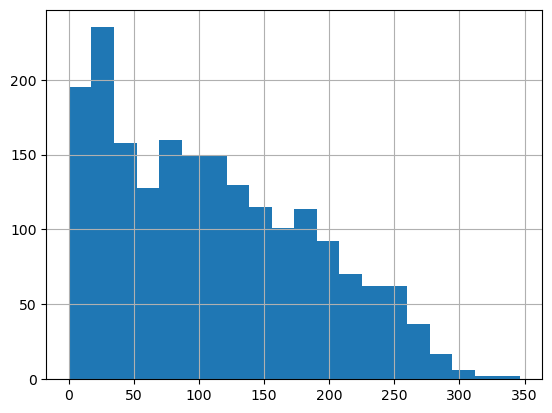

In [71]:
%matplotlib inline
df_MB.RFS_MONTHS.hist(bins=20)

<Axes: xlabel='PATIENT_ID'>

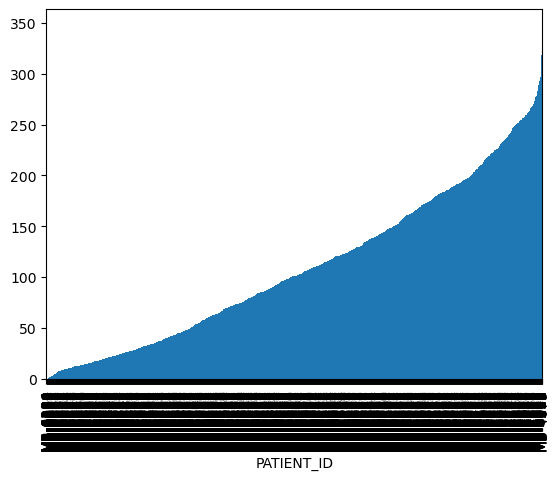

In [72]:
# 全体の再発率プロット
df_MB.sort_values("RFS_MONTHS")["RFS_MONTHS"].plot.bar()

<Axes: xlabel='RFS_STATUS', ylabel='RFS_MONTHS'>

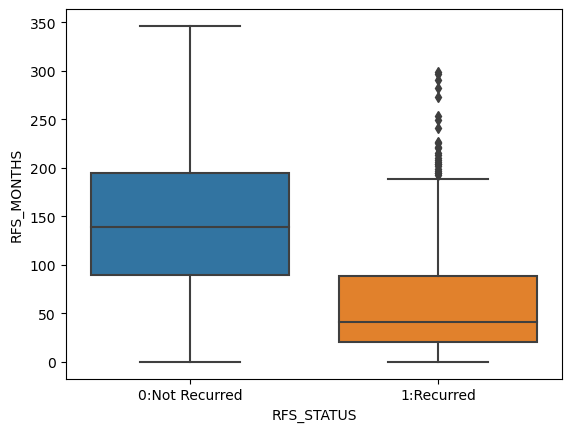

In [73]:
# 再発の有無でのプロット
sns.boxplot(data=df_MB, x="RFS_STATUS", y="RFS_MONTHS")

In [74]:
df_MB[df_MB.RFS_MONTHS < 1]

,LYMPH_NODES_EXAMINED_POSITIVE,NPI,CELLULARITY,COHORT,INFERRED_MENOPAUSAL_STATE,SEX,INTCLUST,AGE_AT_DIAGNOSIS,CLAUDIN_SUBTYPE,THREEGENE,LATERALITY,HISTOLOGICAL_SUBTYPE,SAMPLE_ID,GRADE,ONCOTREE_CODE,PR_STATUS,SAMPLE_TYPE,TMB_NONSYNONYMOUS,CANCER_TYPE,CANCER_TYPE_DETAILED,ER_IHC,HER2_SNP6,ER_STATUS,HER2_STATUS,TUMOR_SIZE,TUMOR_STAGE,CHEMOTHERAPY,HORMONE_THERAPY,RADIO_THERAPY,BREAST_SURGERY,OS_MONTHS,OS_STATUS,VITAL_STATUS,RFS_STATUS,RFS_MONTHS
PATIENT_ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
MB-0284,0.0,1.000,Moderate,1.0,Post,Female,10,51.42,claudin-low,ER-/HER2-,NaN,Ductal/NST,MB-0284,NaN,IDC,Negative,Primary,2.615035,Breast Cancer,Breast Invasive Ductal Carcinoma,NaN,NEUTRAL,Negative,Negative,NaN,NaN,NO,NO,NO,NaN,0.000000,0:LIVING,Living,0:Not Recurred,0.00
MB-0627,0.0,5.040,Moderate,1.0,Post,Female,4ER-,54.10,claudin-low,ER-/HER2-,Right,Ductal/NST,MB-0627,3.0,IDC,Negative,Primary,3.922553,Breast Cancer,Breast Invasive Ductal Carcinoma,Negative,NEUTRAL,Negative,Negative,20.0,NaN,NO,NO,NO,MASTECTOMY,0.766667,0:LIVING,Living,0:Not Recurred,0.76
MB-5311,0.0,3.054,High,3.0,Post,Female,4ER+,73.01,claudin-low,ER-/HER2-,Right,Ductal/NST,MB-5311,2.0,IDC,Positive,Primary,10.460142,Breast Cancer,Breast Invasive Ductal Carcinoma,Positve,NEUTRAL,Positive,Negative,27.0,2.0,NO,YES,YES,BREAST CONSERVING,57.666667,1:DECEASED,Died of Disease,1:Recurred,0.69
MB-5520,4.0,6.050,High,3.0,Pre,Female,7,38.49,LumA,ER+/HER2- High Prolif,Left,Mixed,MB-5520,3.0,MDLC,Negative,Primary,6.537589,Breast Cancer,Breast Mixed Ductal and Lobular Carcinoma,Positve,NEUTRAL,Positive,Negative,25.0,2.0,NO,YES,NO,MASTECTOMY,16.300000,1:DECEASED,Died of Disease,1:Recurred,0.82
MB-6063,16.0,6.240,High,5.0,Post,Female,5,58.90,Normal,HER2+,Left,Ductal/NST,MB-6063,3.0,IDC,Negative,Primary,2.615035,Breast Cancer,Breast Invasive Ductal Carcinoma,Negative,GAIN,Negative,Positive,120.0,NaN,YES,NO,NO,MASTECTOMY,15.600000,1:DECEASED,Died of Disease,1:Recurred,0.36
MB-6098,1.0,5.160,High,5.0,Pre,Female,10,28.29,Basal,NaN,Left,Ductal/NST,MB-6098,3.0,IDC,Negative,Primary,7.845106,Breast Cancer,Breast Invasive Ductal Carcinoma,Negative,NEUTRAL,Negative,Negative,80.0,NaN,YES,NO,NO,MASTECTOMY,10.633333,1:DECEASED,Died of Disease,1:Recurred,0.69
MB-6194,9.0,5.050,High,5.0,Pre,Female,4ER-,44.51,Normal,ER+/HER2- Low Prolif,Left,Mixed,MB-6194,2.0,MDLC,Positive,Primary,10.460142,Breast Cancer,Breast Mixed Ductal and Lobular Carcinoma,Negative,NEUTRAL,Negative,Negative,25.0,2.0,YES,NO,YES,MASTECTOMY,52.466667,1:DECEASED,Died of Disease,1:Recurred,0.00
MB-6229,0.0,2.030,High,5.0,Post,Female,8,75.33,LumA,ER+/HER2- Low Prolif,Right,Ductal/NST,MB-6229,1.0,IDC,Positive,Primary,6.537589,Breast Cancer,Breast Invasive Ductal Carcinoma,Positve,NEUTRAL,Positive,Negative,15.0,1.0,NO,NO,NO,MASTECTOMY,0.100000,1:DECEASED,Died of Disease,1:Recurred,0.10
MB-6230,NaN,5.042,High,5.0,Post,Female,3,52.95,LumA,NaN,Left,Ductal/NST,MB-6230,2.0,IDC,Positive,Primary,0.000000,Breast Cancer,Breast Invasive Ductal Carcinoma,Positve,NEUTRAL,Positive,Negative,21.0,NaN,NO,YES,NO,MASTECTOMY,74.800000,1:DECEASED,Died of Disease,1:Recurred,0.00


In [75]:
df_MB[df_MB.RFS_MONTHS > 5 * 12].shape

(1340, 35)

In [76]:
df_MB

,LYMPH_NODES_EXAMINED_POSITIVE,NPI,CELLULARITY,COHORT,INFERRED_MENOPAUSAL_STATE,SEX,INTCLUST,AGE_AT_DIAGNOSIS,CLAUDIN_SUBTYPE,THREEGENE,LATERALITY,HISTOLOGICAL_SUBTYPE,SAMPLE_ID,GRADE,ONCOTREE_CODE,PR_STATUS,SAMPLE_TYPE,TMB_NONSYNONYMOUS,CANCER_TYPE,CANCER_TYPE_DETAILED,ER_IHC,HER2_SNP6,ER_STATUS,HER2_STATUS,TUMOR_SIZE,TUMOR_STAGE,CHEMOTHERAPY,HORMONE_THERAPY,RADIO_THERAPY,BREAST_SURGERY,OS_MONTHS,OS_STATUS,VITAL_STATUS,RFS_STATUS,RFS_MONTHS
PATIENT_ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
MB-0000,10.0,6.044,NaN,1.0,Post,Female,4ER+,75.65,claudin-low,ER-/HER2-,Right,Ductal/NST,MB-0000,3.0,IDC,Negative,Primary,0.000000,Breast Cancer,Breast Invasive Ductal Carcinoma,Positve,NEUTRAL,Positive,Negative,22.0,2.0,NO,YES,YES,MASTECTOMY,140.500000,0:LIVING,Living,0:Not Recurred,138.65
MB-0002,0.0,4.020,High,1.0,Pre,Female,4ER+,43.19,LumA,ER+/HER2- High Prolif,Right,Ductal/NST,MB-0002,3.0,IDC,Positive,Primary,2.615035,Breast Cancer,Breast Invasive Ductal Carcinoma,Positve,NEUTRAL,Positive,Negative,10.0,1.0,NO,YES,YES,BREAST CONSERVING,84.633333,0:LIVING,Living,0:Not Recurred,83.52
MB-0005,1.0,4.030,High,1.0,Pre,Female,3,48.87,LumB,NaN,Right,Ductal/NST,MB-0005,2.0,IDC,Positive,Primary,2.615035,Breast Cancer,Breast Invasive Ductal Carcinoma,Positve,NEUTRAL,Positive,Negative,15.0,2.0,YES,YES,NO,MASTECTOMY,163.700000,1:DECEASED,Died of Disease,1:Recurred,151.28
MB-0006,3.0,4.050,Moderate,1.0,Pre,Female,9,47.68,LumB,NaN,Right,Mixed,MB-0006,2.0,MDLC,Positive,Primary,1.307518,Breast Cancer,Breast Mixed Ductal and Lobular Carcinoma,Positve,NEUTRAL,Positive,Negative,25.0,2.0,YES,YES,YES,MASTECTOMY,164.933333,0:LIVING,Living,0:Not Recurred,162.76
MB-0008,8.0,6.080,High,1.0,Post,Female,9,76.97,LumB,ER+/HER2- High Prolif,Right,Mixed,MB-0008,3.0,MDLC,Positive,Primary,2.615035,Breast Cancer,Breast Mixed Ductal and Lobular Carcinoma,Positve,NEUTRAL,Positive,Negative,40.0,2.0,YES,YES,YES,MASTECTOMY,41.366667,1:DECEASED,Died of Disease,1:Recurred,18.55
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MB-7295,1.0,5.050,High,4.0,Pre,Female,3,43.10,LumA,ER+/HER2- Low Prolif,Right,Lobular,MB-7295,3.0,ILC,Positive,Primary,5.230071,Breast Cancer,Breast Invasive Lobular Carcinoma,Positve,NEUTRAL,Positive,Negative,25.0,NaN,NO,YES,YES,BREAST CONSERVING,196.866667,0:LIVING,Living,0:Not Recurred,194.28
MB-7296,1.0,5.040,High,4.0,Pre,Female,5,42.88,LumB,NaN,NaN,Ductal/NST,MB-7296,3.0,IDC,Negative,Primary,7.845106,Breast Cancer,Breast Invasive Ductal Carcinoma,Positve,GAIN,Positive,Positive,20.0,NaN,NO,NO,YES,MASTECTOMY,44.733333,1:DECEASED,Died of Disease,1:Recurred,16.09
MB-7297,45.0,6.050,High,4.0,Post,Female,1,62.90,LumB,NaN,Left,Ductal/NST,MB-7297,3.0,IDC,Positive,Primary,5.230071,Breast Cancer,Breast Invasive Ductal Carcinoma,Positve,NEUTRAL,Positive,Negative,25.0,NaN,NO,YES,YES,MASTECTOMY,175.966667,1:DECEASED,Died of Disease,1:Recurred,121.18


## 全体の再発期間のばらつき

In [77]:
year = 5
df_tmp = df_MB[df_MB.RFS_STATUS == "0:Not Recurred"]
print("survived > 60 months (not recurred): ", (df_tmp.RFS_MONTHS > 12 * year).sum())
df_tmp = df_MB[df_MB.RFS_STATUS == "1:Recurred"]
print("RFS MONTHS <= 60 months (recurred): ", (df_tmp.RFS_MONTHS <= 12 * year).sum())
df_tmp = df_MB[df_MB.RFS_STATUS == "1:Recurred"]
print("RFS MONTHS > 12 (recurred): ", (df_tmp.RFS_MONTHS > 12 * year).sum())

del df_tmp

survived > 60 months (not recurred):  1031
RFS MONTHS <= 60 months (recurred):  495
RFS MONTHS > 12 (recurred):  309


### 分布ヒストグラム

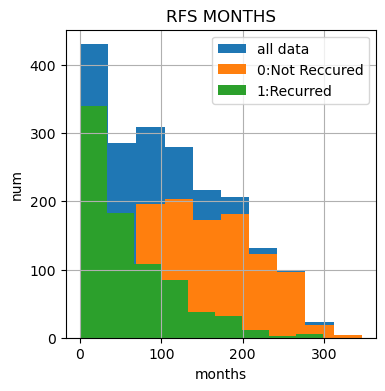

In [78]:
plt.figure(figsize=(4, 4))

df_MB.RFS_MONTHS.hist(bins=int(math.log2(df_MB.shape[0])), label="all data")

df_plot = df_MB[df_MB.RFS_STATUS == "0:Not Recurred"]
df_plot.RFS_MONTHS.hist(bins=int(math.log2(df_plot.shape[0])), label="0:Not Reccured")
df_plot = df_MB[df_MB.RFS_STATUS == "1:Recurred"]
df_plot.RFS_MONTHS.hist(bins=int(math.log2(df_plot.shape[0])), label="1:Recurred")

plt.legend()
plt.title("RFS MONTHS")
plt.ylabel("num")
plt.xlabel("months")
plt.plot()
del df_plot

0:Not Reccured -> 初診から最終フォローアップまでの期間なので注意

<BarContainer object of 5 artists>

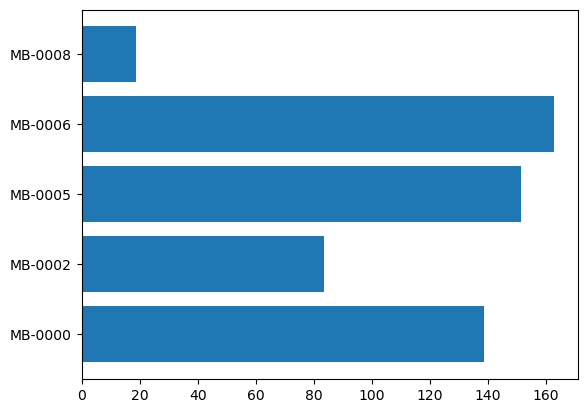

In [79]:
plt.barh(y=df_MB.head().index, width=df_MB.RFS_MONTHS.head())

### KM lineの描画
全体の再発期間の可視化のためにカプランマイヤー曲線を描画

**打ち切り**
右側打ち切り：再発なし患者  
左側打ち切り：なし（今回のデータでは初診からすでに再発している患者がいるか不明なため）  

**注意点**
RFS_MONTHSは再発者であれば初診～再発の期間を示すが、非再発者であれば初診から最終フォローアップまでの期間を示している。  

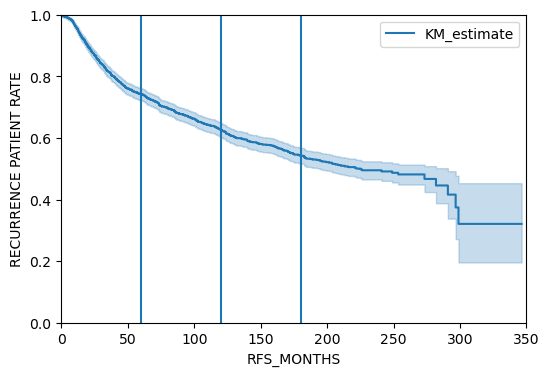

In [80]:
fig = plt.figure(figsize=(6, 4))
ax = fig.add_subplot()

df_plot = df_MB[["RFS_MONTHS", "RFS_STATUS"]]
df_plot = df_plot.replace({"0:Not Recurred": False, "1:Recurred": True})
kmf = KaplanMeierFitter()
kmf.fit(durations=df_plot.RFS_MONTHS, event_observed=df_plot.RFS_STATUS)
kmf.plot()

ax.set_xlabel("RFS_MONTHS")
ax.set_ylabel("RECURRENCE PATIENT RATE")
ax.axvline(5 * 12)
ax.axvline(10 * 12)
ax.axvline(15 * 12)
plt.xlim(0, 350)
plt.ylim(0, 1.0)
plt.show()

del df_plot

In [81]:
def EDA_subgroup_relations(
    subgroup_name: str, thresholt_year: int = year, print_ratio=False
):
    # 統計情報
    if print_ratio:
        print("欠損値数：", df_MB[subgroup_name].isna().sum())
        df_recurred = df_MB[df_MB.RFS_STATUS == "1:Recurred"]
        print("再発者/全患者")
        print(
            df_recurred[subgroup_name].value_counts()
            / df_MB[subgroup_name].value_counts()
        )
        print("{0}年以内再発者/全再発者".format(thresholt_year))
        print(
            df_recurred[df_recurred.RFS_MONTHS <= 12 * thresholt_year][
                subgroup_name
            ].value_counts()
            / df_recurred[subgroup_name].value_counts()
        )
        print("{0}年以後再発者/全再発者".format(thresholt_year))
        print(
            df_recurred[df_recurred.RFS_MONTHS > 12 * thresholt_year][
                subgroup_name
            ].value_counts()
            / df_recurred[subgroup_name].value_counts()
        )

    # カプランマイヤー曲線可視化

    for subgroup in df_MB[subgroup_name].unique():
        if type(subgroup) != str:
            continue
        df_subgroup = df_MB[df_MB[subgroup_name] == subgroup][
            ["RFS_MONTHS", "RFS_STATUS"]
        ]
        df_subgroup = df_subgroup.replace({"0:Not Recurred": False, "1:Recurred": True})
        kmf = KaplanMeierFitter()
        kmf.fit(
            durations=df_subgroup.RFS_MONTHS,
            event_observed=df_subgroup.RFS_STATUS,
            label=subgroup,
        )
        kmf.plot(ci_show=False)
    plt.xlabel("RFS_MONTHS")
    plt.ylabel("RECURRENCE PATIENT RATE")
    plt.axvline(5 * 12)
    plt.axvline(10 * 12)
    plt.axvline(15 * 12)
    plt.title(subgroup_name)
    plt.xlim(0, 350)
    plt.ylim(0, 1.0)
    del df_subgroup

## サブグループの特徴がカテゴリ変数の場合

### CLAUDIN_SUBTYPE

注目したい要因

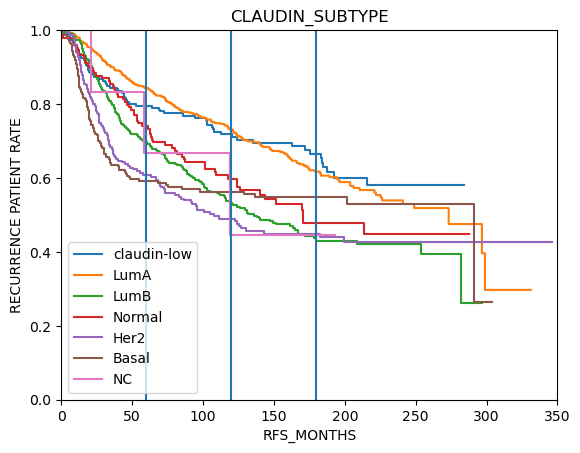

In [30]:
EDA_subgroup_relations("CLAUDIN_SUBTYPE")

### その他の要因（注目度低）

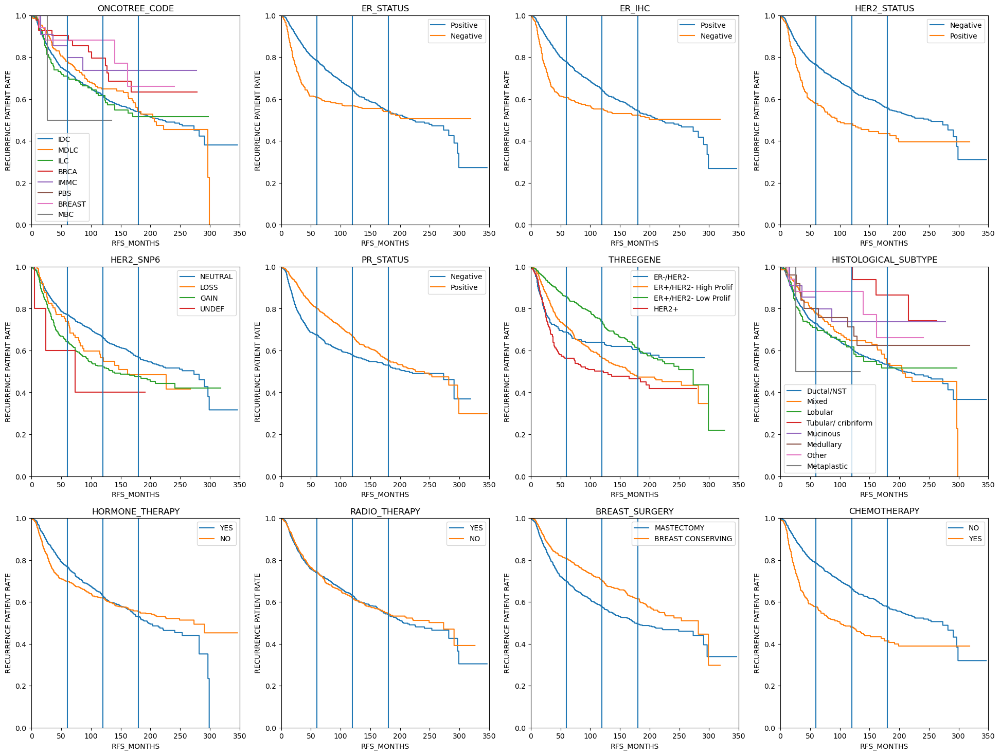

In [31]:
columns = [
    "ONCOTREE_CODE",
    "ER_STATUS",
    "ER_IHC",
    "HER2_STATUS",
    "HER2_SNP6",
    "PR_STATUS",
    "THREEGENE",
    "HISTOLOGICAL_SUBTYPE",
    "HORMONE_THERAPY",
    "RADIO_THERAPY",
    "BREAST_SURGERY",
    "CHEMOTHERAPY",
]

plt.figure(figsize=(24, 18))
for i, column in enumerate(columns):
    plt.subplot(3, 4, i + 1)
    EDA_subgroup_relations(column)
plt.show()

## サブグループの特徴が数値データの場合（カテゴリ化する必要がある）

### NPI
ノッティンガムの予後指数：https://en.wikipedia.org/wiki/Nottingham_Prognostic_Index  

### 腫瘍サイズ

乳癌のステージの定義：https://oshiete-gan.jp/breast/diagnosis/stages/detail.html

腫瘍サイズ0mm/20mm/50mmで区切るのがよさそう？

### リンパ節陽性数

層別化ソース：https://medical.nikkeibp.co.jp/leaf/all/cancernavi/news/201403/535575.html

#NPI
欠損値数： 1
最小値： 1.0  最大値： 6.68
#TUMOR_SIZE
欠損値数： 26
最小値： 1.0  最大値： 182.0
#LYMPH_NODES_EXAMINED_POSITIVE
欠損値数： 76
最小値： 0.0  最大値： 45.0
1/4分位点： 0.0  1/2分位点： 0.0  3/4分位点： 2.0


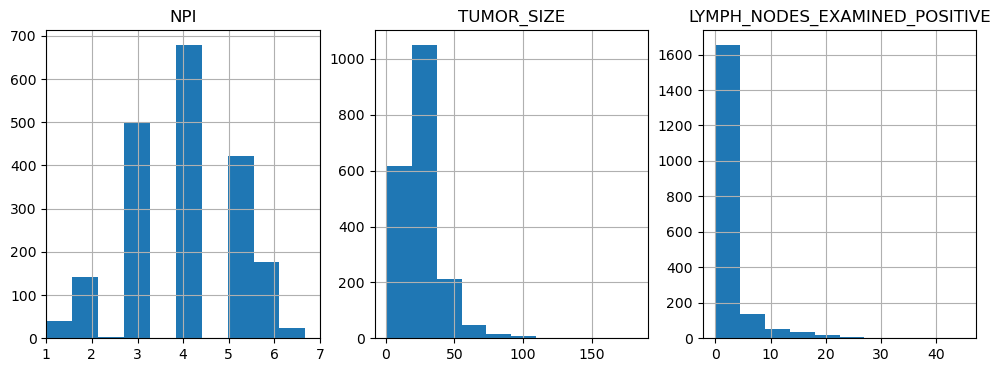

In [35]:
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
print("#NPI")
print("欠損値数：", df_MB.NPI.isna().sum())
print("最小値：", df_MB.NPI.min(), " 最大値：", df_MB.NPI.max())
plt.xlim(1, int(df_MB.NPI.max() + 1))
plt.title("NPI")
df_MB.NPI.hist(bins=int(math.log2(df_MB.shape[0])))

plt.subplot(1, 3, 2)
print("#TUMOR_SIZE")
print("欠損値数：", df_MB.TUMOR_SIZE.isna().sum())
print("最小値：", df_MB.TUMOR_SIZE.min(), " 最大値：", df_MB.TUMOR_SIZE.max())
plt.title("TUMOR_SIZE")
df_MB.TUMOR_SIZE.hist(bins=int(math.log2(df_MB.shape[0])))

plt.subplot(1, 3, 3)
print("#LYMPH_NODES_EXAMINED_POSITIVE")
print("欠損値数：", df_MB.LYMPH_NODES_EXAMINED_POSITIVE.isna().sum())
print(
    "最小値：",
    df_MB.LYMPH_NODES_EXAMINED_POSITIVE.min(),
    " 最大値：",
    df_MB.LYMPH_NODES_EXAMINED_POSITIVE.max(),
)
print(
    "1/4分位点：",
    df_MB["LYMPH_NODES_EXAMINED_POSITIVE"].quantile(0.25),
    " 1/2分位点：",
    df_MB["LYMPH_NODES_EXAMINED_POSITIVE"].quantile(0.5),
    " 3/4分位点：",
    df_MB["LYMPH_NODES_EXAMINED_POSITIVE"].quantile(0.75),
)
plt.title("LYMPH_NODES_EXAMINED_POSITIVE")
df_MB.LYMPH_NODES_EXAMINED_POSITIVE.hist(bins=int(math.log2(df_MB.shape[0])))
plt.show()

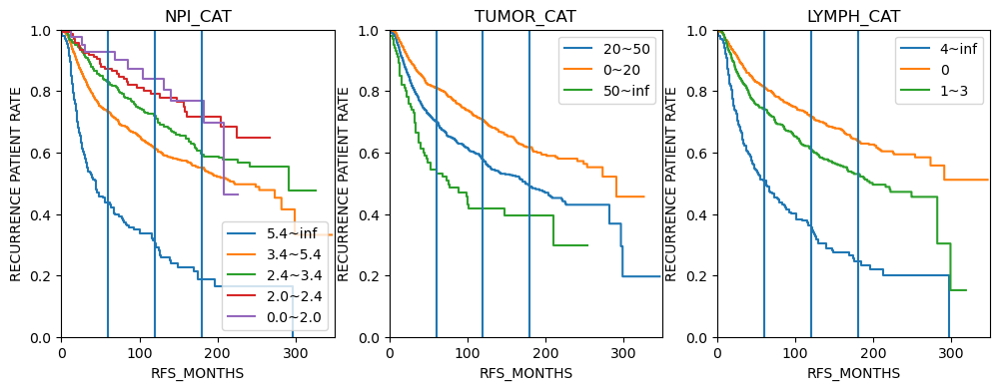

In [36]:
df_MB["NPI_CAT"] = pd.cut(
    df_MB.NPI,
    [0, 2.0, 2.4, 3.4, 5.4, np.inf],
    labels=["0.0~2.0", "2.0~2.4", "2.4~3.4", "3.4~5.4", "5.4~inf"],
)


df_MB["TUMOR_CAT"] = pd.cut(
    df_MB.TUMOR_SIZE, [0, 20, 50, np.inf], labels=["0~20", "20~50", "50~inf"]
)

df_MB["LYMPH_CAT"] = pd.cut(
    df_MB.LYMPH_NODES_EXAMINED_POSITIVE,
    [-np.inf, 0, 3, np.inf],
    labels=["0", "1~3", "4~inf"],
)


plt.figure(figsize=(12, 4))
columns = ["NPI_CAT", "TUMOR_CAT", "LYMPH_CAT"]
for i, column in enumerate(columns):
    plt.subplot(1, 3, i + 1)
    EDA_subgroup_relations(column)
plt.show()

### その他の要因（注目度低）

欠損値数： 88
最小値： 1.0  最大値： 3.0


<Axes: >

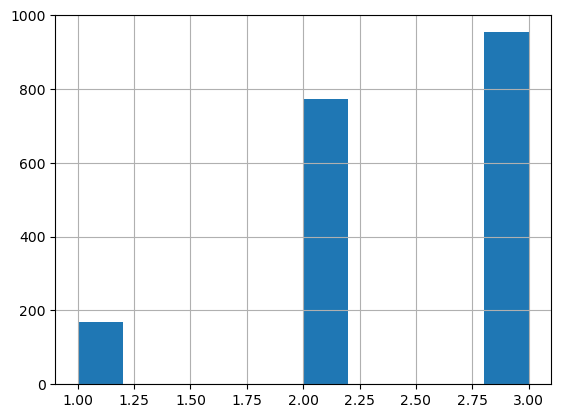

In [37]:
print("欠損値数：", df_MB.GRADE.isna().sum())
print(
    "最小値：",
    df_MB.GRADE.min(),
    " 最大値：",
    df_MB.GRADE.max(),
)
df_MB.GRADE.hist(bins=int(math.log2(df_MB.shape[0])))

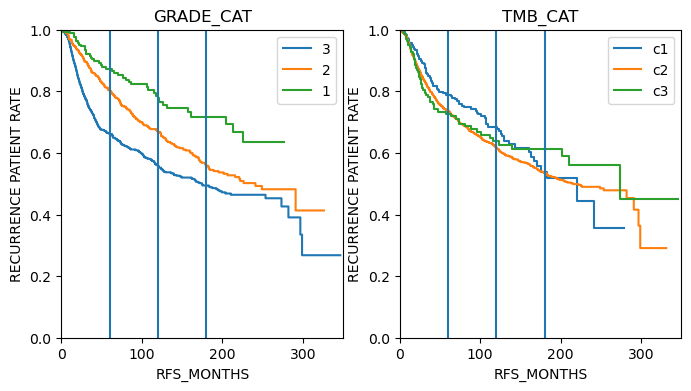

In [38]:
df_MB["GRADE_CAT"] = pd.cut(
    df_MB.GRADE,
    [0, 1, 2, 3],
    labels=[
        "1",
        "2",
        "3",
    ],
)

df_MB["TMB_CAT"] = pd.qcut(
    df_MB.TMB_NONSYNONYMOUS, [0, 0.1, 0.9, 1], labels=["c1", "c2", "c3"]
)

plt.figure(figsize=(8, 4))
columns = ["GRADE_CAT", "TMB_CAT"]
for i, column in enumerate(columns):
    plt.subplot(1, 2, i + 1)
    EDA_subgroup_relations(column)
plt.show()

# 遺伝子発現量データのEDA

## 各マイクロアレイ手法毎の確認

mrna_agilent_microarrayとmrna_agilent_microarray_zscores_ref_all_samplesの遺伝子は完全に一致しているが、mrna_agilent_microarray_zscores_ref_diploid_samplesはそれら2つとは違う（特徴量数が不足している）ことを確認済み

# 再発者のみのデータのEDA

2-preprocess_RFSノートブックから、前処理をして再発者に限定したdf: df_recurrencedを取り出す

In [82]:
# 臨床データ（層別化対象）と遺伝子データが結合されており、再発者に限定されている

df_recurrenced = pd.read_pickle(
    config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/df_recurrenced4numeric.pkl"
)
df_recurrenced = pd.merge(
    df_MB["RFS_MONTHS"], df_recurrenced, right_index=True, left_index=True
)
df_recurrenced

,RFS_MONTHS_x,RFS_MONTHS_y,RFS_STATUS,CLAUDIN_SUBTYPE,THREEGENE,RERE,RNF165,PHF7,CIDEA,TENT2,SLC17A3,SDS,ATP6V1C2,F3,FAM71C,LIN52,PCOTH,GRM1,FXN,SLC9A1,PML,CD164,MOB3A,HGC6.1.1,OR1J2,...,SHISA2,BCAT1,NCKAP1L,CATSPERD,AK098705,PSMC3IP,TEAD1,TTC41P,GRHPR,CHRNB1,RAB4B-EGLN2,TBC1D4,TSPAN11,ANGPTL2,ENOX1,LOC283104,VN1R4,TRPV5,UGGT1,CR590356,VPS72,CSMD3,CC2D1A,IGSF9,FAM71A
MB-0000,138.65,138.65,False,claudin-low,ER-_HER2-,9.738092,6.469688,5.652674,11.558869,8.340484,5.648494,5.336235,5.468668,7.070649,5.477154,6.811309,5.440853,5.361170,5.823306,8.809831,6.790593,6.141047,6.499117,5.669507,5.469022,...,6.155340,6.285499,6.547422,5.353135,5.198876,5.901473,5.610397,5.515762,8.139151,6.476209,10.232505,7.311327,5.458092,9.677952,5.918239,5.295203,5.474224,5.415184,7.021679,5.947334,8.010657,5.299815,6.235804,5.947404,5.133576
MB-0002,83.52,83.52,False,LumA,ER+_HER2-_High_Prolif,9.013876,5.748717,5.611212,6.199492,8.341091,5.789506,5.700974,5.495295,6.098949,5.589824,6.952007,5.545206,5.579463,6.341935,9.307305,6.132436,6.400910,7.178274,5.697691,5.434639,...,9.409817,6.094350,5.683700,4.888335,5.615278,6.447777,5.950548,5.502117,8.261487,6.706565,10.186566,6.324112,5.375676,8.895600,5.515844,5.442257,5.303871,5.507905,7.612797,5.519225,7.988643,5.194247,6.328059,6.938685,5.604560
MB-0005,151.28,151.28,True,LumB,NaN,7.963493,5.553056,5.793398,6.489781,8.862815,5.566713,7.233671,5.537530,6.964546,5.255454,6.480061,5.790445,5.462634,5.807004,8.477327,5.572601,8.575001,6.469047,5.329956,5.575368,...,9.094121,7.387453,6.217209,5.313808,5.508167,6.076896,5.747801,5.368297,7.731911,6.944685,9.954702,7.222594,5.475184,8.972083,5.350242,5.368716,5.370394,5.314009,6.619220,5.496590,8.044471,5.306294,6.306927,7.397672,5.645597
MB-0006,162.76,162.76,False,LumB,NaN,8.177157,5.391160,5.807604,5.319779,8.693784,5.539252,6.124384,6.657355,6.409554,5.289307,5.987913,5.393475,5.282728,5.985588,8.101386,5.808433,9.164529,6.487679,5.343103,5.638589,...,10.039994,7.731911,6.033998,5.228991,5.324400,5.650472,5.579526,5.303998,8.301195,6.682616,10.088769,7.053031,5.516231,8.664307,5.650978,5.295628,5.694697,5.410028,6.966482,5.600679,7.527300,5.197607,6.515638,6.175716,5.354582
MB-0008,18.55,18.55,True,LumB,ER+_HER2-_High_Prolif,8.050127,5.530582,5.934570,8.787583,8.055626,5.646685,7.155642,5.878104,5.798117,5.297733,6.675580,6.598310,5.328773,6.200995,9.301414,6.182025,5.904271,6.426740,5.402129,5.486989,...,5.929184,6.289241,6.215874,5.322069,5.136661,6.403137,5.904885,5.473140,8.007261,6.438823,11.244345,5.926732,5.385006,8.141539,5.527755,5.192858,5.474929,5.389733,6.942461,6.707482,8.115359,5.254136,6.323751,6.272568,5.030636
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MB-7295,194.28,194.28,False,LumA,ER+_HER2-_Low_Prolif,8.589374,6.002483,5.802742,5.474550,8.251690,5.546402,6.532649,5.535139,6.282020,5.440358,6.486128,6.074573,5.281556,6.058330,8.722802,5.891944,6.315133,6.707501,5.382979,5.673238,...,8.989206,7.504936,6.538325,5.394435,5.324246,6.132406,5.471503,5.372043,8.455392,6.864004,10.303605,6.686198,5.593446,9.987552,5.722099,5.240904,5.521765,5.646490,7.536208,5.824289,8.314500,5.337300,6.278034,6.923887,5.168953
MB-7296,16.09,16.09,True,LumB,NaN,8.402660,6.104059,5.256086,6.659117,8.641838,5.522964,7.102716,5.353956,5.546199,5.289827,6.491748,5.865518,5.564988,6.132467,8.814733,6.236368,6.257710,6.223216,5.903257,5.256140,...,6.453953,6.804857,6.687314,5.304696,5.396539,6.221306,5.315972,5.300309,8.523291,6.031903,11.353435,6.623708,4.964861,8.441388,5.453321,5.171671,5.441341,5.612519,7.709596,5.899345,8.105717,5.397931,6.325456,6.524268,5.252479
MB-7297,121.18,121.18,True,LumB,NaN,8.236918,5.402870,5.571897,5.439574,8.979375,5.804127,6.593890,5.353883,5.705768,5.531300,6.906297,6.116738,5.132988,6.031882,8.530870,5.744546,6.865706,6.589864,5.595558,5.369984,...,8.233227,6.7467

## 再発までの期間と遺伝子発現量の相関の確認

実行時間がかかるので注意

In [83]:
drop_columns = [
    "RFS_OVER_60MONTHS",
    "CLAUDIN_SUBTYPE",
    "NPI_CAT",
    "TUMOR_CAT",
    "LYMPH_CAT",
]

# 前処理後の再発者に限定した患者の、各遺伝子と再発までの期間の相関係数
# ※非再発者は再発期間がないので見ていない

"""
corr = pd.merge(
    df_recurrenced.drop(drop_columns, axis=1), df_MB.RFS_MONTHS, left_index=True, right_index=True
).corr()
corr["RFS_MONTHS"].drop("RFS_MONTHS").sort_values(ascending=False).hist()
"""
pass

生の遺伝子発現量情報のみでは相関は見られない（目安：0.5以上ぐらいが相関があると考えられている）

# クラスタリング

遺伝子発現量数が多いが、削除してしまうと候補の対象外となってしまう→クラスターで特徴量数を削減した上で、代表値と再発期間の関連を見る

参考
- https://qiita.com/Hatomugi/items/d6c8bb1a049d3a84feaa
- https://qiita.com/g-k/items/120f1cf85ff2ceae4aba


## PCA
 
特徴量から平均を引く（センタリング）ことは必須  
しかし、標準偏差で割る（標準化する）ことについては議論があるとのこと
https://qiita.com/koshian2/items/2e69cb4981ae8fbd3bda

In [84]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from scipy import stats


# 再発期間の数値情報
df_recurrenced = pd.read_pickle(
    config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/df_recurrenced4numeric.pkl"
)
#df_recurrenced = pd.merge(
    #df_MB["RFS_MONTHS"], df_recurrenced, right_index=True, left_index=True
#)

# 特徴量のセンタリング
df_gene_expressions = df_mrna_agilent_microarray.copy()
df_center = df_recurrenced[df_gene_expressions.columns] - df_recurrenced[
    df_gene_expressions.columns
].mean(axis=0)

#pca
pca = PCA(n_components=0.95, random_state=config.SEED)
pca.fit(df_center)
reduced_data = pca.transform(df_center)

In [85]:
df_recurrenced

,RFS_MONTHS,RFS_STATUS,CLAUDIN_SUBTYPE,THREEGENE,RERE,RNF165,PHF7,CIDEA,TENT2,SLC17A3,SDS,ATP6V1C2,F3,FAM71C,LIN52,PCOTH,GRM1,FXN,SLC9A1,PML,CD164,MOB3A,HGC6.1.1,OR1J2,GNG5,...,SHISA2,BCAT1,NCKAP1L,CATSPERD,AK098705,PSMC3IP,TEAD1,TTC41P,GRHPR,CHRNB1,RAB4B-EGLN2,TBC1D4,TSPAN11,ANGPTL2,ENOX1,LOC283104,VN1R4,TRPV5,UGGT1,CR590356,VPS72,CSMD3,CC2D1A,IGSF9,FAM71A
MB-0000,138.65,False,claudin-low,ER-_HER2-,9.738092,6.469688,5.652674,11.558869,8.340484,5.648494,5.336235,5.468668,7.070649,5.477154,6.811309,5.440853,5.361170,5.823306,8.809831,6.790593,6.141047,6.499117,5.669507,5.469022,8.091453,...,6.155340,6.285499,6.547422,5.353135,5.198876,5.901473,5.610397,5.515762,8.139151,6.476209,10.232505,7.311327,5.458092,9.677952,5.918239,5.295203,5.474224,5.415184,7.021679,5.947334,8.010657,5.299815,6.235804,5.947404,5.133576
MB-0002,83.52,False,LumA,ER+_HER2-_High_Prolif,9.013876,5.748717,5.611212,6.199492,8.341091,5.789506,5.700974,5.495295,6.098949,5.589824,6.952007,5.545206,5.579463,6.341935,9.307305,6.132436,6.400910,7.178274,5.697691,5.434639,8.571327,...,9.409817,6.094350,5.683700,4.888335,5.615278,6.447777,5.950548,5.502117,8.261487,6.706565,10.186566,6.324112,5.375676,8.895600,5.515844,5.442257,5.303871,5.507905,7.612797,5.519225,7.988643,5.194247,6.328059,6.938685,5.604560
MB-0005,151.28,True,LumB,NaN,7.963493,5.553056,5.793398,6.489781,8.862815,5.566713,7.233671,5.537530,6.964546,5.255454,6.480061,5.790445,5.462634,5.807004,8.477327,5.572601,8.575001,6.469047,5.329956,5.575368,8.016276,...,9.094121,7.387453,6.217209,5.313808,5.508167,6.076896,5.747801,5.368297,7.731911,6.944685,9.954702,7.222594,5.475184,8.972083,5.350242,5.368716,5.370394,5.314009,6.619220,5.496590,8.044471,5.306294,6.306927,7.397672,5.645597
MB-0006,162.76,False,LumB,NaN,8.177157,5.391160,5.807604,5.319779,8.693784,5.539252,6.124384,6.657355,6.409554,5.289307,5.987913,5.393475,5.282728,5.985588,8.101386,5.808433,9.164529,6.487679,5.343103,5.638589,8.323978,...,10.039994,7.731911,6.033998,5.228991,5.324400,5.650472,5.579526,5.303998,8.301195,6.682616,10.088769,7.053031,5.516231,8.664307,5.650978,5.295628,5.694697,5.410028,6.966482,5.600679,7.527300,5.197607,6.515638,6.175716,5.354582
MB-0008,18.55,True,LumB,ER+_HER2-_High_Prolif,8.050127,5.530582,5.934570,8.787583,8.055626,5.646685,7.155642,5.878104,5.798117,5.297733,6.675580,6.598310,5.328773,6.200995,9.301414,6.182025,5.904271,6.426740,5.402129,5.486989,8.068202,...,5.929184,6.289241,6.215874,5.322069,5.136661,6.403137,5.904885,5.473140,8.007261,6.438823,11.244345,5.926732,5.385006,8.141539,5.527755,5.192858,5.474929,5.389733,6.942461,6.707482,8.115359,5.254136,6.323751,6.272568,5.030636
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MB-7295,194.28,False,LumA,ER+_HER2-_Low_Prolif,8.589374,6.002483,5.802742,5.474550,8.251690,5.546402,6.532649,5.535139,6.282020,5.440358,6.486128,6.074573,5.281556,6.058330,8.722802,5.891944,6.315133,6.707501,5.382979,5.673238,8.492533,...,8.989206,7.504936,6.538325,5.394435,5.324246,6.132406,5.471503,5.372043,8.455392,6.864004,10.303605,6.686198,5.593446,9.987552,5.722099,5.240904,5.521765,5.646490,7.536208,5.824289,8.314500,5.337300,6.278034,6.923887,5.168953
MB-7296,16.09,True,LumB,NaN,8.402660,6.104059,5.256086,6.659117,8.641838,5.522964,7.102716,5.353956,5.546199,5.289827,6.491748,5.865518,5.564988,6.132467,8.814733,6.236368,6.257710,6.223216,5.903257,5.256140,8.653936,...,6.453953,6.804857,6.687314,5.304696,5.396539,6.221306,5.315972,5.300309,8.523291,6.031903,11.353435,6.623708,4.964861,8.441388,5.453321,5.171671,5.441341,5.612519,7.709596,5.899345,8.105717,5.397931,6.325456,6.524268,5.252479
MB-7297,121.18,True,LumB,NaN,8.236918,5.402870,5.571897,5.439574,8.979375,5.804127,6.593890,5.353883,5.705768,5.531300,6.906297,6.116738,5.132988,6.031882,8.530870,5.744546,6.865706,6.589864,5.595558,5.369984,9.108238,...,8.2332

plot

pcaによって説明分散比の95%を保持するクラスターの数:  1098


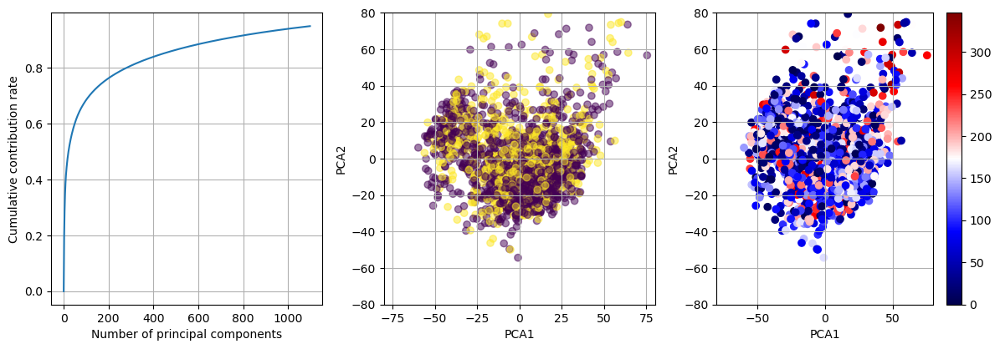

In [37]:
plt.figure(figsize=(12, 12))

# pcaで削減された後に残る情報量の推移の可視化
plt.subplot(331)
plt.xlabel("Number of principal components")
plt.ylabel("Cumulative contribution rate")
plt.grid()
plt.plot([0] + list(np.cumsum(pca.explained_variance_ratio_)), "-")
print("pcaによって説明分散比の95%を保持するクラスターの数: ", pca.n_components_)


# pcaの前段階で標準化していないので、正直可視化しないほうが良い（ミスリードに繋がる）
# 2次元まで落とし込んだときの散布図（目的変数で色分け）
plt.subplot(332)
plt.scatter(
    reduced_data[:, 0],
    reduced_data[:, 1],
    alpha=0.5,
    #c=list(df_recurrenced["RFS_OVER_60MONTHS"]),
    c=list(df_recurrenced["RFS_STATUS"])
)
plt.grid()
plt.xlabel("PCA1")
plt.ylabel("PCA2")
plt.xlim(-80, 80)
plt.ylim(-80, 80)


import matplotlib.cm as cm


plt.subplot(333)
sc = plt.scatter(
    reduced_data[:, 0],
    reduced_data[:, 1],
    c=df_recurrenced["RFS_MONTHS"],
    cmap=cm.seismic,
)
plt.grid()
plt.xlabel("PCA1")
plt.ylabel("PCA2")
plt.xlim(-80, 80)
plt.ylim(-80, 80)
plt.tight_layout()
plt.colorbar(sc)
plt.show()

,pca0,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,pca11,pca12,pca13,pca14,pca15,pca16,pca17,pca18,pca19,pca20,pca21,pca22,pca23,pca24,...,pca1073,pca1074,pca1075,pca1076,pca1077,pca1078,pca1079,pca1080,pca1081,pca1082,pca1083,pca1084,pca1085,pca1086,pca1087,pca1088,pca1089,pca1090,pca1091,pca1092,pca1093,pca1094,pca1095,pca1096,pca1097
MB-0000,-26.258446,-23.806546,-33.780639,0.548266,-17.483235,25.154879,14.078535,-3.289753,19.104098,-20.493178,8.420463,4.618575,0.394286,20.446231,-2.074733,11.788071,7.002824,2.525541,0.723803,4.888134,3.369050,1.934337,-0.257669,-1.662116,-0.433208,...,-0.345987,0.476249,-0.784906,0.642214,-0.510248,-0.126746,0.468620,0.564363,0.201460,-1.406509,-1.498869,-0.799255,0.534891,1.072948,1.586831,0.132329,0.815870,0.331585,0.705782,-0.031921,-0.832776,0.240383,-0.061956,-1.194341,-0.703656
MB-0002,19.268698,-14.265785,11.570168,4.113931,-13.948555,1.607457,-10.831681,-7.416905,4.217922,-8.640395,-0.592085,0.564840,3.205134,-15.776415,14.949286,-15.658216,1.491373,2.972183,2.648997,3.505682,4.886030,0.274665,-8.941561,0.976237,0.603110,...,0.244458,0.766401,0.258182,1.232304,-0.751138,0.633987,0.804369,-0.080773,0.036461,-0.008253,0.190388,-0.782694,-0.031592,-0.386438,-0.275455,0.117419,1.372605,-0.102558,-0.139484,0.510048,-1.023843,0.278577,-0.578351,1.019243,-0.306873
MB-0005,-15.550493,-43.936102,19.631318,27.004358,-17.923729,-18.504394,-4.499667,10.232901,-4.626843,7.221291,3.882066,-0.250436,-7.237645,3.920690,4.706213,-6.013222,4.210491,5.081623,-2.027131,1.656372,7.673578,7.973777,-3.666756,-4.486779,-5.691796,...,-0.712296,0.045470,-0.875027,-0.554462,-0.980694,1.666378,-0.350716,-0.696855,-0.259757,-0.040267,0.341106,-1.349614,-0.269632,-0.647697,-1.153409,0.860046,-0.971647,-0.459950,-1.410210,-0.326335,0.129681,1.019470,1.019068,-0.193310,0.166389
MB-0006,-13.013427,-30.106498,23.573439,39.296966,-9.591694,-13.622414,-12.962102,-1.986943,7.260064,10.280160,-0.493236,-8.494893,-1.178973,7.047892,7.636332,5.809762,-4.176089,-2.998891,-10.790854,-11.613208,8.983377,9.257042,-8.087815,-0.648215,8.687157,...,0.206552,0.526775,-0.283878,-0.668455,-0.242454,-1.398556,0.631065,-0.163031,-0.438442,-0.334473,-0.840885,-0.695371,-0.186587,0.090165,-0.575139,0.609792,0.166248,-0.470293,-0.848116,0.115688,-1.069449,0.520601,0.545018,0.131883,-0.261419
MB-0008,-3.011224,-10.368448,21.974165,-4.458808,12.278720,-2.340996,-3.425784,-14.021089,3.909124,-12.584194,9.526632,-1.063967,-11.333505,-4.215563,-0.177059,8.679646,4.306201,-3.428025,-5.998295,2.420528,-0.051999,15.809754,-2.453438,6.620202,-0.550522,...,-0.236641,-0.355628,0.241930,0.331147,-0.810581,-0.506780,-1.042232,-0.147904,-0.065568,-0.378452,-1.875628,0.057615,-0.870278,0.000248,0.808495,-0.002868,0.348103,0.251766,0.484327,-1.034623,0.145030,-0.471015,-0.296072,-0.616442,0.303228


<Axes: >

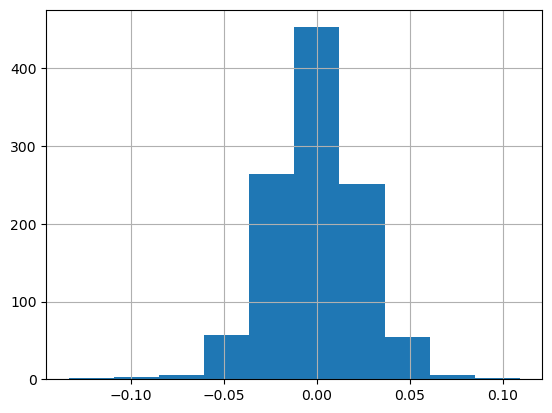

In [38]:
# PCA変換後の各サンプルへの値（PCAは何を表しているのだろう？平均値や中央値のような単純なものではなさそう）
# https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html
df_pca = pd.DataFrame(
    reduced_data, index=df_recurrenced.index, columns=pca.get_feature_names_out()
)
display(df_pca.head())


# 再発期間との相関係数
corr_pca = pd.merge(df_pca, df_MB.RFS_MONTHS, left_index=True, right_index=True).corr()
corr_pca["RFS_MONTHS"].drop("RFS_MONTHS").sort_values(ascending=False).hist()

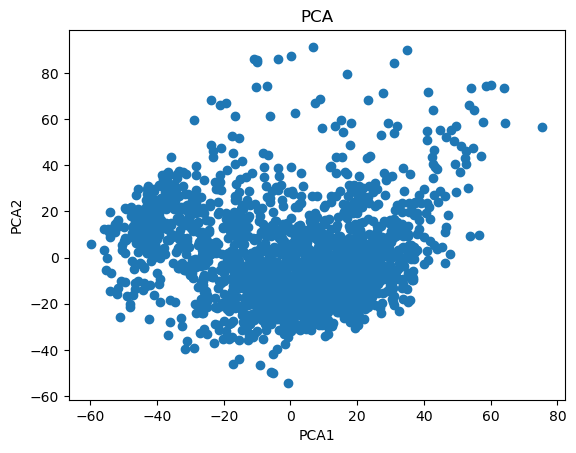

In [39]:
# 変換後のデータのプロット
import matplotlib.pyplot as plt
plt.scatter(reduced_data[:, 0], reduced_data[:, 1])
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.title('PCA')
plt.show()

- pca0ではESR1が最も表されており、DR033780は最も表されていない
- 再発期間との相関係数は低い

### pcaに変換する過程での、遺伝子発現量の寄与度合い（重要さ？）

In [40]:
# 遺伝子→pcaへ変換するための行列の一部（pca0）
# 因子負荷量の絶対値が大きい特徴量ほど、pca後の特徴量をよく表している。
# pcaへの寄与度合？の絶対値順に表示
pd.DataFrame(
    pca.components_,
    index=pca.get_feature_names_out(),
    columns=df_gene_expressions.columns,
).T["pca0"].apply(lambda x: abs(x)).sort_values(ascending=False)

Hugo_Symbol
ESR1        7.218441e-02
TFF3        6.821494e-02
ANKRD30A    6.466894e-02
AGR3        6.324154e-02
TFF1        6.152378e-02
                ...     
ZFR2        5.280413e-07
KCTD15      4.845109e-07
SHISAL2B    4.346950e-07
SALL1       2.278456e-07
H1-8        2.220845e-07
Name: pca0, Length: 20603, dtype: float64

In [41]:
pd.DataFrame(
    pca.components_,
    index=pca.get_feature_names_out(),
    columns=df_gene_expressions.columns,
).T["pca1"].apply(lambda x: abs(x)).sort_values(ascending=False)

Hugo_Symbol
DCN          5.726866e-02
AGR3         5.150881e-02
NAT1         4.561177e-02
LUM          4.515520e-02
TFF1         4.509244e-02
                 ...     
BAALC-AS2    5.291757e-07
DGCR6L       4.717362e-07
LINC00471    1.264116e-07
ERVV-2       8.124477e-08
ZNF542P      7.325209e-08
Name: pca1, Length: 20603, dtype: float64

PCAによるクラスタリングでは、相関係数上、有力と考えられそうなpca特徴量は見られない  
（元のデータで相関係数が低かった都合上、クラスタリングしても難しいのかもしれない）

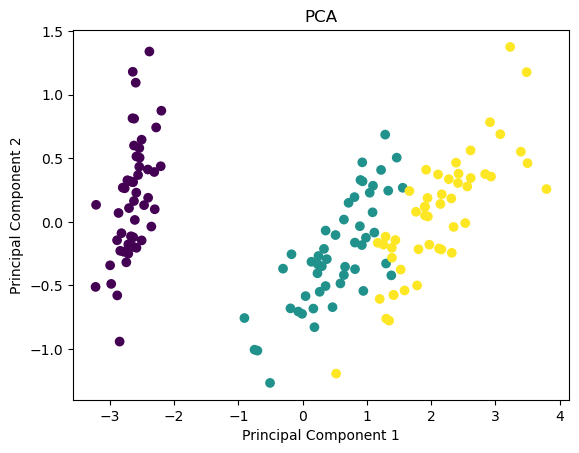

寄与率: [0.92461872 0.05306648], 累積寄与率: [0.92461872 0.97768521] 


'\n# 各主成分の固有値を取得\neigenvalues = pca_iris.explained_variance_\n\n# 累積寄与率を計算\nexplained_variance_ratio = eigenvalues / np.sum(eigenvalues)\ncumulative_explained_variance_ratio = np.cumsum(explained_variance_ratio)\n\n# 累積寄与率を表示\nprint("Cumulative Explained Variance Ratio:")\nfor i, ratio in enumerate(cumulative_explained_variance_ratio):\n    print(f"Principal Component {i+1}: {ratio:.3f}")\n'

In [1]:
from sklearn.decomposition import PCA
from sklearn.datasets import load_iris

# Irisデータセットをロード
iris = load_iris()
X = iris.data

# PCAのインスタンスを作成
pca_iris = PCA(n_components=2)

# データをフィットし、主成分を抽出
X_pca = pca_iris.fit_transform(X)

# 変換後のデータのプロット
import matplotlib.pyplot as plt
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=iris.target)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA')
plt.show()

# 寄与率:各主成分がどれくらいデータを説明できているのかを表す指標
contribution_ratios = pca_iris.explained_variance_ratio_

# 累積寄与率:この寄与率を累積して,ある寄与率に達するまでには第何主成分までが必要かを見ることが多い
cumulative_contribution_ratios = contribution_ratios.cumsum()

print(
    "寄与率: {0}, 累積寄与率: {1} ".format(
        contribution_ratios, cumulative_contribution_ratios
    )
)



"""
# 各主成分の固有値を取得
eigenvalues = pca_iris.explained_variance_

# 累積寄与率を計算
explained_variance_ratio = eigenvalues / np.sum(eigenvalues)
cumulative_explained_variance_ratio = np.cumsum(explained_variance_ratio)

# 累積寄与率を表示
print("Cumulative Explained Variance Ratio:")
for i, ratio in enumerate(cumulative_explained_variance_ratio):
    print(f"Principal Component {i+1}: {ratio:.3f}")
"""  

In [2]:
print(pca_iris.explained_variance_ratio_)

[0.92461872 0.05306648]


In [3]:
iris.feature_names

['sepal length (cm)',
 'sepal width (cm)',
 'petal length (cm)',
 'petal width (cm)']

In [5]:
import pandas as pd
df_pca_iris = pd.DataFrame(
    X_pca, columns=pca_iris.get_feature_names_out()
)
display(df_pca_iris.head(5))

,pca0,pca1
0,-2.684126,0.319397
1,-2.714142,-0.177001
2,-2.888991,-0.144949
3,-2.745343,-0.318299
4,-2.728717,0.326755


In [6]:
#components_属性は固有ベクトルと呼ばれるもので、主成分分析により発見された新しい特徴空間の軸の向きを表す。
pd.DataFrame(
    pca_iris.components_,
    index=pca_iris.get_feature_names_out(),
    columns=iris.feature_names,
).T["pca1"].sort_values(ascending=False)

sepal width (cm)     0.730161
sepal length (cm)    0.656589
petal width (cm)    -0.075481
petal length (cm)   -0.173373
Name: pca1, dtype: float64

In [17]:
#・主成分負荷量
#データの各特徴量と主成分スコアの相関係数で-1～1の値をとります。データの単位や桁が違わなければ固有ベクトルをそのまま見てもある程度のことがわかるが、そうでない場合は主成分負荷量を求める。これを見れば、主成分の解釈がしやすい場合があるとのこと。
#固有ベクトルに固有値の正の平方根をかけて求めます

#↓これ間違ってる求め方?→いやあってた！
import numpy as np

loadings = pd.DataFrame(
        pca_iris.components_ * np.c_[np.sqrt(pca_iris.explained_variance_)],
        index=pca_iris.get_feature_names_out(),
        #columns=pca_iris.feature_names_in_,
         columns=iris.feature_names,
    )
    
"""
loadings = pd.DataFrame(
        pca_iris.components_,
        index=pca_iris.get_feature_names_out(),
        #columns=pca_iris.feature_names_in_,
        columns=iris.feature_names,
        )
"""
l = loadings.T

l_1 = l["pca1"].apply(lambda x: abs(x)).sort_values(ascending=False)
l_1 = pd.DataFrame(l_1)
l_1


,pca1
sepal width (cm),0.359689
sepal length (cm),0.323446
petal length (cm),0.085406
petal width (cm),0.037183


In [20]:
coef = pca_iris.components_
coef

array([[ 0.36138659, -0.08452251,  0.85667061,  0.3582892 ],
       [ 0.65658877,  0.73016143, -0.17337266, -0.07548102]])

In [23]:
sqrt_var = np.sqrt(pca_iris.explained_variance_)
sqrt_var

array([2.05626888, 0.49261623])

In [12]:
iris_recovered1 = pca_iris.inverse_transform(X_pca)
#iris_recovered2 = np.dot(X_projected2, pca.components_) + np.mean(X, axis=0)    # 平均はpca.mean_でも可
pd.DataFrame(iris_recovered1)

,0,1,2,3
0,5.083039,3.517414,1.403214,0.213532
1,4.746262,3.157500,1.463562,0.240246
2,4.704119,3.195682,1.308217,0.175180
3,4.642212,3.056967,1.461330,0.239732
4,5.071755,3.526555,1.363738,0.197000
...,...,...,...,...
145,6.669040,3.029941,5.390949,1.881732
146,6.148802,2.654211,5.131348,1.774830
147,6.532722,2.965786,5.255791,1.825527
148,6.606885,2.981818,5.366261,1.871617


In [13]:
pd.DataFrame(X)

,0,1,2,3
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2
...,...,...,...,...
145,6.7,3.0,5.2,2.3
146,6.3,2.5,5.0,1.9
147,6.5,3.0,5.2,2.0
148,6.2,3.4,5.4,2.3


In [50]:
# 共分散行列を取得
covariance_matrix = pca_iris.get_covariance()

# 共分散行列の固有値を求める
eigenvalues = np.linalg.eigvals(covariance_matrix)

# 固有値を降順にソート
eigenvalues_sorted = np.sort(eigenvalues)[::-1]

print(eigenvalues_sorted)

[4.22824171 0.24267075 0.0510223  0.0510223 ]


In [51]:
pca_iris.explained_variance_

array([4.22824171, 0.24267075])

In [52]:
df_center

,RERE,RNF165,PHF7,CIDEA,TENT2,SLC17A3,SDS,ATP6V1C2,F3,FAM71C,LIN52,PCOTH,GRM1,FXN,SLC9A1,PML,CD164,MOB3A,HGC6.1.1,OR1J2,GNG5,TAF15,EXTL3,CNPY3,FAM174C,...,SHISA2,BCAT1,NCKAP1L,CATSPERD,AK098705,PSMC3IP,TEAD1,TTC41P,GRHPR,CHRNB1,RAB4B-EGLN2,TBC1D4,TSPAN11,ANGPTL2,ENOX1,LOC283104,VN1R4,TRPV5,UGGT1,CR590356,VPS72,CSMD3,CC2D1A,IGSF9,FAM71A
MB-0000,0.703866,0.052063,-0.293042,5.150534,0.088533,0.053486,-1.115735,-0.155199,1.102311,0.061890,0.654906,-0.293120,-0.012363,-0.399998,-0.604457,0.021019,0.003737,-0.415297,0.205412,-0.040748,-0.212126,0.092505,-0.125648,-0.061003,-0.409808,...,-1.563581,-0.166374,-0.001018,0.060490,-0.168928,-0.238582,0.098549,0.137833,0.070185,-0.084589,-0.703074,0.463361,-0.003319,1.378171,0.358081,-0.159196,0.041939,-0.060419,-0.597772,-0.280317,-0.195934,-0.069322,-0.115646,-1.070184,-0.176023
MB-0002,-0.020350,-0.668908,-0.334504,-0.208843,0.089141,0.194498,-0.750995,-0.128571,0.130611,0.174560,0.795604,-0.188766,0.205929,0.118631,-0.106982,-0.637138,0.263600,0.263860,0.233596,-0.075130,0.267747,-1.049705,-0.029909,-0.320200,-0.009875,...,1.690896,-0.357523,-0.864739,-0.404310,0.247474,0.307722,0.438701,0.124188,0.192521,0.145767,-0.749012,-0.523854,-0.085735,0.595820,-0.044314,-0.012142,-0.128414,0.032301,-0.006654,-0.708425,-0.217949,-0.174891,-0.023391,-0.078903,0.294960
MB-0005,-1.070733,-0.864569,-0.152317,0.081446,0.610864,-0.028295,0.781701,-0.086336,0.996208,-0.159811,0.323658,0.056472,0.089100,-0.416300,-0.936960,-1.196973,2.437691,-0.445368,-0.134138,0.065599,-0.287303,-1.224249,-0.406980,-0.062295,-0.484025,...,1.375200,0.935580,-0.331230,0.021163,0.140363,-0.063158,0.235953,-0.009632,-0.337056,0.383887,-0.980876,0.374628,0.013773,0.672303,-0.209916,-0.085683,-0.061891,-0.161594,-1.000231,-0.731061,-0.162120,-0.062844,-0.044523,0.380085,0.335997
MB-0006,-0.857070,-1.026465,-0.138112,-1.088556,0.441833,-0.055756,-0.327586,1.033489,0.441216,-0.125958,-0.168489,-0.340498,-0.090805,-0.237716,-1.312901,-0.961141,3.027219,-0.426735,-0.120991,0.128820,0.020399,-0.360892,-0.817621,-0.097802,-0.337351,...,2.321073,1.280038,-0.514442,-0.063654,-0.043404,-0.489582,0.067679,-0.073931,0.232229,0.121818,-0.846810,0.205065,0.054820,0.364526,0.090821,-0.158771,0.262413,-0.065575,-0.652969,-0.626972,-0.679291,-0.171531,0.164188,-0.841871,0.044983
MB-0008,-0.984100,-0.887043,-0.011145,2.379248,-0.196324,0.051677,0.703672,0.254238,-0.170221,-0.117532,0.519178,0.864337,-0.044761,-0.022309,-0.112873,-0.587549,-0.233039,-0.487674,-0.061966,-0.022781,-0.235377,-0.678731,-0.389373,0.245298,-0.517150,...,-1.789737,-0.162632,-0.332565,0.029425,-0.231143,0.263082,0.393037,0.095212,-0.061705,-0.121976,0.308767,-0.921234,-0.076405,-0.158241,-0.032403,-0.261541,0.042645,-0.085870,-0.676990,0.479832,-0.091232,-0.115002,-0.027699,-0.745019,-0.278963
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MB-7295,-0.444852,-0.415142,-0.142974,-0.933785,-0.000260,-0.048606,0.080679,-0.088727,0.313682,0.025093,0.329725,0.340600,-0.091977,-0.164974,-0.691485,-0.877630,0.177823,-0.206914,-0.081116,0.163469,0.188953,0.114148,-0.291241,0.179576,-0.147426,...,1.270285,1.053063,-0.010115,0.101790,-0.043558,-0.007648,-0.040345,-0.005885,0.386426,0.303206,-0.631973,-0.161768,0.132036,1.687771,0.161941,-0.213495,0.089480,0.170886,-0.083243,-0.403361,0.107909,-0.031837,-0.073416,-0.093700,-0.140647
MB-7296,-0.631566,-0.313565,-0.689629,0.250782,0.389887,-0.072044,0.650746,-0.269910,-0.422139,-0.125438,0.335345,0.131545,0.191455,-0.090837,-0.599554,-0.533206,0.120400,-0.691198,0.439163,-0.253630,0.350357,-1.208815,-0.794665,0.838787,0.015292,...,-1.264968,0.352984,0.138875,0.012051,0.028735,0.081251,-0.195876,-0.077620,0.454325,-0.528895,0.417856,-0.224258,-0.496549,0.141607,-0.106837,-0.282728,0.009056,0.136916,0.090145,-0.328305,-0.100874,0.028793,-0.025994,-0.493320,-0.057121
MB-7297

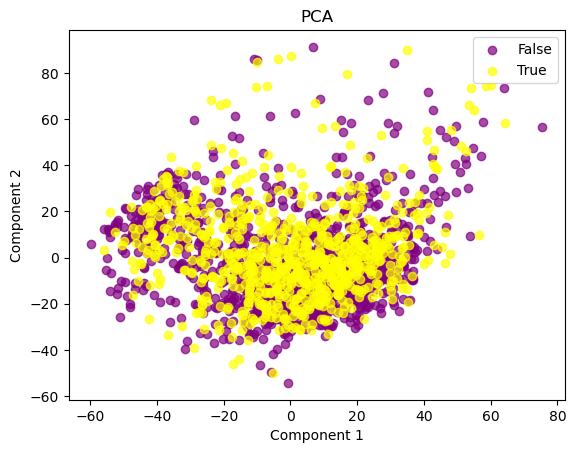

各主成分の寄与率: [0.49990148 0.50009852]
累積寄与率: [0.49990148 1.        ]
Cumulative Explained Variance Ratio:
Principal Component 1: 0.500
Principal Component 2: 1.000
各主成分の寄与率pca.explained_variance_ratio_: [0.11098793 0.08470585]
累積寄与率 np.cumsum(pca.explained_variance_ratio_): [0.11098793 0.19569379]
経過時間: 0.863216400 [sec]


In [54]:
from sklearn.decomposition import PCA
start()

X = df_center
y = df_recurrenced["RFS_STATUS"]

pca_df = PCA(n_components=2)
X_pca = pca_df.fit_transform(X)

# プロット
plt.scatter(X_pca[y == False, 0], X_pca[y == False, 1],alpha=0.7, color = 'purple', label='False')
plt.scatter(X_pca[y == True, 0], X_pca[y == True, 1],alpha=0.7, color = 'yellow', label='True')

plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('PCA')
plt.legend()
plt.show()

# 固有値の取得
eigenvalues = pca_df.components_.var(axis=1)

# 固有値の総和
total_variance = np.sum(eigenvalues)

# 各主成分の寄与率を計算
explained_variance_ratio = eigenvalues / total_variance
# 累積寄与率:この寄与率を累積して,ある寄与率に達するまでには第何主成分までが必要かを見ることが多い
cumulative_explained_variance_ratio = np.cumsum(explained_variance_ratio)
print("各主成分の寄与率:", explained_variance_ratio)
print("累積寄与率:", np.cumsum(explained_variance_ratio))


# 累積寄与率を表示
print("Cumulative Explained Variance Ratio:")
for i, ratio in enumerate(cumulative_explained_variance_ratio):
    print(f"Principal Component {i+1}: {ratio:.3f}")

print("各主成分の寄与率pca.explained_variance_ratio_:", pca_df.explained_variance_ratio_)
print("累積寄与率 np.cumsum(pca.explained_variance_ratio_):", np.cumsum(pca_df.explained_variance_ratio_))

end()

array([0.50013271, 0.49986729])

In [56]:
components_sparse

array([[ 0.00960249,  0.00284222,  0.00818971, ...,  0.00317398,
         0.00115055, -0.00015043],
       [ 0.00150144,  0.01350242,  0.00109348, ...,  0.00535324,
         0.00677875, -0.0005414 ]])

In [64]:
pd.DataFrame(X_pca)

,0,1
0,-26.258446,-23.806547
1,19.268698,-14.265784
2,-15.550493,-43.936102
3,-13.013427,-30.106499
4,-3.011224,-10.368448
...,...,...
1958,-10.914941,-33.234559
1959,-3.701790,-6.974399
1960,-8.585151,-19.991377
1961,-3.781291,-19.336756


In [65]:

loadings = pd.DataFrame(
        pca.components_ * np.c_[np.sqrt(pca.explained_variance_)],
        index=pca.get_feature_names_out(),
        columns=pca.feature_names_in_,
         #columns=iris.feature_names,
    )
l = loadings.T
l_1 = l["pca1"].apply(lambda x: abs(x)).sort_values(ascending=False)
l_1 = pd.DataFrame(l_1)
l_1

,pca1
DCN,1.163599
AGR3,1.046569
NAT1,0.926751
LUM,0.917475
TFF1,0.916200
...,...
BAALC-AS2,0.000011
DGCR6L,0.000010
LINC00471,0.000003
ERVV-2,0.000002


In [70]:
max(l_1)

'pca1'

In [68]:
pca.explained_variance_

array([540.92221145, 412.83116498])

In [66]:
pd.DataFrame(pca.components_.T)

,0,1
0,0.009602,0.001501
1,0.002842,0.013502
2,0.008190,0.001093
3,-0.002915,-0.014947
4,0.002923,-0.012127
...,...,...
20598,-0.003292,0.002041
20599,0.001442,0.000199
20600,0.003174,0.005353
20601,0.001151,0.006779


In [71]:
com = pd.DataFrame(pca.components_,
                    index=pca.get_feature_names_out(),
                    columns=pca.feature_names_in_,
        )
c = com.T
c = c["pca1"].apply(lambda x: abs(x)).sort_values(ascending=False)
c = pd.DataFrame(c)
c

,pca1
DCN,5.726866e-02
AGR3,5.150882e-02
NAT1,4.561177e-02
LUM,4.515520e-02
TFF1,4.509245e-02
...,...
BAALC-AS2,5.291970e-07
DGCR6L,4.712675e-07
LINC00471,1.264191e-07
ERVV-2,8.124316e-08


In [ ]:
loadings1 = pd.DataFrame(pca.components_ * np.c_[np.sqrt(pca.explained_variance_)],
                        index=pca.get_feature_names_out(),
                        columns=pca.feature_names_in_,
        )
l = loadings1.T
l_1 = l["pca1"].sort_values(ascending=False)
l_1 = pd.DataFrame(l_1)
l_1

## KernelPCA

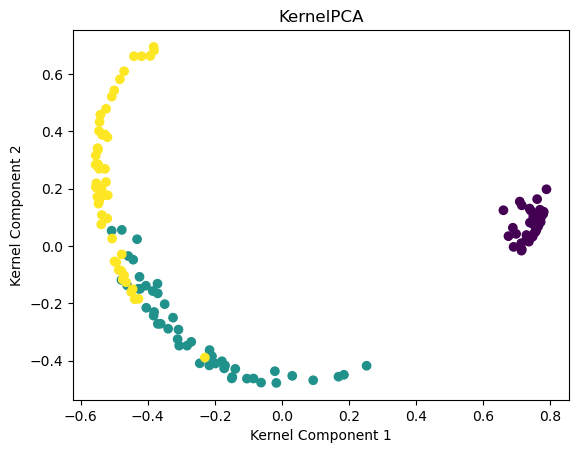

In [157]:
from sklearn.decomposition import KernelPCA
from sklearn.datasets import load_iris

# Irisデータセットをロード
iris = load_iris()
X = iris.data

# KernelPCAのインスタンスを作成
kernel_pca = KernelPCA(n_components=2, kernel='rbf', gamma=0.1,fit_inverse_transform= True)

# データをフィットし、カーネル主成分を抽出
X_kernel_pca = kernel_pca.fit_transform(X)

# 変換後のデータのプロット
import matplotlib.pyplot as plt
plt.scatter(X_kernel_pca[:, 0], X_kernel_pca[:, 1], c=iris.target)
plt.xlabel('Kernel Component 1')
plt.ylabel('Kernel Component 2')
plt.title('KernelPCA')
plt.show()


In [71]:
kernel_pca.components_

AttributeError: 'KernelPCA' object has no attribute 'components_'

In [31]:
kernel_pca.eigenvalues_

array([45.20135497, 12.0670852 ])

In [36]:
pd.DataFrame(kernel_pca.inverse_transform(X_kernel_pca))

,0,1,2,3
0,5.013875,3.336413,1.640480,0.317023
1,5.008170,3.321570,1.653680,0.320876
2,5.012743,3.343925,1.626788,0.312322
3,5.012390,3.321938,1.660643,0.323695
4,5.017384,3.342331,1.637530,0.316442
...,...,...,...,...
145,6.564910,2.961241,5.369087,1.892269
146,6.308902,2.848911,5.076382,1.757549
147,6.486387,2.917409,5.297959,1.858724
148,6.541240,2.962895,5.314730,1.867359


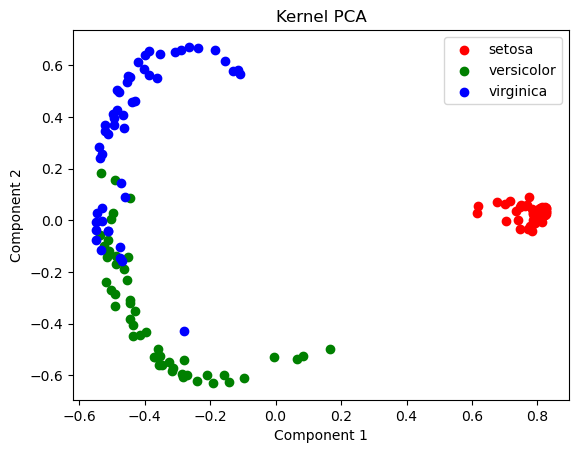

In [158]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.decomposition import KernelPCA

# irisデータセットをロード
iris = load_iris()
X = iris.data
y = iris.target

# Kernel PCAのインスタンスを作成
kernel_pca = KernelPCA(n_components=2, kernel='rbf')

# データをKernel PCAに適合させる
X_kernel_pca = kernel_pca.fit_transform(X)

# クラスごとに色を設定
colors = ['red', 'green', 'blue']
labels = iris.target_names

# プロット
for target, color, label in zip(range(3), colors, labels):
    plt.scatter(X_kernel_pca[y == target, 0], X_kernel_pca[y == target, 1], color=color, label=label)

plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('Kernel PCA')
plt.legend()
plt.show()


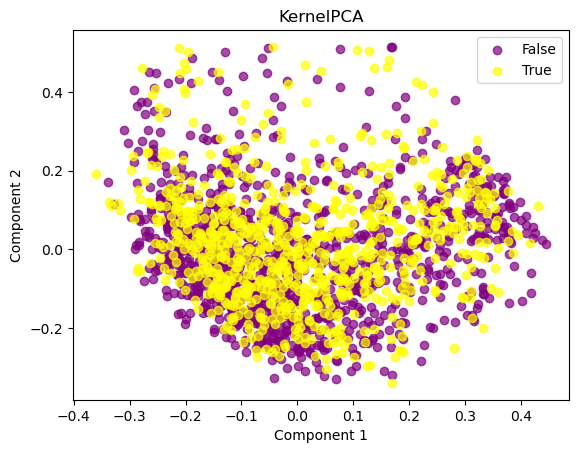

In [173]:
from sklearn.decomposition import KernelPCA
from sklearn.datasets import fetch_openml
from sklearn.preprocessing import StandardScaler

X = df_center
y = df_recurrenced["RFS_STATUS"]
# 大規模データセット向けのKernelPCAオブジェクトの作成
kpca = KernelPCA(n_components=2, kernel='rbf', n_jobs=-1)

# KernelPCAの適用
X_kpca = kpca.fit_transform(X)

# プロット
plt.scatter(X_kpca[y == False, 0], X_kpca[y == False, 1],alpha=0.7, color = 'purple', label='False')
plt.scatter(X_kpca[y == True, 0], X_kpca[y == True, 1],alpha=0.7, color = 'yellow', label='True')

plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('KernelPCA')
plt.legend()
plt.show()

In [138]:
pd.DataFrame(X_kpca)

,0,1
0,0.162963,-0.204846
1,-0.159645,-0.047114
2,0.062956,-0.237325
3,0.066942,-0.139993
4,0.010084,-0.042729
...,...,...
1958,0.032836,-0.286317
1959,0.022446,0.001573
1960,0.041853,-0.085309
1961,0.002765,-0.110443


## SparsePCA

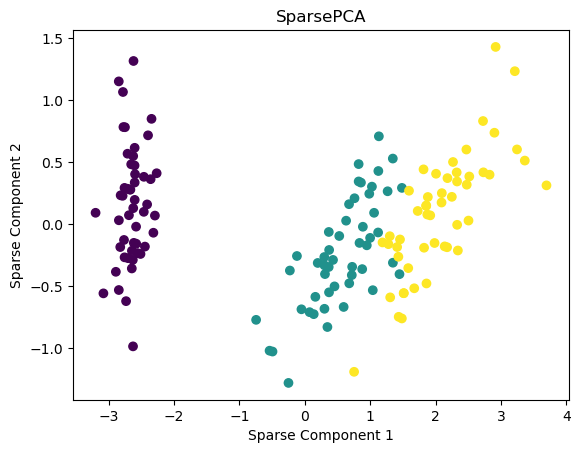

各主成分の寄与率: [0.47559504 0.52440496]
累積寄与率: [0.47559504 1.        ]
Cumulative Explained Variance Ratio:
Principal Component 1: 0.476
Principal Component 2: 1.000


In [2]:
from sklearn.decomposition import SparsePCA
from sklearn.datasets import load_iris
import pandas as pd
import numpy as np
# Irisデータセットをロード
iris = load_iris()
X = iris.data

# SparsePCAのインスタンスを作成
sparse_pca_iris = SparsePCA(n_components=2, alpha=0.1)

# データをフィットし、スパース主成分を抽出
sparse_pca_iris.fit(X)

# データをスパース主成分空間に変換
X_sparse_pca_iris = sparse_pca_iris.transform(X)

# 変換後のデータのプロット
import matplotlib.pyplot as plt
plt.scatter(X_sparse_pca_iris[:, 0], X_sparse_pca_iris[:, 1], c=iris.target)
plt.xlabel('Sparse Component 1')
plt.ylabel('Sparse Component 2')
plt.title('SparsePCA')
plt.show()

# 主成分スコアの計算
score = pd.DataFrame(X_sparse_pca_iris,)

"""AttributeError: 'SparsePCA' object has no attribute 'explained_variance_ratio_'のエラー出るから無理
# 寄与率:各主成分がどれくらいデータを説明できているのかを表す指標
contribution_ratios = pd.DataFrame(sparse_pca_iris.explained_variance_ratio_)
# 累積寄与率:この寄与率を累積して,ある寄与率に達するまでには第何主成分までが必要かを見ることが多い
cumulative_contribution_ratios = contribution_ratios.cumsum()
"""
 
# 固有値の取得
eigenvalues = sparse_pca_iris.components_.var(axis=1)

# 固有値の総和
total_variance = np.sum(eigenvalues)

# 各主成分の寄与率を計算
explained_variance_ratio = eigenvalues / total_variance
# 累積寄与率:この寄与率を累積して,ある寄与率に達するまでには第何主成分までが必要かを見ることが多い
cumulative_explained_variance_ratio = np.cumsum(explained_variance_ratio)
print("各主成分の寄与率:", explained_variance_ratio)
print("累積寄与率:", np.cumsum(explained_variance_ratio))


# 累積寄与率を表示
print("Cumulative Explained Variance Ratio:")
for i, ratio in enumerate(cumulative_explained_variance_ratio):
    print(f"Principal Component {i+1}: {ratio:.3f}")

In [ ]:
df_sparse_pca_iris = pd.DataFrame(
    X_sparse_pca_iris, columns=sparse_pca_iris.get_feature_names_out()
)
display(df_sparse_pca_iris.head(5))

ChatGPT：sparse_pca.components_は何を意味しますか

sparse_pca.components_は、SparsePCAによって抽出された主成分ベクトル（負荷量ベクトル）を表します。
sparse_pca.components_は、サイズが (n_components, n_features) の2次元の配列です。各行は1つの主成分ベクトルを表し、列は元の特徴量の数に対応しています。各要素は、対応する特徴量の主成分への寄与度を示します。
主成分ベクトルは、元の特徴空間をスパースな新しい特徴空間に射影するための重要な情報を持っています。主成分ベクトルの各要素が大きい場合、対応する特徴量は主成分によって強く影響を受けることを意味します。逆に、要素が小さい場合、その特徴量は主成分にほとんど影響を与えないことを示します。
主成分ベクトルを分析することで、どの特徴量が主成分の形成に貢献しているのかを理解することができます。また、スパースPCAはスパース性を重視するため、主成分ベクトルの多くの要素がゼロになる傾向があります。ゼロでない要素がある場合、それらの特徴量は主成分の形成に重要な役割を果たしていることを示しています。

In [3]:
pd.DataFrame(pd.DataFrame(
    sparse_pca_iris.components_,
    index=sparse_pca_iris.get_feature_names_out(),
    columns=iris.feature_names,
).T["sparsepca1"].apply(lambda x: abs(x)).sort_values(ascending=False))

,sparsepca1
sepal length (cm),0.714336
sepal width (cm),0.699803
petal length (cm),0.000000
petal width (cm),0.000000


In [102]:
#sparsePCAは主成分負荷量求められない?→求められるかも
loadings = pd.DataFrame(
        sparse_pca_iris.components_,
        index=sparse_pca_iris.get_feature_names_out(),
        #columns=pca_iris.feature_names_in_,
         columns=iris.feature_names,
    )
l = loadings.T
l_1 = l["sparsepca1"].apply(lambda x: abs(x)).sort_values(ascending=False)
l_1 = pd.DataFrame(l_1)
l_1

,sparsepca1
sepal length (cm),0.714336
sepal width (cm),0.699803
petal length (cm),0.000000
petal width (cm),0.000000


In [50]:
# 共分散行列を計算
covariance_matrix = np.cov(sparse_pca_iris.components_.T)

# 共分散行列の固有値を求める
eigenvalues = np.linalg.eigvals(covariance_matrix)


pd.DataFrame(eigenvalues)

#無理やり固有値求めたが、合っているのかわからない

,0
0,1.110223e-16
1,8.127777e-01
2,1.500343e-17
3,-1.110182e-17


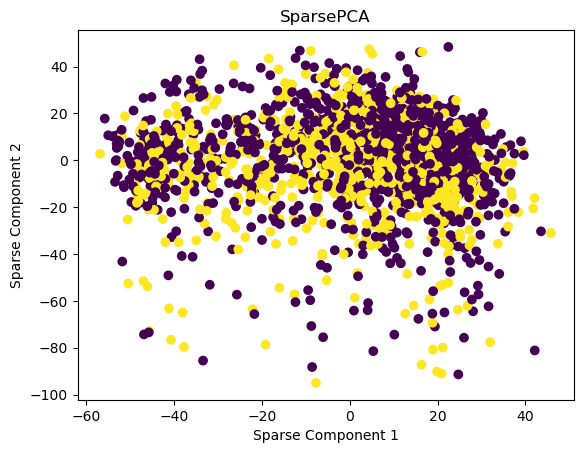

In [48]:
from sklearn.decomposition import SparsePCA

# SparsePCAのインスタンスを作成
sparse_pca = SparsePCA(n_components=2, alpha=0.8, random_state = config.SEED)

# データをフィットし、スパース主成分を抽出
sparse_pca.fit(df_center)

# データをスパース主成分空間に変換
X_sparse_pca = sparse_pca.transform(df_center)

# 変換後のデータのプロット
import matplotlib.pyplot as plt
plt.scatter(X_sparse_pca[:, 0], X_sparse_pca[:, 1], c= df_recurrenced["RFS_STATUS"]
           )
plt.xlabel('Sparse Component 1')
plt.ylabel('Sparse Component 2')
plt.title('SparsePCA')
plt.show()

#めちゃくちゃ時間かかる

In [51]:
pd.DataFrame(
    sparse_pca.components_,
    index=sparse_pca.get_feature_names_out(),
    columns=df_gene_expressions.columns,
).T["sparsepca1"].apply(lambda x: abs(x)).sort_values(ascending=False)

Hugo_Symbol
DCN        0.069220
LUM        0.053538
JCHAIN     0.047966
HBB        0.046689
SELENOP    0.045201
             ...   
KTI12      0.000000
GNG7       0.000000
KIZ        0.000000
CTNNA2     0.000000
FAM71A     0.000000
Name: sparsepca1, Length: 20603, dtype: float64

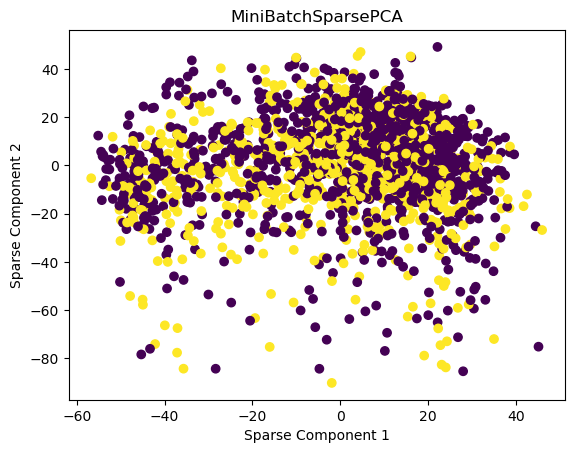

In [92]:
from sklearn.decomposition import MiniBatchSparsePCA

# minibatchSparsePCAのインスタンスを作成
mbsparse_pca = MiniBatchSparsePCA(n_components=2, alpha = 1 ,random_state = config.SEED)

# データをフィットし、スパース主成分を抽出
mbsparse_pca.fit(df_center)

# データをスパース主成分空間に変換
X_sparse_pca = mbsparse_pca.transform(df_center)

# 変換後のデータのプロット
import matplotlib.pyplot as plt
plt.scatter(X_sparse_pca[:, 0], X_sparse_pca[:, 1],c= df_recurrenced["RFS_STATUS"]
           )
plt.xlabel('Sparse Component 1')
plt.ylabel('Sparse Component 2')
plt.title('MiniBatchSparsePCA')
plt.show()

In [97]:
loadings = pd.DataFrame(
        mbsparse_pca.components_,
        index=mbsparse_pca.get_feature_names_out(),
        columns=mbsparse_pca.feature_names_in_,
         #columns=iris.feature_names,
    )
l = loadings.T

l_1 = l["minibatchsparsepca1"].apply(lambda x: abs(x)).sort_values(ascending=False)
l_1 = pd.DataFrame(l_1)
l_1

,minibatchsparsepca1
DCN,0.071313
HBB,0.057150
LUM,0.054738
FOS,0.049008
CPA3,0.047600
...,...
LOC100128922,0.000000
EDAR,0.000000
RUFY1,0.000000
FAM155A,0.000000


In [95]:
pd.DataFrame(
    mbsparse_pca.components_,
    index=mbsparse_pca.get_feature_names_out(),
    columns=df_gene_expressions.columns,
).T["minibatchsparsepca1"].apply(lambda x: abs(x)).sort_values(ascending=False)

Hugo_Symbol
DCN             0.071313
HBB             0.057150
LUM             0.054738
FOS             0.049008
CPA3            0.047600
                  ...   
LOC100128922    0.000000
EDAR            0.000000
RUFY1           0.000000
FAM155A         0.000000
FAM71A          0.000000
Name: minibatchsparsepca1, Length: 20603, dtype: float64

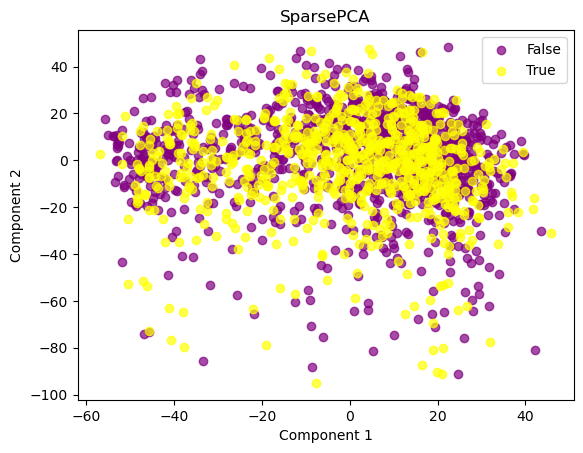

各主成分の寄与率: [0.49996189 0.50003811]
累積寄与率: [0.49996189 1.        ]
Cumulative Explained Variance Ratio:
Principal Component 1: 0.500
Principal Component 2: 1.000


In [44]:
from sklearn.decomposition import SparsePCA
start()

X = df_center
y = df_recurrenced["RFS_STATUS"]

# SparsePCAのインスタンスを作成
sparse_pca = SparsePCA(n_components=2, alpha=0.8)
sparse_pca.fit(df_center)
X_sparse_pca = sparse_pca.transform(df_center)

# プロット
plt.scatter(X_sparse_pca[y == False, 0], X_sparse_pca[y == False, 1],alpha=0.7, color = 'purple', label='False')
plt.scatter(X_sparse_pca[y == True, 0], X_sparse_pca[y == True, 1],alpha=0.7, color = 'yellow', label='True')

plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('SparsePCA')
plt.legend()
plt.show()

end()

In [58]:
pd.DataFrame(pd.DataFrame(
    sparse_pca.components_,
    index=sparse_pca.get_feature_names_out(),
    #columns=df_gene_expressions.columns,
    columns=sparse_pca.feature_names_in_,
).T["sparsepca1"].apply(lambda x: abs(x)).sort_values(ascending=False))

,sparsepca1
DCN,0.069220
LUM,0.053538
JCHAIN,0.047966
HBB,0.046689
SELENOP,0.045201
...,...
KTI12,0.000000
GNG7,0.000000
KIZ,0.000000
CTNNA2,0.000000


## IncrementalPCA

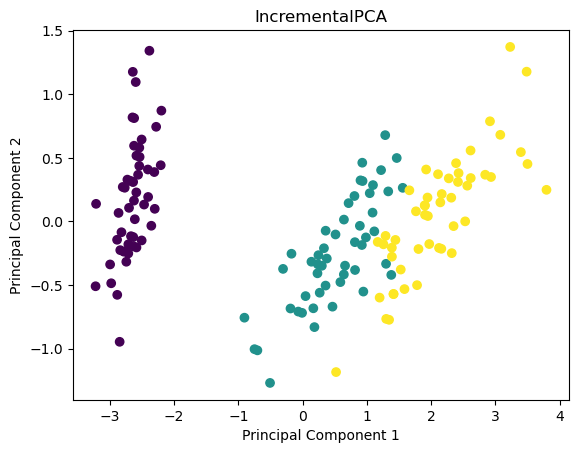

In [140]:
from sklearn.decomposition import IncrementalPCA
from sklearn.datasets import load_iris

# Irisデータセットを読み込む
data = load_iris()
X = data.data
y = data.target

# IncrementalPCAのインスタンスを作成
n_components = 2  # 2次元に削減する
ipca_iris = IncrementalPCA(n_components=n_components)

# データをフィットし、主成分を抽出
ipca_iris.fit(X)

# データを主成分空間に変換
X_transformed_iris = ipca_iris.transform(X)

# 主成分空間のデータを散布図として描画
plt.scatter(X_transformed_iris[:, 0], X_transformed_iris[:, 1], c=y, cmap='viridis')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('IncrementalPCA')
plt.show()

In [128]:
df_inc_pca_iris = pd.DataFrame(
    X_transformed_iris, columns=ipca_iris.get_feature_names_out()
)
display(df_inc_pca_iris.head(5))

,incrementalpca0,incrementalpca1
0,-2.684014,0.319592
1,-2.713937,-0.179760
2,-2.889035,-0.144049
3,-2.745486,-0.316866
4,-2.728746,0.328913


In [129]:
a = pd.DataFrame(
    ipca_iris.components_,
    index=ipca_iris.get_feature_names_out(),
    columns=iris.feature_names,
).T["incrementalpca1"].apply(lambda x: abs(x)).sort_values(ascending=False)
pd.DataFrame(a)

,incrementalpca1
sepal width (cm),0.739992
sepal length (cm),0.646782
petal length (cm),0.170698
petal width (cm),0.070339


In [130]:
#・主成分負荷量
#データの各特徴量と主成分スコアの相関係数で-1～1の値をとります。データの単位や桁が違わなければ固有ベクトルをそのまま見てもある程度のことがわかるが、そうでない場合は主成分負荷量を求める。これを見れば、主成分の解釈がしやすい場合があるとのこと。
#固有ベクトルに固有値の正の平方根をかけて求めます←間違ってんのか？？
loadings = pd.DataFrame(
        ipca_iris.components_ * np.c_[np.sqrt(ipca_iris.explained_variance_)],
        index=ipca_iris.get_feature_names_out(),
        #columns=pca_iris.feature_names_in_,
         columns=iris.feature_names,
    )
l = loadings.T
l_1 = l["incrementalpca1"].sort_values(ascending=False)
l_1 = pd.DataFrame(l_1)
l_1

,incrementalpca1
sepal width (cm),0.739992
sepal length (cm),0.646782
petal width (cm),-0.070339
petal length (cm),-0.170698


/tmp/ipykernel_26/2139507850.py:15: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_transformed[:, 0], X_transformed[:, 1],cmap='viridis')


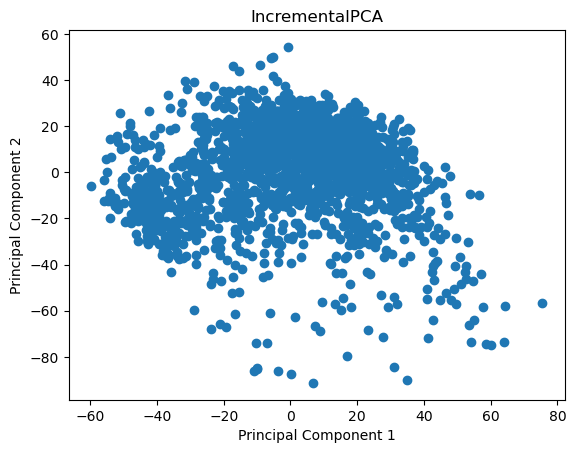

In [140]:
from sklearn.decomposition import IncrementalPCA


# IncrementalPCAのインスタンスを作成
n_components = 2  # 2次元に削減する
ipca = IncrementalPCA(n_components=n_components)

# データをフィットし、主成分を抽出
ipca.fit(df_center)

# データを主成分空間に変換
X_transformed = ipca.transform(df_center)

# 主成分空間のデータを散布図として描画
plt.scatter(X_transformed[:, 0], X_transformed[:, 1],cmap='viridis')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('IncrementalPCA')
plt.show()

In [143]:
pd.DataFrame(
    ipca.components_,
    index=ipca.get_feature_names_out(),
    columns=df_gene_expressions.columns,
).T["incrementalpca1"].apply(lambda x: abs(x)).sort_values(ascending=False)

Hugo_Symbol
DCN          5.726866e-02
AGR3         5.150881e-02
NAT1         4.561177e-02
LUM          4.515520e-02
TFF1         4.509244e-02
                 ...     
BAALC-AS2    5.291757e-07
DGCR6L       4.717362e-07
LINC00471    1.264116e-07
ERVV-2       8.124477e-08
ZNF542P      7.325209e-08
Name: incrementalpca1, Length: 20603, dtype: float64

In [56]:
from sklearn.decomposition import IncrementalPCA

start()

X = df_center
y = df_recurrenced["RFS_STATUS"]

# IncrementalPCAのインスタンスを作成
n_components = 2  # 2次元に削減する
ipca = IncrementalPCA(n_components=n_components)

# データをフィットし、主成分を抽出
ipca.fit(df_center)

# データを主成分空間に変換
X_transformed = ipca.transform(df_center)

"""
# プロット
plt.scatter(X_transformed[y == False, 0], X_transformed[y == False, 1],alpha=0.7, color = 'purple', label='False')
plt.scatter(X_transformed[y == True, 0], X_transformed[y == True, 1],alpha=0.7, color = 'yellow', label='True')

plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('IncrementalPCA')
plt.legend()
plt.show()
"""
end()

経過時間: 33.780412197 [sec]


In [57]:
loadings = pd.DataFrame(
        ipca.components_ * np.c_[np.sqrt(ipca.explained_variance_)],
        index=ipca.get_feature_names_out(),
        columns=ipca.feature_names_in_,
         #columns=iris.feature_names,
    )
l = loadings.T
l_1 = l["incrementalpca1"].apply(lambda x: abs(x)).sort_values(ascending=False)
l_1 = pd.DataFrame(l_1)
l_1

,incrementalpca1
DCN,1.163599
AGR3,1.046569
NAT1,0.926751
LUM,0.917475
TFF1,0.916199
...,...
BAALC-AS2,0.000011
DGCR6L,0.000010
LINC00471,0.000003
ERVV-2,0.000002


In [61]:
f = np.sqrt(ipca.explained_variance_)
f

array([23.25773444, 20.31824709])

In [58]:
loadings = pd.DataFrame(
        ipca.components_,
        index=ipca.get_feature_names_out(),
        columns=ipca.feature_names_in_,
         #columns=iris.feature_names,
    )
l = loadings.T
l_1 = l["incrementalpca1"].apply(lambda x: abs(x)).sort_values(ascending=False)
l_1 = pd.DataFrame(l_1)
l_1

,incrementalpca1
DCN,5.726866e-02
AGR3,5.150881e-02
NAT1,4.561177e-02
LUM,4.515520e-02
TFF1,4.509244e-02
...,...
BAALC-AS2,5.291757e-07
DGCR6L,4.717362e-07
LINC00471,1.264116e-07
ERVV-2,8.124477e-08


In [62]:
max(l_1["incrementalpca1"])

0.057268659627453124

In [46]:
df_gene_expressions = pd.read_pickle(
    config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/df_gene_expressions.pkl"
)
df_gene_expressions.isnull().sum().sum()

0

In [47]:
df_gene_expressions

Hugo_Symbol,RERE,RNF165,PHF7,CIDEA,TENT2,SLC17A3,SDS,ATP6V1C2,F3,FAM71C,LIN52,PCOTH,GRM1,FXN,SLC9A1,PML,CD164,MOB3A,HGC6.1.1,OR1J2,GNG5,TAF15,EXTL3,CNPY3,FAM174C,...,SHISA2,BCAT1,NCKAP1L,CATSPERD,AK098705,PSMC3IP,TEAD1,TTC41P,GRHPR,CHRNB1,RAB4B-EGLN2,TBC1D4,TSPAN11,ANGPTL2,ENOX1,LOC283104,VN1R4,TRPV5,UGGT1,CR590356,VPS72,CSMD3,CC2D1A,IGSF9,FAM71A
MB-0000,9.738092,6.469688,5.652674,11.558869,8.340484,5.648494,5.336235,5.468668,7.070649,5.477154,6.811309,5.440853,5.361170,5.823306,8.809831,6.790593,6.141047,6.499117,5.669507,5.469022,8.091453,10.390643,6.873466,7.277366,7.345938,...,6.155340,6.285499,6.547422,5.353135,5.198876,5.901473,5.610397,5.515762,8.139151,6.476209,10.232505,7.311327,5.458092,9.677952,5.918239,5.295203,5.474224,5.415184,7.021679,5.947334,8.010657,5.299815,6.235804,5.947404,5.133576
MB-0002,9.013876,5.748717,5.611212,6.199492,8.341091,5.789506,5.700974,5.495295,6.098949,5.589824,6.952007,5.545206,5.579463,6.341935,9.307305,6.132436,6.400910,7.178274,5.697691,5.434639,8.571327,9.248432,6.969206,7.018170,7.745871,...,9.409817,6.094350,5.683700,4.888335,5.615278,6.447777,5.950548,5.502117,8.261487,6.706565,10.186566,6.324112,5.375676,8.895600,5.515844,5.442257,5.303871,5.507905,7.612797,5.519225,7.988643,5.194247,6.328059,6.938685,5.604560
MB-0005,7.963493,5.553056,5.793398,6.489781,8.862815,5.566713,7.233671,5.537530,6.964546,5.255454,6.480061,5.790445,5.462634,5.807004,8.477327,5.572601,8.575001,6.469047,5.329956,5.575368,8.016276,9.073888,6.592135,7.276074,7.271721,...,9.094121,7.387453,6.217209,5.313808,5.508167,6.076896,5.747801,5.368297,7.731911,6.944685,9.954702,7.222594,5.475184,8.972083,5.350242,5.368716,5.370394,5.314009,6.619220,5.496590,8.044471,5.306294,6.306927,7.397672,5.645597
MB-0006,8.177157,5.391160,5.807604,5.319779,8.693784,5.539252,6.124384,6.657355,6.409554,5.289307,5.987913,5.393475,5.282728,5.985588,8.101386,5.808433,9.164529,6.487679,5.343103,5.638589,8.323978,9.937245,6.181493,7.240568,7.418395,...,10.039994,7.731911,6.033998,5.228991,5.324400,5.650472,5.579526,5.303998,8.301195,6.682616,10.088769,7.053031,5.516231,8.664307,5.650978,5.295628,5.694697,5.410028,6.966482,5.600679,7.527300,5.197607,6.515638,6.175716,5.354582
MB-0008,8.050127,5.530582,5.934570,8.787583,8.055626,5.646685,7.155642,5.878104,5.798117,5.297733,6.675580,6.598310,5.328773,6.200995,9.301414,6.182025,5.904271,6.426740,5.402129,5.486989,8.068202,9.619406,6.609742,7.583667,7.238596,...,5.929184,6.289241,6.215874,5.322069,5.136661,6.403137,5.904885,5.473140,8.007261,6.438823,11.244345,5.926732,5.385006,8.141539,5.527755,5.192858,5.474929,5.389733,6.942461,6.707482,8.115359,5.254136,6.323751,6.272568,5.030636
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MB-7295,8.589374,6.002483,5.802742,5.474550,8.251690,5.546402,6.532649,5.535139,6.282020,5.440358,6.486128,6.074573,5.281556,6.058330,8.722802,5.891944,6.315133,6.707501,5.382979,5.673238,8.492533,10.412285,6.707874,7.517946,7.608320,...,8.989206,7.504936,6.538325,5.394435,5.324246,6.132406,5.471503,5.372043,8.455392,6.864004,10.303605,6.686198,5.593446,9.987552,5.722099,5.240904,5.521765,5.646490,7.536208,5.824289,8.314500,5.337300,6.278034,6.923887,5.168953
MB-7296,8.402660,6.104059,5.256086,6.659117,8.641838,5.522964,7.102716,5.353956,5.546199,5.289827,6.491748,5.865518,5.564988,6.132467,8.814733,6.236368,6.257710,6.223216,5.903257,5.256140,8.653936,9.089322,6.204450,8.177157,7.771038,...,6.453953,6.804857,6.687314,5.304696,5.396539,6.221306,5.315972,5.300309,8.523291,6.031903,11.353435,6.623708,4.964861,8.441388,5.453321,5.171671,5.441341,5.612519,7.709596,5.899345,8.105717,5.397931,6.325456,6.524268,5.252479
MB-7297,8.236918,5.402870,5.571897,5.439574,8.979375,5.804127,6.593890,5.353883,5.705768,5.531300,6.906297,6.116738,5.132988,6.031882,8.530870,5.744546,6.865706,6.589864,5.595558,5.369984,9.108238,9.

In [48]:
df_recurrenced = pd.read_pickle(
    config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/df_recurrenced4numeric.pkl"
)
df_recurrenced.isnull().sum()

RFS_MONTHS           0
RFS_STATUS           0
CLAUDIN_SUBTYPE      0
THREEGENE          212
RERE                 0
                  ... 
VPS72                0
CSMD3                0
CC2D1A               0
IGSF9                0
FAM71A               0
Length: 20607, dtype: int64

In [49]:
df_recurrenced

,RFS_MONTHS,RFS_STATUS,CLAUDIN_SUBTYPE,THREEGENE,RERE,RNF165,PHF7,CIDEA,TENT2,SLC17A3,SDS,ATP6V1C2,F3,FAM71C,LIN52,PCOTH,GRM1,FXN,SLC9A1,PML,CD164,MOB3A,HGC6.1.1,OR1J2,GNG5,...,SHISA2,BCAT1,NCKAP1L,CATSPERD,AK098705,PSMC3IP,TEAD1,TTC41P,GRHPR,CHRNB1,RAB4B-EGLN2,TBC1D4,TSPAN11,ANGPTL2,ENOX1,LOC283104,VN1R4,TRPV5,UGGT1,CR590356,VPS72,CSMD3,CC2D1A,IGSF9,FAM71A
MB-0000,138.65,False,claudin-low,ER-_HER2-,9.738092,6.469688,5.652674,11.558869,8.340484,5.648494,5.336235,5.468668,7.070649,5.477154,6.811309,5.440853,5.361170,5.823306,8.809831,6.790593,6.141047,6.499117,5.669507,5.469022,8.091453,...,6.155340,6.285499,6.547422,5.353135,5.198876,5.901473,5.610397,5.515762,8.139151,6.476209,10.232505,7.311327,5.458092,9.677952,5.918239,5.295203,5.474224,5.415184,7.021679,5.947334,8.010657,5.299815,6.235804,5.947404,5.133576
MB-0002,83.52,False,LumA,ER+_HER2-_High_Prolif,9.013876,5.748717,5.611212,6.199492,8.341091,5.789506,5.700974,5.495295,6.098949,5.589824,6.952007,5.545206,5.579463,6.341935,9.307305,6.132436,6.400910,7.178274,5.697691,5.434639,8.571327,...,9.409817,6.094350,5.683700,4.888335,5.615278,6.447777,5.950548,5.502117,8.261487,6.706565,10.186566,6.324112,5.375676,8.895600,5.515844,5.442257,5.303871,5.507905,7.612797,5.519225,7.988643,5.194247,6.328059,6.938685,5.604560
MB-0005,151.28,True,LumB,NaN,7.963493,5.553056,5.793398,6.489781,8.862815,5.566713,7.233671,5.537530,6.964546,5.255454,6.480061,5.790445,5.462634,5.807004,8.477327,5.572601,8.575001,6.469047,5.329956,5.575368,8.016276,...,9.094121,7.387453,6.217209,5.313808,5.508167,6.076896,5.747801,5.368297,7.731911,6.944685,9.954702,7.222594,5.475184,8.972083,5.350242,5.368716,5.370394,5.314009,6.619220,5.496590,8.044471,5.306294,6.306927,7.397672,5.645597
MB-0006,162.76,False,LumB,NaN,8.177157,5.391160,5.807604,5.319779,8.693784,5.539252,6.124384,6.657355,6.409554,5.289307,5.987913,5.393475,5.282728,5.985588,8.101386,5.808433,9.164529,6.487679,5.343103,5.638589,8.323978,...,10.039994,7.731911,6.033998,5.228991,5.324400,5.650472,5.579526,5.303998,8.301195,6.682616,10.088769,7.053031,5.516231,8.664307,5.650978,5.295628,5.694697,5.410028,6.966482,5.600679,7.527300,5.197607,6.515638,6.175716,5.354582
MB-0008,18.55,True,LumB,ER+_HER2-_High_Prolif,8.050127,5.530582,5.934570,8.787583,8.055626,5.646685,7.155642,5.878104,5.798117,5.297733,6.675580,6.598310,5.328773,6.200995,9.301414,6.182025,5.904271,6.426740,5.402129,5.486989,8.068202,...,5.929184,6.289241,6.215874,5.322069,5.136661,6.403137,5.904885,5.473140,8.007261,6.438823,11.244345,5.926732,5.385006,8.141539,5.527755,5.192858,5.474929,5.389733,6.942461,6.707482,8.115359,5.254136,6.323751,6.272568,5.030636
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MB-7295,194.28,False,LumA,ER+_HER2-_Low_Prolif,8.589374,6.002483,5.802742,5.474550,8.251690,5.546402,6.532649,5.535139,6.282020,5.440358,6.486128,6.074573,5.281556,6.058330,8.722802,5.891944,6.315133,6.707501,5.382979,5.673238,8.492533,...,8.989206,7.504936,6.538325,5.394435,5.324246,6.132406,5.471503,5.372043,8.455392,6.864004,10.303605,6.686198,5.593446,9.987552,5.722099,5.240904,5.521765,5.646490,7.536208,5.824289,8.314500,5.337300,6.278034,6.923887,5.168953
MB-7296,16.09,True,LumB,NaN,8.402660,6.104059,5.256086,6.659117,8.641838,5.522964,7.102716,5.353956,5.546199,5.289827,6.491748,5.865518,5.564988,6.132467,8.814733,6.236368,6.257710,6.223216,5.903257,5.256140,8.653936,...,6.453953,6.804857,6.687314,5.304696,5.396539,6.221306,5.315972,5.300309,8.523291,6.031903,11.353435,6.623708,4.964861,8.441388,5.453321,5.171671,5.441341,5.612519,7.709596,5.899345,8.105717,5.397931,6.325456,6.524268,5.252479
MB-7297,121.18,True,LumB,NaN,8.236918,5.402870,5.571897,5.439574,8.979375,5.804127,6.593890,5.353883,5.705768,5.531300,6.906297,6.116738,5.132988,6.031882,8.530870,5.744546,6.865706,6.589864,5.595558,5.369984,9.108238,...,8.2332

In [50]:
df_recurrenced[df_gene_expressions.columns]

,RERE,RNF165,PHF7,CIDEA,TENT2,SLC17A3,SDS,ATP6V1C2,F3,FAM71C,LIN52,PCOTH,GRM1,FXN,SLC9A1,PML,CD164,MOB3A,HGC6.1.1,OR1J2,GNG5,TAF15,EXTL3,CNPY3,FAM174C,...,SHISA2,BCAT1,NCKAP1L,CATSPERD,AK098705,PSMC3IP,TEAD1,TTC41P,GRHPR,CHRNB1,RAB4B-EGLN2,TBC1D4,TSPAN11,ANGPTL2,ENOX1,LOC283104,VN1R4,TRPV5,UGGT1,CR590356,VPS72,CSMD3,CC2D1A,IGSF9,FAM71A
MB-0000,9.738092,6.469688,5.652674,11.558869,8.340484,5.648494,5.336235,5.468668,7.070649,5.477154,6.811309,5.440853,5.361170,5.823306,8.809831,6.790593,6.141047,6.499117,5.669507,5.469022,8.091453,10.390643,6.873466,7.277366,7.345938,...,6.155340,6.285499,6.547422,5.353135,5.198876,5.901473,5.610397,5.515762,8.139151,6.476209,10.232505,7.311327,5.458092,9.677952,5.918239,5.295203,5.474224,5.415184,7.021679,5.947334,8.010657,5.299815,6.235804,5.947404,5.133576
MB-0002,9.013876,5.748717,5.611212,6.199492,8.341091,5.789506,5.700974,5.495295,6.098949,5.589824,6.952007,5.545206,5.579463,6.341935,9.307305,6.132436,6.400910,7.178274,5.697691,5.434639,8.571327,9.248432,6.969206,7.018170,7.745871,...,9.409817,6.094350,5.683700,4.888335,5.615278,6.447777,5.950548,5.502117,8.261487,6.706565,10.186566,6.324112,5.375676,8.895600,5.515844,5.442257,5.303871,5.507905,7.612797,5.519225,7.988643,5.194247,6.328059,6.938685,5.604560
MB-0005,7.963493,5.553056,5.793398,6.489781,8.862815,5.566713,7.233671,5.537530,6.964546,5.255454,6.480061,5.790445,5.462634,5.807004,8.477327,5.572601,8.575001,6.469047,5.329956,5.575368,8.016276,9.073888,6.592135,7.276074,7.271721,...,9.094121,7.387453,6.217209,5.313808,5.508167,6.076896,5.747801,5.368297,7.731911,6.944685,9.954702,7.222594,5.475184,8.972083,5.350242,5.368716,5.370394,5.314009,6.619220,5.496590,8.044471,5.306294,6.306927,7.397672,5.645597
MB-0006,8.177157,5.391160,5.807604,5.319779,8.693784,5.539252,6.124384,6.657355,6.409554,5.289307,5.987913,5.393475,5.282728,5.985588,8.101386,5.808433,9.164529,6.487679,5.343103,5.638589,8.323978,9.937245,6.181493,7.240568,7.418395,...,10.039994,7.731911,6.033998,5.228991,5.324400,5.650472,5.579526,5.303998,8.301195,6.682616,10.088769,7.053031,5.516231,8.664307,5.650978,5.295628,5.694697,5.410028,6.966482,5.600679,7.527300,5.197607,6.515638,6.175716,5.354582
MB-0008,8.050127,5.530582,5.934570,8.787583,8.055626,5.646685,7.155642,5.878104,5.798117,5.297733,6.675580,6.598310,5.328773,6.200995,9.301414,6.182025,5.904271,6.426740,5.402129,5.486989,8.068202,9.619406,6.609742,7.583667,7.238596,...,5.929184,6.289241,6.215874,5.322069,5.136661,6.403137,5.904885,5.473140,8.007261,6.438823,11.244345,5.926732,5.385006,8.141539,5.527755,5.192858,5.474929,5.389733,6.942461,6.707482,8.115359,5.254136,6.323751,6.272568,5.030636
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MB-7295,8.589374,6.002483,5.802742,5.474550,8.251690,5.546402,6.532649,5.535139,6.282020,5.440358,6.486128,6.074573,5.281556,6.058330,8.722802,5.891944,6.315133,6.707501,5.382979,5.673238,8.492533,10.412285,6.707874,7.517946,7.608320,...,8.989206,7.504936,6.538325,5.394435,5.324246,6.132406,5.471503,5.372043,8.455392,6.864004,10.303605,6.686198,5.593446,9.987552,5.722099,5.240904,5.521765,5.646490,7.536208,5.824289,8.314500,5.337300,6.278034,6.923887,5.168953
MB-7296,8.402660,6.104059,5.256086,6.659117,8.641838,5.522964,7.102716,5.353956,5.546199,5.289827,6.491748,5.865518,5.564988,6.132467,8.814733,6.236368,6.257710,6.223216,5.903257,5.256140,8.653936,9.089322,6.204450,8.177157,7.771038,...,6.453953,6.804857,6.687314,5.304696,5.396539,6.221306,5.315972,5.300309,8.523291,6.031903,11.353435,6.623708,4.964861,8.441388,5.453321,5.171671,5.441341,5.612519,7.709596,5.899345,8.105717,5.397931,6.325456,6.524268,5.252479
MB-7297,8.236918,5.402870,5.571897,5.439574,8.979375,5.804127,6.593890,5.353883,5.705768,5.531300,6.906297,6.116738,5.132988,6.031882,8.530870,5.744546,6.865706,6.589864,5.595558,5.369984,9.108238,9.574617,6.48

## Umap

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


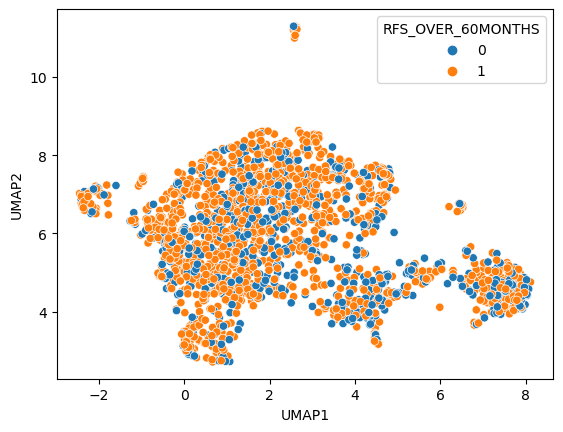

In [54]:
import numpy as np
from sklearn.preprocessing import StandardScaler
#import umap
import umap.umap_ as umap

# 特徴量のセンタリング必要ない


df_gene_expressions = pd.read_pickle(
    config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/df_gene_expressions.pkl"
)
df_recurrenced = pd.read_pickle(
    config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/df_recurrenced4numeric.pkl"
)

data = df_recurrenced[df_gene_expressions.columns]
df_recurrenced['RFS_OVER_60MONTHS'] = 0

df_recurrenced.loc[df_recurrenced['RFS_MONTHS'] >= 60, 'RFS_OVER_60MONTHS'] = 1

target = df_recurrenced['RFS_OVER_60MONTHS']

# UMAP
reducer = umap.UMAP(random_state=config.SEED)
reducer.fit(data)
embedding = reducer.transform(data)

df_umap = pd.DataFrame(embedding, columns=['UMAP1', 'UMAP2'], index=df_recurrenced.index)
df_umap['RFS_OVER_60MONTHS'] = target


# 結果のプロット
import seaborn as sns
import matplotlib.pyplot as plt

sns.scatterplot(x='UMAP1', y='UMAP2', hue= target, data=df_umap)
plt.show()

In [55]:
df_recurrenced

,RFS_MONTHS,RFS_STATUS,CLAUDIN_SUBTYPE,THREEGENE,RERE,RNF165,PHF7,CIDEA,TENT2,SLC17A3,SDS,ATP6V1C2,F3,FAM71C,LIN52,PCOTH,GRM1,FXN,SLC9A1,PML,CD164,MOB3A,HGC6.1.1,OR1J2,GNG5,...,BCAT1,NCKAP1L,CATSPERD,AK098705,PSMC3IP,TEAD1,TTC41P,GRHPR,CHRNB1,RAB4B-EGLN2,TBC1D4,TSPAN11,ANGPTL2,ENOX1,LOC283104,VN1R4,TRPV5,UGGT1,CR590356,VPS72,CSMD3,CC2D1A,IGSF9,FAM71A,RFS_OVER_60MONTHS
MB-0000,138.65,False,claudin-low,ER-_HER2-,9.738092,6.469688,5.652674,11.558869,8.340484,5.648494,5.336235,5.468668,7.070649,5.477154,6.811309,5.440853,5.361170,5.823306,8.809831,6.790593,6.141047,6.499117,5.669507,5.469022,8.091453,...,6.285499,6.547422,5.353135,5.198876,5.901473,5.610397,5.515762,8.139151,6.476209,10.232505,7.311327,5.458092,9.677952,5.918239,5.295203,5.474224,5.415184,7.021679,5.947334,8.010657,5.299815,6.235804,5.947404,5.133576,1
MB-0002,83.52,False,LumA,ER+_HER2-_High_Prolif,9.013876,5.748717,5.611212,6.199492,8.341091,5.789506,5.700974,5.495295,6.098949,5.589824,6.952007,5.545206,5.579463,6.341935,9.307305,6.132436,6.400910,7.178274,5.697691,5.434639,8.571327,...,6.094350,5.683700,4.888335,5.615278,6.447777,5.950548,5.502117,8.261487,6.706565,10.186566,6.324112,5.375676,8.895600,5.515844,5.442257,5.303871,5.507905,7.612797,5.519225,7.988643,5.194247,6.328059,6.938685,5.604560,1
MB-0005,151.28,True,LumB,NaN,7.963493,5.553056,5.793398,6.489781,8.862815,5.566713,7.233671,5.537530,6.964546,5.255454,6.480061,5.790445,5.462634,5.807004,8.477327,5.572601,8.575001,6.469047,5.329956,5.575368,8.016276,...,7.387453,6.217209,5.313808,5.508167,6.076896,5.747801,5.368297,7.731911,6.944685,9.954702,7.222594,5.475184,8.972083,5.350242,5.368716,5.370394,5.314009,6.619220,5.496590,8.044471,5.306294,6.306927,7.397672,5.645597,1
MB-0006,162.76,False,LumB,NaN,8.177157,5.391160,5.807604,5.319779,8.693784,5.539252,6.124384,6.657355,6.409554,5.289307,5.987913,5.393475,5.282728,5.985588,8.101386,5.808433,9.164529,6.487679,5.343103,5.638589,8.323978,...,7.731911,6.033998,5.228991,5.324400,5.650472,5.579526,5.303998,8.301195,6.682616,10.088769,7.053031,5.516231,8.664307,5.650978,5.295628,5.694697,5.410028,6.966482,5.600679,7.527300,5.197607,6.515638,6.175716,5.354582,1
MB-0008,18.55,True,LumB,ER+_HER2-_High_Prolif,8.050127,5.530582,5.934570,8.787583,8.055626,5.646685,7.155642,5.878104,5.798117,5.297733,6.675580,6.598310,5.328773,6.200995,9.301414,6.182025,5.904271,6.426740,5.402129,5.486989,8.068202,...,6.289241,6.215874,5.322069,5.136661,6.403137,5.904885,5.473140,8.007261,6.438823,11.244345,5.926732,5.385006,8.141539,5.527755,5.192858,5.474929,5.389733,6.942461,6.707482,8.115359,5.254136,6.323751,6.272568,5.030636,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MB-7295,194.28,False,LumA,ER+_HER2-_Low_Prolif,8.589374,6.002483,5.802742,5.474550,8.251690,5.546402,6.532649,5.535139,6.282020,5.440358,6.486128,6.074573,5.281556,6.058330,8.722802,5.891944,6.315133,6.707501,5.382979,5.673238,8.492533,...,7.504936,6.538325,5.394435,5.324246,6.132406,5.471503,5.372043,8.455392,6.864004,10.303605,6.686198,5.593446,9.987552,5.722099,5.240904,5.521765,5.646490,7.536208,5.824289,8.314500,5.337300,6.278034,6.923887,5.168953,1
MB-7296,16.09,True,LumB,NaN,8.402660,6.104059,5.256086,6.659117,8.641838,5.522964,7.102716,5.353956,5.546199,5.289827,6.491748,5.865518,5.564988,6.132467,8.814733,6.236368,6.257710,6.223216,5.903257,5.256140,8.653936,...,6.804857,6.687314,5.304696,5.396539,6.221306,5.315972,5.300309,8.523291,6.031903,11.353435,6.623708,4.964861,8.441388,5.453321,5.171671,5.441341,5.612519,7.709596,5.899345,8.105717,5.397931,6.325456,6.524268,5.252479,0
MB-7297,121.18,True,LumB,NaN,8.236918,5.402870,5.571897,5.439574,8.979375,5.804127,6.593890,5.353883,5.705768,5.531300,6.906297,6.116738,5.132988,6.031882,8.530870,5.744546,6.865706,6.589864,5.595558,5.369984,9.108238,...,6.746778,6.851895,5.466731,5.291783,7.066555,

In [56]:
df_umap

,UMAP1,UMAP2,RFS_OVER_60MONTHS
MB-0000,4.720441,7.015893,1
MB-0002,1.210256,5.119046,1
MB-0005,2.584898,11.001011,1
MB-0006,2.604410,11.072408,1
MB-0008,1.689575,6.915053,0
...,...,...,...
MB-7295,2.214005,8.089886,1
MB-7296,2.202288,7.234348,0
MB-7297,1.560392,7.053792,1
MB-7298,1.526059,7.088911,1


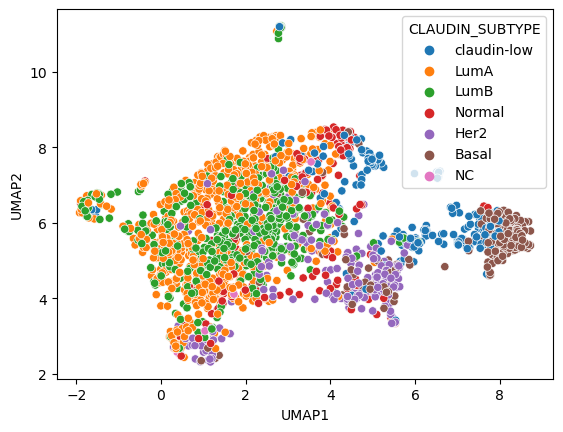

In [57]:
import numpy as np
from sklearn.preprocessing import StandardScaler
#import umap
import umap.umap_ as umap

# 特徴量のセンタリング

"""
df_gene_expressions = pd.read_pickle(
    config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/df_gene_expressions.pkl"
)

"""
df_gene_expressions = df_mrna_agilent_microarray.copy()
df_center = df_recurrenced[df_gene_expressions.columns] - df_recurrenced[
    df_gene_expressions.columns
].mean(axis=0)

target = df_recurrenced['CLAUDIN_SUBTYPE']
# UMAP
reducer = umap.UMAP(random_state=config.SEED)
reducer.fit(df_center)
embedding = reducer.transform(df_center)

df_umap2 = pd.DataFrame(embedding, columns=['UMAP1', 'UMAP2'], index=df_recurrenced.index)
df_umap2['CLAUDIN_SUBTYPE'] = target


# 結果のプロット
import seaborn as sns
import matplotlib.pyplot as plt

sns.scatterplot(x='UMAP1', y='UMAP2', hue= target, data=df_umap2)
plt.show()

In [58]:
df_umap2

,UMAP1,UMAP2,CLAUDIN_SUBTYPE
MB-0000,4.728364,8.218173,claudin-low
MB-0002,0.761997,4.820566,LumA
MB-0005,2.773660,10.872663,LumB
MB-0006,2.775533,11.029904,LumB
MB-0008,2.790520,5.964446,LumB
...,...,...,...
MB-7295,2.377375,7.486314,LumA
MB-7296,2.870103,6.414595,LumB
MB-7297,2.606419,6.099826,LumB
MB-7298,2.598870,6.109987,LumB


In [68]:
df_gene_expressions = pd.read_pickle(
    config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/df_gene_expressions.pkl"
)
df_gene_expressions.isnull().sum().sum()

Hugo_Symbol,RERE,RNF165,PHF7,CIDEA,TENT2,SLC17A3,SDS,ATP6V1C2,F3,FAM71C,LIN52,PCOTH,GRM1,FXN,SLC9A1,PML,CD164,MOB3A,HGC6.1.1,OR1J2,GNG5,TAF15,EXTL3,CNPY3,FAM174C,...,SHISA2,BCAT1,NCKAP1L,CATSPERD,AK098705,PSMC3IP,TEAD1,TTC41P,GRHPR,CHRNB1,RAB4B-EGLN2,TBC1D4,TSPAN11,ANGPTL2,ENOX1,LOC283104,VN1R4,TRPV5,UGGT1,CR590356,VPS72,CSMD3,CC2D1A,IGSF9,FAM71A
MB-0000,9.738092,6.469688,5.652674,11.558869,8.340484,5.648494,5.336235,5.468668,7.070649,5.477154,6.811309,5.440853,5.361170,5.823306,8.809831,6.790593,6.141047,6.499117,5.669507,5.469022,8.091453,10.390643,6.873466,7.277366,7.345938,...,6.155340,6.285499,6.547422,5.353135,5.198876,5.901473,5.610397,5.515762,8.139151,6.476209,10.232505,7.311327,5.458092,9.677952,5.918239,5.295203,5.474224,5.415184,7.021679,5.947334,8.010657,5.299815,6.235804,5.947404,5.133576
MB-0002,9.013876,5.748717,5.611212,6.199492,8.341091,5.789506,5.700974,5.495295,6.098949,5.589824,6.952007,5.545206,5.579463,6.341935,9.307305,6.132436,6.400910,7.178274,5.697691,5.434639,8.571327,9.248432,6.969206,7.018170,7.745871,...,9.409817,6.094350,5.683700,4.888335,5.615278,6.447777,5.950548,5.502117,8.261487,6.706565,10.186566,6.324112,5.375676,8.895600,5.515844,5.442257,5.303871,5.507905,7.612797,5.519225,7.988643,5.194247,6.328059,6.938685,5.604560
MB-0005,7.963493,5.553056,5.793398,6.489781,8.862815,5.566713,7.233671,5.537530,6.964546,5.255454,6.480061,5.790445,5.462634,5.807004,8.477327,5.572601,8.575001,6.469047,5.329956,5.575368,8.016276,9.073888,6.592135,7.276074,7.271721,...,9.094121,7.387453,6.217209,5.313808,5.508167,6.076896,5.747801,5.368297,7.731911,6.944685,9.954702,7.222594,5.475184,8.972083,5.350242,5.368716,5.370394,5.314009,6.619220,5.496590,8.044471,5.306294,6.306927,7.397672,5.645597
MB-0006,8.177157,5.391160,5.807604,5.319779,8.693784,5.539252,6.124384,6.657355,6.409554,5.289307,5.987913,5.393475,5.282728,5.985588,8.101386,5.808433,9.164529,6.487679,5.343103,5.638589,8.323978,9.937245,6.181493,7.240568,7.418395,...,10.039994,7.731911,6.033998,5.228991,5.324400,5.650472,5.579526,5.303998,8.301195,6.682616,10.088769,7.053031,5.516231,8.664307,5.650978,5.295628,5.694697,5.410028,6.966482,5.600679,7.527300,5.197607,6.515638,6.175716,5.354582
MB-0008,8.050127,5.530582,5.934570,8.787583,8.055626,5.646685,7.155642,5.878104,5.798117,5.297733,6.675580,6.598310,5.328773,6.200995,9.301414,6.182025,5.904271,6.426740,5.402129,5.486989,8.068202,9.619406,6.609742,7.583667,7.238596,...,5.929184,6.289241,6.215874,5.322069,5.136661,6.403137,5.904885,5.473140,8.007261,6.438823,11.244345,5.926732,5.385006,8.141539,5.527755,5.192858,5.474929,5.389733,6.942461,6.707482,8.115359,5.254136,6.323751,6.272568,5.030636
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MB-7295,8.589374,6.002483,5.802742,5.474550,8.251690,5.546402,6.532649,5.535139,6.282020,5.440358,6.486128,6.074573,5.281556,6.058330,8.722802,5.891944,6.315133,6.707501,5.382979,5.673238,8.492533,10.412285,6.707874,7.517946,7.608320,...,8.989206,7.504936,6.538325,5.394435,5.324246,6.132406,5.471503,5.372043,8.455392,6.864004,10.303605,6.686198,5.593446,9.987552,5.722099,5.240904,5.521765,5.646490,7.536208,5.824289,8.314500,5.337300,6.278034,6.923887,5.168953
MB-7296,8.402660,6.104059,5.256086,6.659117,8.641838,5.522964,7.102716,5.353956,5.546199,5.289827,6.491748,5.865518,5.564988,6.132467,8.814733,6.236368,6.257710,6.223216,5.903257,5.256140,8.653936,9.089322,6.204450,8.177157,7.771038,...,6.453953,6.804857,6.687314,5.304696,5.396539,6.221306,5.315972,5.300309,8.523291,6.031903,11.353435,6.623708,4.964861,8.441388,5.453321,5.171671,5.441341,5.612519,7.709596,5.899345,8.105717,5.397931,6.325456,6.524268,5.252479
MB-7297,8.236918,5.402870,5.571897,5.439574,8.979375,5.804127,6.593890,5.353883,5.705768,5.531300,6.906297,6.116738,5.132988,6.031882,8.530870,5.744546,6.865706,6.589864,5.595558,5.369984,9.108238,9.

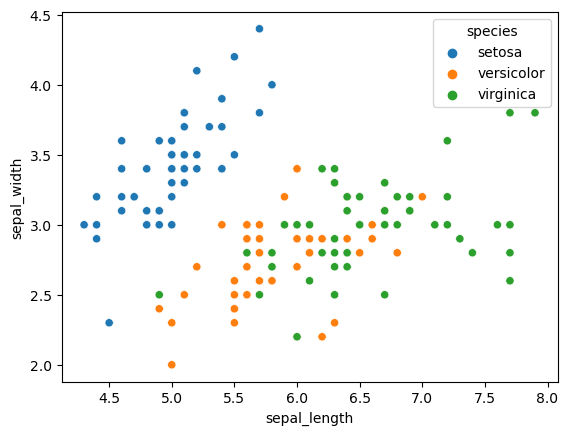

In [5]:
import seaborn as sns

# Irisデータセットをロードする
iris = sns.load_dataset("iris")

# 散布図を作成する
sns.scatterplot(x="sepal_length", y="sepal_width", hue="species", data=iris)

# プロットを表示する
plt.show()

In [10]:
#!pip install umap-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 4.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 7.4 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82813 sha256=fae05af9612acafd26bed650b2469d45914e5f7fa9dcd594de9fd22735cd5510
  Stored in directory: /root/.cache/pip/wheels/a9/3a/67/06a8950e053725912e6a8c42c4a3a241410f6487b8402542ea
  Created wheel for pynndescent: filename=pynndescent-0.5.10-py3-none-any.whl size=55623 sha256=d48b0d4e8437f38a8d27db92cb69047fd1b8bc4f3af777f1e3882195d62442d8
  Stored in directory: /root/.cache/pip/wheels/f8/32/54/fa1fd0454e0441eaa32550ea2a86da3f64eb7c8e5a82436770
Successfully built umap-learn pynndescent


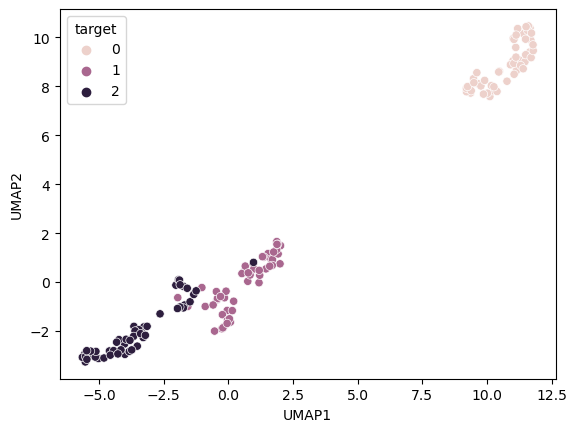

In [25]:
import numpy as np
import pandas as pd
import umap.umap_ as umap
from sklearn.datasets import load_iris

iris = load_iris()
data = iris.data
target = iris.target

reducer = umap.UMAP()
embedding = reducer.fit_transform(data)

df = pd.DataFrame(embedding, columns=['UMAP1', 'UMAP2'])
df['target'] = target

# 結果のプロット
import seaborn as sns
import matplotlib.pyplot as plt

sns.scatterplot(x='UMAP1', y='UMAP2', hue='target', data=df)
plt.show()

In [26]:
reduced_features = reducer.transform(data)
reduced_features = pd.DataFrame(reduced_features)
reduced_features

,0,1
0,11.435733,8.966012
1,10.115901,7.576502
2,9.665379,8.094584
3,9.768982,8.008383
4,11.262837,9.063945
...,...,...
145,-3.806015,-2.378771
146,-1.967630,-1.078762
147,-3.209706,-2.172317
148,-3.738563,-2.768994


In [12]:
df = pd.DataFrame(data=iris.data, columns=iris.feature_names)
df["target"] = iris.target
df

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,2
146,6.3,2.5,5.0,1.9,2
147,6.5,3.0,5.2,2.0,2
148,6.2,3.4,5.4,2.3,2


plot

KeyError: 'NPI_CAT'

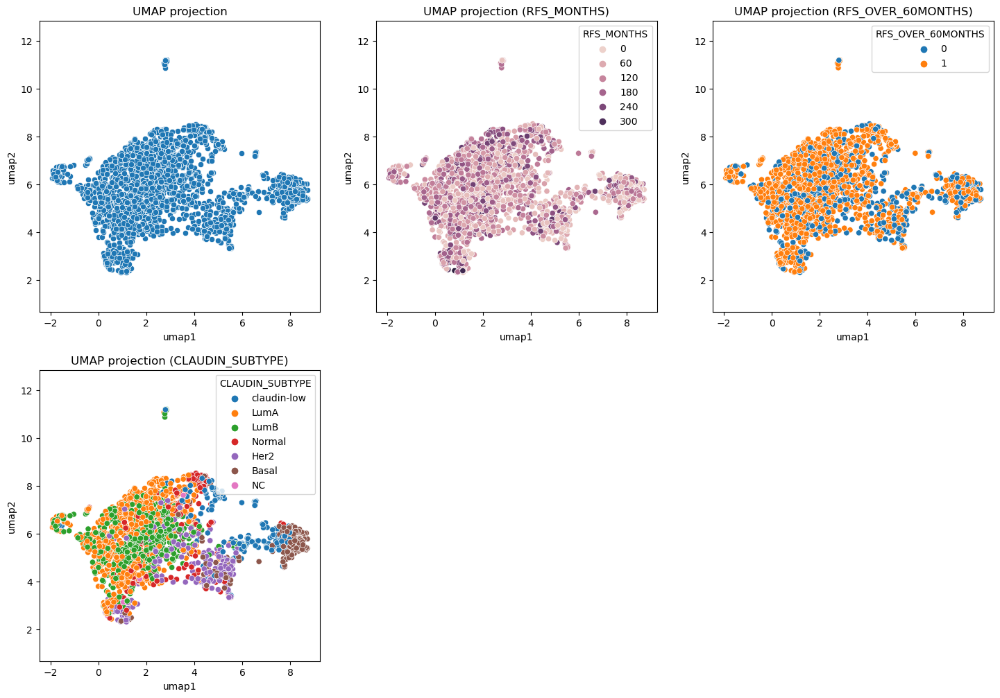

In [59]:
import seaborn as sns

plt.figure(figsize=(24, 12))


df_embedding = pd.DataFrame(
    embedding, index=df_recurrenced.index, columns=["umap1", "umap2"]
)

plt.subplot(2, 4, 1)
sns.scatterplot(x="umap1", y="umap2", data=df_embedding)
plt.gca().set_aspect("equal", "datalim")
plt.title("UMAP projection", fontsize=12)

# RFS_MONTHS
targets = ["RFS_MONTHS", "RFS_OVER_{0}MONTHS".format(year * 12)]
for i, target in enumerate(targets):
    plt.subplot(2, 4, i + 2)
    df_plot = pd.merge(
        df_recurrenced[target], df_embedding, right_index=True, left_index=True
    )
    sns.scatterplot(x="umap1", y="umap2", hue=target, data=df_plot)
    plt.gca().set_aspect("equal", "datalim")
    plt.title("UMAP projection ({0})".format(target), fontsize=12)

# カテゴリ変数毎のplot
categories = ["CLAUDIN_SUBTYPE", "NPI_CAT", "TUMOR_CAT", "LYMPH_CAT"]

for i, cat in enumerate(categories):
    df_plot = pd.merge(
        df_recurrenced[cat], df_embedding, right_index=True, left_index=True
    )
    plt.subplot(2, 4, i + 5)
    sns.scatterplot(x="umap1", y="umap2", hue=cat, data=df_plot)
    plt.gca().set_aspect("equal", "datalim")
    plt.title("UMAP projection ({0})".format(cat), fontsize=12)

plt.show()

parameter

In [60]:

def draw_umap(
    target="RFS_MONTHS", n_neighbors=15, min_dist=0.1, metric="euclidean", title=""
):
    # 特徴量のセンタリング
    _df_recurrenced = df_recurrenced.copy()
    _df_gene_expressions = df_mrna_agilent_microarray.copy()
    _df_center = _df_recurrenced[_df_gene_expressions.columns] - _df_recurrenced[
        _df_gene_expressions.columns
    ].mean(axis=0)

    reducer = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=2,
        metric=metric,
        random_state=config.SEED,
    )
    embedding = reducer.fit_transform(_df_center)
    _df_embedding = pd.DataFrame(embedding, index=_df_recurrenced.index)
    _df_plot = pd.merge(
        _df_recurrenced[target], _df_embedding, right_index=True, left_index=True
    )
    sns.scatterplot(
        x=_df_plot.iloc[:, 1], y=_df_plot.iloc[:, 2], hue=target, data=_df_plot
    )
    plt.title(title, fontsize=18)

/root/miniconda3/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/root/miniconda3/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


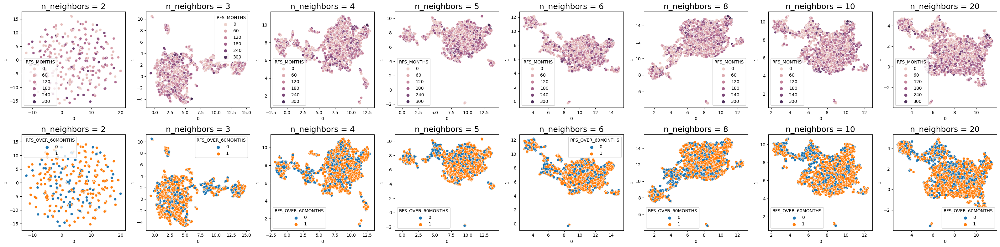

In [61]:
n_neighbors = [2, 3, 4, 5, 6, 8, 10, 20]
plt.figure(figsize=(len(n_neighbors) * 4, 8))
for i, n in enumerate(n_neighbors):
    plt.subplot(2, len(n_neighbors), i + 1)
    draw_umap(target="RFS_MONTHS", n_neighbors=n, title="n_neighbors = {}".format(n))

for i, n in enumerate(n_neighbors):
    plt.subplot(2, len(n_neighbors), i + len(n_neighbors) + 1)
    draw_umap(
        target="RFS_OVER_60MONTHS", n_neighbors=n, title="n_neighbors = {}".format(n)
    )
plt.tight_layout()
plt.show()

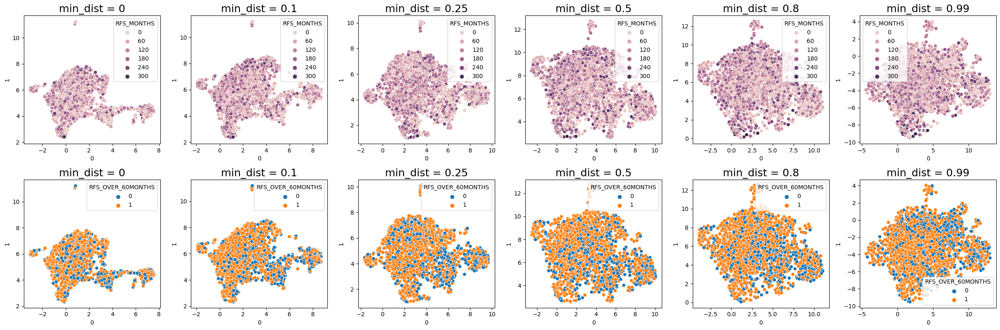

In [62]:
min_dists = [0, 0.1, 0.25, 0.5, 0.8, 0.99]

plt.figure(figsize=(len(min_dists) * 4, 8))
for i, d in enumerate(min_dists):
    plt.subplot(2, len(min_dists), i + 1)
    draw_umap(target="RFS_MONTHS", min_dist=d, title="min_dist = {}".format(d))

for i, d in enumerate(min_dists):
    plt.subplot(2, len(min_dists), i + len(min_dists) + 1)
    draw_umap(target="RFS_OVER_60MONTHS", min_dist=d, title="min_dist = {}".format(d))
plt.tight_layout()
plt.show()

In [65]:
# MB-0005を戻してみる
sample = reducer.inverse_transform(np.array([[9.517764, 7.480594]]))
sample

array([[ 0.1043625 ,  0.19859524,  0.30192196, ...,  0.30105627,
         0.01949124, -0.06852703]], dtype=float32)

In [64]:
df_tmp = df_center.loc["MB-0005"].T.sort_values()

# np.sort(sample)
# sample = pdDataFrame(sample, columns=df_center.head(1).columns).T
sample = pd.DataFrame(sample).sort_values(by=0)
sample = pd.DataFrame(sample.values, index=df_tmp.index)
pd.merge(df_tmp, sample, right_index=True, left_index=True).sort_values(by="MB-0005")

ValueError: Shape of passed values is (1, 20603), indices imply (20603, 20603)

In [ ]:
plt.figure(figsize=(8, 4))

plt.subplot(1, 2, 1)
plt.hist(df_tmp, bins=50)
plt.title("original data")
plt.xlim(-5, 5)
plt.ylim(0, 10000)

plt.subplot(1, 2, 2)
plt.hist(sample, bins=50)
plt.title("inversed data")
plt.xlim(-5, 5)
plt.ylim(0, 10000)
plt.show()

## t-SNE

/root/miniconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/root/miniconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


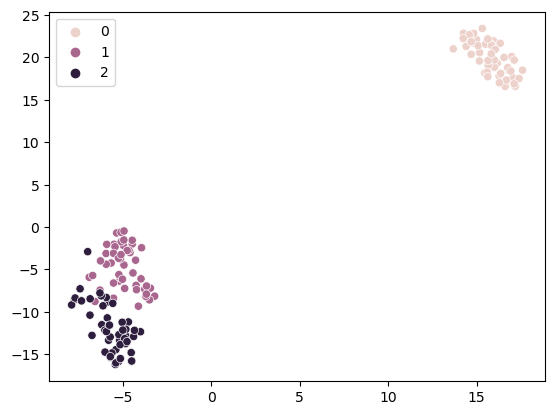

In [2]:
from sklearn.manifold import TSNE
from sklearn.datasets import load_iris
import matplotlib.pyplot as plt
import seaborn as sns

iris = load_iris()
X = iris.data
y = iris.target

tsne = TSNE(n_components=2, random_state=0)
X_tsne = tsne.fit_transform(X)

#plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y)
sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue= y, data= X)
plt.show()

In [100]:
df_recurrenced = pd.read_pickle(
    config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/df_recurrenced4numeric.pkl"
)

df_recurrenced['CLAUDIN_SUBTYPE'].unique()

array(['claudin-low', 'LumA', 'LumB', 'Normal', 'Her2', 'Basal', 'NC'],
      dtype=object)

/root/miniconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/root/miniconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


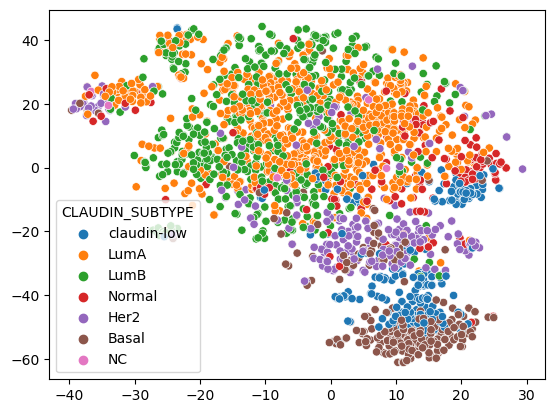

In [ ]:
from sklearn.manifold import TSNE
from sklearn.datasets import load_iris
import matplotlib.pyplot as plt
import seaborn as sns

df_gene_expressions = pd.read_pickle(
    config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/df_gene_expressions.pkl"
)

df_recurrenced = pd.read_pickle(
    config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/df_recurrenced4numeric.pkl"
)

X = df_recurrenced[df_gene_expressions.columns]
#claudin-low', 'LumA', 'LumB', 'Normal', 'Her2', 'Basal', 'NC'

y = df_recurrenced['CLAUDIN_SUBTYPE']

tsne = TSNE(n_components=2, random_state=config.SEED)
X_tsne = tsne.fit_transform(X)

sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue= y, data= X)

plt.show()


/root/miniconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/root/miniconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


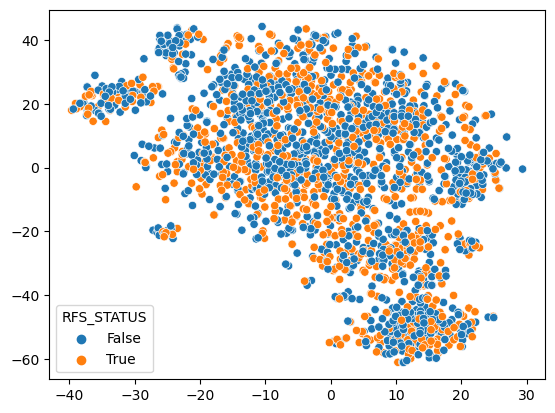

In [168]:
from sklearn.manifold import TSNE
from sklearn.datasets import load_iris
import matplotlib.pyplot as plt
import seaborn as sns

df_gene_expressions = pd.read_pickle(
    config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/df_gene_expressions.pkl"
)
df_recurrenced = pd.read_pickle(
    config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/df_recurrenced4numeric.pkl"
)

df_recurrenced['RFS_OVER_60MONTHS'] = 0
df_recurrenced.loc[df_recurrenced['RFS_MONTHS'] >= 60, 'RFS_OVER_60MONTHS'] = 1

X = df_recurrenced[df_gene_expressions.columns]
target = df_recurrenced['RFS_STATUS']

tsne = TSNE(n_components=2, random_state=config.SEED)
X_tsne = tsne.fit_transform(X)

sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue= target, data= X)

plt.show()

In [92]:
df_recurrenced = pd.read_pickle(
    config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/df_recurrenced4numeric.pkl"
)

df_recurrenced.loc[df_recurrenced ['CLAUDIN_SUBTYPE'] == "claudin-low", 'CLAUDIN_SUBTYPE'] = 0

df_recurrenced

,RFS_MONTHS,RFS_STATUS,CLAUDIN_SUBTYPE,THREEGENE,RERE,RNF165,PHF7,CIDEA,TENT2,SLC17A3,SDS,ATP6V1C2,F3,FAM71C,LIN52,PCOTH,GRM1,FXN,SLC9A1,PML,CD164,MOB3A,HGC6.1.1,OR1J2,GNG5,...,SHISA2,BCAT1,NCKAP1L,CATSPERD,AK098705,PSMC3IP,TEAD1,TTC41P,GRHPR,CHRNB1,RAB4B-EGLN2,TBC1D4,TSPAN11,ANGPTL2,ENOX1,LOC283104,VN1R4,TRPV5,UGGT1,CR590356,VPS72,CSMD3,CC2D1A,IGSF9,FAM71A
MB-0000,138.65,False,0,ER-_HER2-,9.738092,6.469688,5.652674,11.558869,8.340484,5.648494,5.336235,5.468668,7.070649,5.477154,6.811309,5.440853,5.361170,5.823306,8.809831,6.790593,6.141047,6.499117,5.669507,5.469022,8.091453,...,6.155340,6.285499,6.547422,5.353135,5.198876,5.901473,5.610397,5.515762,8.139151,6.476209,10.232505,7.311327,5.458092,9.677952,5.918239,5.295203,5.474224,5.415184,7.021679,5.947334,8.010657,5.299815,6.235804,5.947404,5.133576
MB-0002,83.52,False,LumA,ER+_HER2-_High_Prolif,9.013876,5.748717,5.611212,6.199492,8.341091,5.789506,5.700974,5.495295,6.098949,5.589824,6.952007,5.545206,5.579463,6.341935,9.307305,6.132436,6.400910,7.178274,5.697691,5.434639,8.571327,...,9.409817,6.094350,5.683700,4.888335,5.615278,6.447777,5.950548,5.502117,8.261487,6.706565,10.186566,6.324112,5.375676,8.895600,5.515844,5.442257,5.303871,5.507905,7.612797,5.519225,7.988643,5.194247,6.328059,6.938685,5.604560
MB-0005,151.28,True,LumB,NaN,7.963493,5.553056,5.793398,6.489781,8.862815,5.566713,7.233671,5.537530,6.964546,5.255454,6.480061,5.790445,5.462634,5.807004,8.477327,5.572601,8.575001,6.469047,5.329956,5.575368,8.016276,...,9.094121,7.387453,6.217209,5.313808,5.508167,6.076896,5.747801,5.368297,7.731911,6.944685,9.954702,7.222594,5.475184,8.972083,5.350242,5.368716,5.370394,5.314009,6.619220,5.496590,8.044471,5.306294,6.306927,7.397672,5.645597
MB-0006,162.76,False,LumB,NaN,8.177157,5.391160,5.807604,5.319779,8.693784,5.539252,6.124384,6.657355,6.409554,5.289307,5.987913,5.393475,5.282728,5.985588,8.101386,5.808433,9.164529,6.487679,5.343103,5.638589,8.323978,...,10.039994,7.731911,6.033998,5.228991,5.324400,5.650472,5.579526,5.303998,8.301195,6.682616,10.088769,7.053031,5.516231,8.664307,5.650978,5.295628,5.694697,5.410028,6.966482,5.600679,7.527300,5.197607,6.515638,6.175716,5.354582
MB-0008,18.55,True,LumB,ER+_HER2-_High_Prolif,8.050127,5.530582,5.934570,8.787583,8.055626,5.646685,7.155642,5.878104,5.798117,5.297733,6.675580,6.598310,5.328773,6.200995,9.301414,6.182025,5.904271,6.426740,5.402129,5.486989,8.068202,...,5.929184,6.289241,6.215874,5.322069,5.136661,6.403137,5.904885,5.473140,8.007261,6.438823,11.244345,5.926732,5.385006,8.141539,5.527755,5.192858,5.474929,5.389733,6.942461,6.707482,8.115359,5.254136,6.323751,6.272568,5.030636
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MB-7295,194.28,False,LumA,ER+_HER2-_Low_Prolif,8.589374,6.002483,5.802742,5.474550,8.251690,5.546402,6.532649,5.535139,6.282020,5.440358,6.486128,6.074573,5.281556,6.058330,8.722802,5.891944,6.315133,6.707501,5.382979,5.673238,8.492533,...,8.989206,7.504936,6.538325,5.394435,5.324246,6.132406,5.471503,5.372043,8.455392,6.864004,10.303605,6.686198,5.593446,9.987552,5.722099,5.240904,5.521765,5.646490,7.536208,5.824289,8.314500,5.337300,6.278034,6.923887,5.168953
MB-7296,16.09,True,LumB,NaN,8.402660,6.104059,5.256086,6.659117,8.641838,5.522964,7.102716,5.353956,5.546199,5.289827,6.491748,5.865518,5.564988,6.132467,8.814733,6.236368,6.257710,6.223216,5.903257,5.256140,8.653936,...,6.453953,6.804857,6.687314,5.304696,5.396539,6.221306,5.315972,5.300309,8.523291,6.031903,11.353435,6.623708,4.964861,8.441388,5.453321,5.171671,5.441341,5.612519,7.709596,5.899345,8.105717,5.397931,6.325456,6.524268,5.252479
MB-7297,121.18,True,LumB,NaN,8.236918,5.402870,5.571897,5.439574,8.979375,5.804127,6.593890,5.353883,5.705768,5.531300,6.906297,6.116738,5.132988,6.031882,8.530870,5.744546,6.865706,6.589864,5.595558,5.369984,9.108238,...,8.233227,6.74677

In [138]:
df_recurrenced['CLAUDIN_SUBTYPE'] [df_recurrenced['CLAUDIN_SUBTYPE'] == 0]

MB-0000    0
MB-0022    0
MB-0045    0
MB-0048    0
MB-0081    0
          ..
MB-7158    0
MB-7201    0
MB-7215    0
MB-7285    0
MB-7291    0
Name: CLAUDIN_SUBTYPE, Length: 214, dtype: object

In [146]:
y

MB-0000    0
MB-0002    1
MB-0005    2
MB-0006    2
MB-0008    2
          ..
MB-7295    1
MB-7296    2
MB-7297    2
MB-7298    2
MB-7299    2
Name: CLAUDIN_SUBTYPE, Length: 1963, dtype: object

In [ ]:
#機械学習モデルを解釈する技術にはSHAP、LIME、DeepLIFT、AIX360 (IBM)、Activation Atlases (Googleと OpenAI)などの様々なツールが考案されています。

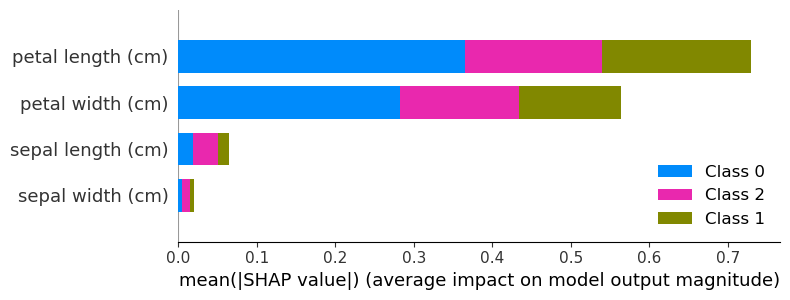

In [47]:
import shap
from sklearn.datasets import load_iris
from sklearn.ensemble import RandomForestClassifier

# Irisデータセットをロード
data = load_iris()
X = data.data
y = data.target
feature_names = data.feature_names

# モデルを定義して訓練
model = RandomForestClassifier(n_estimators=100)
model.fit(X, y)

# SHAPの解釈器を作成
explainer = shap.Explainer(model, X)

# 解釈したいデータポイントを指定
#data_point = X[0]
data_point = X[[0]]  

# SHAPの値を計算
shap_values = explainer.shap_values(data_point,check_additivity=False)

# 特徴量の重要度を表示
#shap.summary_plot(shap_values, features=data_point, feature_names=feature_names)
#shap.plots.beeswarm(shap_values)
shap.summary_plot(shap_values, X, feature_names=feature_names,plot_type='bar')

In [ ]:
#!pip install lime

## LIME

In [44]:
"""
import lime
import lime.lime_tabular
from sklearn.datasets import load_iris
from sklearn.ensemble import RandomForestClassifier

# Irisデータセットをロード
data = load_iris()
X = data.data
y = data.target
feature_names = data.feature_names
class_names = data.target_names

# モデルを定義して訓練
model = RandomForestClassifier(n_estimators=100)
model.fit(X, y)

# LIMEの解釈器を作成
explainer = lime.lime_tabular.LimeTabularExplainer(X, feature_names=feature_names, class_names=class_names)

# 解釈したいデータポイントを指定
data_point = X[0]

# LIMEを実行して解釈結果を取得
explanation = explainer.explain_instance(data_point, model.predict_proba)

# 解釈結果の表示
explanation.show_in_notebook()
"""

In [33]:
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import lime
from lime import lime_tabular

# Irisデータセットをロード
iris = datasets.load_iris()
X = iris.data
y = iris.target
feature_names = iris.feature_names
class_names = iris.target_names

# データセットをトレーニングセットとテストセットに分割
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# ランダムフォレストモデルを作成してトレーニング
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# LIMEのExplainerを初期化
explainer = lime_tabular.LimeTabularExplainer(X_train, feature_names=feature_names, class_names=class_names)

# テストデータの説明を生成
test_instance = X_test[0]
explanation = explainer.explain_instance(test_instance, model.predict_proba, num_features=len(feature_names))

# 説明結果の表示
explanation.show_in_notebook()


In [63]:
class_names

array(['setosa', 'versicolor', 'virginica'], dtype='<U10')

In [80]:
X_test[0]

array([6.1, 2.8, 4.7, 1.2])

In [81]:
y_test[0]

1

In [89]:
import pandas as pd
df = pd.DataFrame(X_test, columns=feature_names)
df['species'] = target_names[y_test]

dt =df.T
dt

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
sepal length (cm),6.1,5.7,7.7,6.0,6.8,5.4,5.6,6.9,6.2,5.8,...,4.7,6.1,5.0,6.4,7.9,6.7,6.7,6.8,4.8,4.8
sepal width (cm),2.8,3.8,2.6,2.9,2.8,3.4,2.9,3.1,2.2,2.7,...,3.2,3.0,3.4,2.8,3.8,3.0,2.5,3.2,3.0,3.1
petal length (cm),4.7,1.7,6.9,4.5,4.8,1.5,3.6,5.1,4.5,3.9,...,1.6,4.9,1.6,5.6,6.4,5.2,5.8,5.9,1.4,1.6
petal width (cm),1.2,0.3,2.3,1.5,1.4,0.4,1.3,2.3,1.5,1.2,...,0.2,1.8,0.4,2.1,2.0,2.3,1.8,2.3,0.3,0.2
species,versicolor,setosa,virginica,versicolor,versicolor,setosa,versicolor,virginica,versicolor,versicolor,...,setosa,virginica,setosa,virginica,virginica,virginica,virginica,virginica,setosa,setosa


In [27]:
#data
model.predict_proba

<bound method ForestClassifier.predict_proba of RandomForestClassifier()>

In [78]:
import pandas as pd
df = pd.DataFrame(iris.data, columns=iris.feature_names)
df['species'] = iris.target_names[iris.target]

dt =df.T

In [17]:
X[0]

array([5.1, 3.5, 1.4, 0.2])

In [49]:
#pd.DataFrame(X)
pd.DataFrame(y)
type(y)

numpy.ndarray

In [46]:
import lime
import lime.lime_tabular  # テーブルデータの場合
from sksurv.ensemble import (
    ComponentwiseGradientBoostingSurvivalAnalysis,
    GradientBoostingSurvivalAnalysis,
    RandomSurvivalForest,
    ExtraSurvivalTrees,
)
from sklearn.ensemble import RandomForestClassifier

X_train = pd.read_pickle(
    config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/CLAUDIN_SUBTYPE/claudin-low/NEWpreprocess4numeric_Incpca26/test_set/train/X.pkl"
)
y =  pd.read_pickle(
    config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/CLAUDIN_SUBTYPE/claudin-low/NEWpreprocess4numeric_Incpca26/test_set/train/y.pkl"
)
X_train = pd.DataFrame(X_train)
y.loc[y ['RFS_STATUS'] == True, 'RFS_STATUS'] = 1
y.loc[y ['RFS_STATUS'] == False, 'RFS_STATUS'] = 0
y = y['RFS_STATUS']
y = y.reset_index(drop=True)
y = pd.DataFrame(y)
y = np.array(y)
#y = float(y)
#df_recurrenced = pd.read_pickle(
#   config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/df_recurrenced4numeric.pkl")
"""
data = ...  # 解釈するデータ（1つ以上のデータポイント）
model = RandomForestClassifier(n_estimators=100)  # 適切なモデルを選択
model.fit(X_train,y.flatten())  # モデルを訓練
"""

explainer = lime.lime_tabular.LimeTabularExplainer(np.array(X_train), feature_names=X_train.columns,class_names=class_names)  # テーブルデータの場合

# 解釈したいデータポイントを指定
data_point = X_train[1]

# LIMEを実行して解釈結果を取得
explanation = explainer.explain_instance(data_point, model.predict_proba)
#explanation = explainer.explain_instance(data, model.predict_proba)  # 解釈を実行

explanation.show_in_notebook()  # ノートブック上で解釈結果を表示


KeyError: 26

In [43]:
X_train.columns

RangeIndex(start=0, stop=26, step=1)

In [159]:
y =  pd.read_pickle(
    config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/CLAUDIN_SUBTYPE/claudin-low/preprocess4numeric_pca92/test_set/train/y.pkl"
)
y.loc[y ['RFS_STATUS'] == True, 'RFS_STATUS'] = 1
y.loc[y ['RFS_STATUS'] == False, 'RFS_STATUS'] = 0
y = y['RFS_STATUS']
y = np.array(y)
y.ravel()
y

array([1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0,
       0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0,
       0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0], dtype=object)

In [152]:
X_train = pd.read_pickle(
    config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/CLAUDIN_SUBTYPE/claudin-low/preprocess4numeric_pca92/test_set/train/X.pkl"
)

y_train =  pd.read_pickle(
    config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/CLAUDIN_SUBTYPE/claudin-low/preprocess4numeric_pca92/test_set/train/y.pkl"
)
pd.DataFrame(X_train)

#y_train = y_train["RFS_STATUS"]
y_train.loc[y_train ['RFS_STATUS'] == True, 'RFS_STATUS'] = int(1)
y_train.loc[y_train ['RFS_STATUS'] == False, 'RFS_STATUS'] = int(0)
y_train = y_train['RFS_STATUS']
y_train = y_train.reset_index(drop=True)
pd.DataFrame(y_train)

,RFS_STATUS
0,1
1,0
2,0
3,0
4,0
...,...
187,1
188,0
189,0
190,0


In [153]:
y_train = np.array(y_train)
y_train

array([1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0,
       0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0,
       0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0], dtype=object)

In [89]:
pd.DataFrame(X_train)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,...,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148
0,31.689191,-12.701890,29.005513,-37.308307,57.188629,2.029355,-15.117644,-30.111373,10.596200,3.746440,-14.233154,11.899002,-33.599849,4.831392,-7.824810,18.675127,-14.386079,13.137511,-0.434516,16.744887,-5.591655,20.076927,7.594598,-12.897337,2.521097,...,20.916526,-2.765731,-18.193963,-4.177655,-6.434185,3.226093,-11.672355,1.251634,7.207294,0.348275,2.305644,-5.549280,-6.387853,-3.738655,14.701127,-6.189814,-2.172176,3.605971,-6.123119,-10.037740,-13.789157,-16.087644,2.128750,0.359173,1.850369
1,-23.456617,-21.038112,-17.790265,55.340326,17.433576,4.877175,14.183438,61.278166,-9.207335,68.879105,-18.710323,-41.623175,-26.442888,-11.387815,-11.079703,18.026772,-58.971847,6.520002,-7.445605,6.387536,28.433607,-41.512032,5.514469,0.867336,11.625678,...,-0.886023,0.819977,0.418218,-0.923908,-1.187640,-0.182691,-3.354429,-1.105751,1.936280,0.135683,-0.066270,0.369599,-1.565580,-0.811997,0.234005,-0.147678,-2.216017,1.528571,1.712230,-0.920668,0.473882,1.365878,0.506916,-2.273970,-0.245889
2,-60.812591,18.146249,-26.745860,10.296342,-12.555249,15.746694,-15.529346,-27.606251,4.573664,8.062127,9.723117,5.883607,-3.609000,-3.585079,-11.431632,8.038195,2.958120,-4.980004,13.054327,-3.587112,8.192098,2.014928,8.113083,4.330346,0.077563,...,11.969950,12.722434,15.125405,4.958046,8.904795,12.770830,-8.308657,28.075760,16.268299,-11.461776,-7.286113,-4.512877,-6.011441,0.585002,-3.388140,8.555504,-10.608854,-8.742132,-10.390657,4.653799,3.723576,11.481571,1.058887,-8.460310,-11.735081
3,-19.603539,-33.174952,-9.126887,-14.006504,-50.306068,-7.203634,55.339580,-9.999143,-9.954347,-27.776345,14.338767,-12.742342,-27.351748,6.070284,29.195023,22.130132,12.151331,12.883628,28.943086,-15.129355,10.199479,16.090825,22.639560,2.376779,8.559112,...,1.867204,-3.561257,-0.902451,1.442744,0.519768,-5.551246,1.635291,-1.472173,0.612132,2.654926,1.042060,-1.057402,0.539855,-5.733314,-5.514365,-0.104234,-1.893197,3.477747,7.554147,4.572059,1.827101,3.539003,-3.337137,3.456312,4.384041
4,39.344353,15.911817,25.942274,33.419754,6.751126,-3.017070,-7.184859,15.818160,28.999338,19.224450,3.610067,10.951773,71.375729,-1.370830,57.185609,29.242458,-36.615117,50.887310,39.181007,-50.648794,-12.570127,4.431143,-3.226800,16.244791,39.270912,...,-2.540389,-0.651940,-3.294791,0.569975,-0.500077,-2.488300,-0.060945,3.472145,-1.176274,-1.610300,-2.184523,3.225746,-2.422641,3.150613,-2.722850,2.429960,1.540511,-0.025487,1.746494,1.605585,-0.521209,0.465183,-2.686320,-3.381333,0.777596
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187,-58.474966,-14.996190,1.515884,9.991007,2.534912,-2.899943,-15.555781,9.942990,-26.900662,5.250769,-18.064741,10.719788,10.588075,-19.430656,3.402066,9.145864,8.407795,1.451046,-15.831755,3.035033,8.720130,3.215681,9.708520,-7.763969,-0.027894,...,-1.820281,-0.089216,-2.493482,-0.472386,-2.650465,4.089219,0.546215,-1.657922,-1.635189,-1.762452,-0.474159,2.943921,0.528314,-2.801668,-2.899748,1.440659,-6.415727,3.023839,-4.079444,-2.817320,-2.916065,4.517117,-2.082421,8.067771,-1.869137
188,9.898708,-26.714489,2.342526,-9.537297,-46.017307,4.610273,36.115378,-18.352116,-4.779120,4.167121,17.391791,-21.621812,10.352225,7.681773,-5.185563,-8.622738,-3.515214,7.692574,12.399209,-3.991188,5.007756,14.582029,-6.429447,-3.995728,-2.717667,...,8.690083,5.855747,-0.095759,-4.470989,-6.388227,0.358762,-8.092637,2.433480,2.010186,1.526342,-5.084961,3.027083,0.444127,-3.359151,5.631523,0.790186,-5.542345,-1.115309,-7.331978,0.347824,-4.030494,3.480415,3.400622,0.227976,-1.873538
189,20.197840,-37.466458,-10.926992,11.217580,57.673738,-30.067805,-11.555567,12.042575,18.907312,3.042106,21.499820,4.662612,-15.278023,10.06

In [73]:
import lime
from lime import lime_tabular
import numpy as np
from sksurv.ensemble import RandomSurvivalForest
from sksurv.datasets import load_veterans_lung_cancer
from sklearn.model_selection import train_test_split


input_pipe_path = "./{0}/{1}/{2}/{3}/{4}/{5}".format(
        config.INTERIM_MODELS_RECURRENCE_DIR,
        "CLAUDIN_SUBTYPE",
        "LumA",
        "NEWpreprocess4numeric_Incpca18",
        "SurvivalTree",
        "test_set",
)
input_data_path = "./{0}/{1}/{2}/{3}/{4}".format(
        config.INTERIM_PREPROCESSED_RECURRENCE_DIR,
        "CLAUDIN_SUBTYPE",
        "LumA",
        "NEWpreprocess4numeric_Incpca18",
        "test_set/test",
    )


_X = pd.read_pickle("{0}/X.pkl".format(input_data_path))
_y = pd.read_pickle("{0}/y.pkl".format(input_data_path)).to_records(index=False)
_X = pd.DataFrame(_X)
_y = pd.DataFrame(_y)

class_names = ["True","False"]
_model_pipeline = functions.pickle_load(
            "{0}/model_pipeline.pkl".format(input_pipe_path)
        )


_estimator = _model_pipeline[-1]

explainer = lime.lime_tabular.LimeTabularExplainer(np.array(_X),class_names=class_names)  # テーブルデータの場合

# 解釈したいデータポイントを指定
data_point = _X[0]

# LIMEを実行して解釈結果を取得
explanation = explainer.explain_instance(data_point, _estimator.predict, num_features=len(_X))
#explanation = explainer.explain_instance(data, model.predict_proba)  # 解釈を実行

explanation.show_in_notebook()  # ノートブック上で解釈結果を表示

"""
# LIMEの説明インスタンスを作成
explainer = lime_tabular.LimeTabularExplainer(_X, mode="regression",  random_state=42)

# 説明を行う対象のデータポイントを選択（ここではテストデータの最初のサンプル）
sample_idx = 0
sample = _X[sample_idx].reshape(1, -1)

# LIMEを用いて生存時間を説明
explanation = explainer.explain_instance(sample[0], _estimator.predict)

# LIMEの説明を表示
explanation.show_in_notebook()
"""

KeyError: 18

In [76]:
explainer.feature_frequencies

{0: array([0.26086957, 0.24637681, 0.24637681, 0.24637681]),
 1: array([0.26086957, 0.24637681, 0.24637681, 0.24637681]),
 2: array([0.26086957, 0.24637681, 0.24637681, 0.24637681]),
 3: array([0.26086957, 0.24637681, 0.24637681, 0.24637681]),
 4: array([0.26086957, 0.24637681, 0.24637681, 0.24637681]),
 5: array([0.26086957, 0.24637681, 0.24637681, 0.24637681]),
 6: array([0.26086957, 0.24637681, 0.24637681, 0.24637681]),
 7: array([0.26086957, 0.24637681, 0.24637681, 0.24637681]),
 8: array([0.26086957, 0.24637681, 0.24637681, 0.24637681]),
 9: array([0.26086957, 0.24637681, 0.24637681, 0.24637681]),
 10: array([0.26086957, 0.24637681, 0.24637681, 0.24637681]),
 11: array([0.26086957, 0.24637681, 0.24637681, 0.24637681]),
 12: array([0.26086957, 0.24637681, 0.24637681, 0.24637681]),
 13: array([0.26086957, 0.24637681, 0.24637681, 0.24637681]),
 14: array([0.26086957, 0.24637681, 0.24637681, 0.24637681]),
 15: array([0.26086957, 0.24637681, 0.24637681, 0.24637681]),
 16: array([0.2608

In [62]:
_y = pd.read_pickle("{0}/y.pkl".format(input_data_path)).to_records(index=False)
_y = pd.DataFrame(_y)
_y

,RFS_STATUS,RFS_MONTHS
0,False,49.87
1,True,95.79
2,True,97.76
3,False,115.49
4,False,265.46
...,...,...
64,False,84.21
65,True,60.99
66,True,48.29
67,False,72.73


In [74]:
len(_X)

69

## eli5

In [70]:
"""
import eli5
from sklearn.datasets import load_iris
from sklearn.ensemble import RandomForestClassifier

# データセットの読み込み
data = load_iris()
X = data.data
y = data.target

# モデルのトレーニング
model = RandomForestClassifier()
model.fit(X, y)

# 特徴量の重要度の解析
feature_names = data.feature_names
target_names = data.target_names
eli5.show_weights(model, feature_names=feature_names)

instance = X[0]
eli5.show_prediction(model, instance, feature_names=feature_names,target_names = target_names)
"""

In [26]:
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import eli5
from eli5.sklearn import PermutationImportance

# Irisデータセットをロード
iris = datasets.load_iris()
X = iris.data
y = iris.target
feature_names = iris.feature_names
target_names = iris.target_names
# データセットをトレーニングセットとテストセットに分割
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# ランダムフォレストモデルを作成してトレーニング
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# テストセットの予測結果を解釈
perm = PermutationImportance(model, random_state=42).fit(X_test, y_test)
eli5.show_weights(perm, feature_names=feature_names)

instance = X_test[0]
eli5.show_prediction(model, instance, feature_names=feature_names,target_names = target_names)


In [82]:
X_test[0]

array([6.1, 2.8, 4.7, 1.2])

In [83]:
y_test[0]

1

In [21]:
data.target_names

array(['setosa', 'versicolor', 'virginica'], dtype='<U10')

In [9]:
from sklearn import svm
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
import eli5
from eli5.sklearn import PermutationImportance

# データセットの読み込み
data = load_iris()
X = data.data
y = data.target

# 訓練データとテストデータに分割
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# SVMモデルの作成と訓練
model = svm.SVC(kernel='linear')
model.fit(X_train, y_train)

# テストデータの予測
y_pred = model.predict(X_test)

# モデルの解釈（特徴量の重要度を表示）
perm = PermutationImportance(model, random_state=42).fit(X_test, y_test)
eli5.show_weights(perm, feature_names=data.feature_names)


Weight,Feature
0.5867 ± 0.2332,petal length (cm)
0.2267 ± 0.1293,petal width (cm)
0.0333 ± 0.0422,sepal length (cm)
0.0200 ± 0.0327,sepal width (cm)


## eli5_実装

In [3]:
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import eli5
from eli5.sklearn import PermutationImportance
from sksurv.ensemble import RandomSurvivalForest
import pandas as pd
import config

pkl_path = "./{0}/{1}/{2}".format(
        config.INTERIM_PREPROCESSED_RECURRENCE_DIR,
        "CLAUDIN_SUBTYPE/claudin-low/preprocess4numeric_pca41",
        "test_set/test",
    )
preprocess_pipeline = functions.pickle_load(pkl_path + "/preprocess_pipeline.pkl")
pca = preprocess_pipeline[-1]

    # 主成分負荷量（loading）の計算
loadings = pd.DataFrame(
        pca.components_ * np.c_[np.sqrt(pca.explained_variance_)],
        index=pca.get_feature_names_out(),
        columns=pca.feature_names_in_,
    )
    
X_train = pd.read_pickle(
    config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/CLAUDIN_SUBTYPE/claudin-low/preprocess4numeric_pca41/test_set/train/X.pkl"
)

y_train = pd.read_pickle(
    config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/CLAUDIN_SUBTYPE/claudin-low/preprocess4numeric_pca41/test_set/train/y.pkl"
).to_records(index=False)

X_test = pd.read_pickle(
    config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/CLAUDIN_SUBTYPE/claudin-low/preprocess4numeric_pca41/test_set/test/X.pkl"
)

y_test = pd.read_pickle(
    config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/CLAUDIN_SUBTYPE/claudin-low/preprocess4numeric_pca41/test_set/test/y.pkl"
).to_records(index=False)

#feature_names = iris.feature_names
#target_names = data.target_names

# データセットをトレーニングセットとテストセットに分割

# ランダムフォレストモデルを作成してトレーニング
"""
rsf = RandomSurvivalForest(
    n_estimators=1000,
    min_samples_split=10,
    min_samples_leaf=15,
    n_jobs=-1,
    random_state=config.SEED,
)
rsf.fit(X_train, y_train)
"""
rsf= RandomForestClassifier()
rsf.fit(X_train, y_train)

# テストセットの予測結果を解釈
perm = PermutationImportance(rsf, random_state=42).fit(X_test, y_test)
eli5.show_weights(perm)
#eli5.show_weights(perm, feature_names=loadings.index)

instance = X_test[0]
eli5.show_prediction(rsf, instance)
#eli5.show_prediction(rsf, instance, feature_names=loading.index,target_names = y_test.values)

/root/miniconda3/lib/python3.8/site-packages/eli5/formatters/html.py:233: RuntimeWarning: invalid value encountered in double_scalars
  rel_weight = (abs(weight) / weight_range) ** 0.7


TypeError: unhashable type: 'writeable void-scalar'

In [4]:
from sksurv.ensemble import RandomSurvivalForest
import eli5

# RandomSurvivalForestモデルを学習させる
model = RandomSurvivalForest()
model.fit(X, y)

# 各特徴量の平均増加の生存時間を計算する
feature_importances = model.feature_importances_

# 特徴量の重要度を降順にソートする
sorted_indices = feature_importances.argsort()[::-1]
sorted_feature_importances = feature_importances[sorted_indices]
sorted_feature_names = feature_names[sorted_indices]

# 特徴量の重要度を可視化する
eli5.show_weights(feature_names=sorted_feature_names, weights=sorted_feature_importances)


NameError: name 'X' is not defined

In [29]:
    pkl_path = "./{0}/{1}/{2}".format(
        config.INTERIM_PREPROCESSED_RECURRENCE_DIR,
        "CLAUDIN_SUBTYPE/claudin-low/preprocess4numeric_pca41",
        "test_set/test",
        
    )
    preprocess_pipeline = functions.pickle_load(pkl_path + "/preprocess_pipeline.pkl")
    pca = preprocess_pipeline[-1]

    # 主成分負荷量（loading）の計算
    loadings = pd.DataFrame(
        pca.components_ * np.c_[np.sqrt(pca.explained_variance_)],
        index=pca.get_feature_names_out(),
        columns=pca.feature_names_in_,
    )

In [33]:
loadings.index

Index(['pca0', 'pca1', 'pca2', 'pca3', 'pca4', 'pca5', 'pca6', 'pca7', 'pca8',
       'pca9', 'pca10', 'pca11', 'pca12', 'pca13', 'pca14'],
      dtype='object')

In [39]:
y_test.values

array([[False, 3.32],
       [False, 81.28],
       [False, 90.33],
       [True, 44.08],
       [False, 64.38],
       [False, 232.93],
       [False, 144.44],
       [False, 155.72],
       [True, 44.57],
       [False, 161.05],
       [False, 173.32],
       [True, 64.05],
       [True, 22.7],
       [False, 127.53],
       [True, 18.78],
       [False, 113.26],
       [False, 191.61],
       [False, 75.63],
       [False, 161.28],
       [True, 102.66],
       [False, 217.99],
       [True, 52.86]], dtype=object)

# eli5実装済み

In [125]:
import eli5
from eli5.sklearn import PermutationImportance
import matplotlib.pyplot as plt

subgroup = "CLAUDIN_SUBTYPE"
subtypes = "Normal"
data = "NEWpreprocess4numeric_Incpca5"
model = "ExtraSurvivalTrees"

input_pipe_path = "./{0}/{1}/{2}/{3}/{4}/{5}".format(
        config.INTERIM_MODELS_RECURRENCE_DIR,
        subgroup,
        subtypes,
        data,
        model,
        "test_set"
)

input_data_path = "./{0}/{1}/{2}/{3}/{4}".format(
        config.INTERIM_PREPROCESSED_RECURRENCE_DIR,
        subgroup,
        subtypes,
        data,
        "test_set/late_recurrences"
    )


_X = pd.read_pickle("{0}/X.pkl".format(input_data_path))
_y = pd.read_pickle("{0}/y.pkl".format(input_data_path)).to_records(index=False)
_X = pd.DataFrame(_X)

"""
feature_names = []
for i in range(18):
    feature_names.append("Feature"+str(i))
feature_names

_X.columns = feature_names
"""
_model_pipeline = functions.pickle_load(
            "{0}/model_pipeline.pkl".format(input_pipe_path)
        )

_estimator = _model_pipeline[-1]
print(_estimator)
print(subtypes)
#eli5.show_weights(model, feature_names=data.feature_names)
perm = PermutationImportance(_estimator, random_state=config.SEED).fit(_X, _y)
eli5.show_weights(perm)

ExtraSurvivalTrees(min_samples_leaf=15, min_samples_split=10, n_estimators=1000,
                   n_jobs=-1, random_state=100)
Normal


Weight,Feature
0.0746 ± 0.0963,x3
0.0439 ± 0.0628,x1
0.0407 ± 0.0390,x2
-0.0074 ± 0.0279,x0
-0.0323 ± 0.0461,x4


In [119]:
functions.make_dir(config.FIGURES_EXPLAIN_RECURRENCE_DIR)
functions.make_dir("{0}/{1}/{2}/{3}/{4}".format(config.FIGURES_EXPLAIN_RECURRENCE_DIR, subgroup, subtypes, data, model))


# プロットを保存（保存先を指定）
save_path = "{0}/{1}/{2}/{3}/{4}".format(config.FIGURES_EXPLAIN_RECURRENCE_DIR, subgroup, subtypes, data, model)

with open(save_path+"/permutation_importance_plot.html", "w", encoding="utf-8") as f:
    f.write(eli5.show_weights(perm).data)

In [126]:
_X

,0,1,2,3,4
0,-10.625529,15.862740,13.414167,-76.343267,-25.716991
1,50.286666,48.072912,14.433441,-26.658913,-11.766660
2,14.987663,31.537730,5.521160,20.147396,-8.901398
3,43.381308,-20.579624,-6.402999,1.214716,3.966770
4,15.271439,-10.667614,33.427328,-7.551988,-40.688246
5,44.103358,-29.240977,-0.160649,30.503971,-4.017645
6,35.876351,-46.933896,-12.246037,9.829120,-7.334193
7,53.167140,19.167813,29.820348,15.434108,2.599923
8,30.117528,-24.948523,6.266538,30.870276,-14.581181
9,29.800382,32.741404,-2.811227,41.519697,-9.285011


In [97]:
feature_names = []
for i in range(18):
    feature_names.append("Feature"+str(i))
feature_names
_X.columns = feature_names
_X

,Feature0,Feature1,Feature2,Feature3,Feature4,Feature5,Feature6,Feature7,Feature8,Feature9,Feature10,Feature11,Feature12,Feature13,Feature14,Feature15,Feature16,Feature17
0,19.063044,-26.013641,-30.630041,8.395143,9.318885,6.569566,-4.019017,17.943876,19.387936,-19.767093,-0.927251,6.885317,-0.083220,-6.664648,-10.370922,-6.455855,0.322961,3.329261
1,-18.320585,10.752484,-23.887907,-16.326188,8.970099,-12.108938,-8.690785,-12.914043,8.733634,18.146396,4.558129,-2.927669,5.750528,7.424969,9.301484,-5.722975,18.871220,-12.659178
2,56.077463,-32.653300,54.034755,-2.461431,56.160788,-22.255624,2.056598,-12.571105,-47.336411,7.609406,11.204730,-5.167363,-4.123023,4.039900,-5.322026,-6.368237,-13.608614,-10.922042
3,22.428115,-47.678029,-57.889532,18.050266,14.710789,-41.078516,-24.338430,-17.438969,11.802921,21.296584,-17.007378,-5.931265,9.982261,25.490888,8.639948,-2.532382,4.482067,-5.123597
4,-12.402128,16.528216,42.588601,-29.801974,26.995795,-12.327384,-27.532141,-22.116831,-23.127807,-8.137711,19.045001,-1.661115,-9.264549,-4.662389,4.122053,-26.324701,11.820993,-5.128702
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,-4.670879,4.181548,23.201283,8.216386,-15.530942,23.282974,-8.085910,-16.020638,10.857107,-13.213885,9.082813,-2.225765,24.378780,15.888775,-0.002185,-2.438807,1.181964,-19.289389
65,-32.289741,2.810361,20.511751,-8.047225,-9.702865,-9.013720,16.778965,1.769743,8.392456,-36.517156,14.317309,4.356442,-13.195737,0.512626,9.474898,-3.441029,-12.545905,5.599862
66,-27.254725,-2.082721,-20.668917,-16.878243,4.093442,2.488577,28.307630,8.644633,9.890734,-1.816864,9.854604,3.616673,-6.147475,0.448015,-13.040687,-5.409317,-1.609259,-1.405650
67,9.842282,5.774838,-43.011340,25.389480,6.990824,-17.735913,1.861601,-19.876901,-22.095429,-31.828236,-0.577926,26.691031,5.667065,-10.885851,-3.320444,3.919326,14.933750,-6.537856


Index(['Feature0', 'Feature1', 'Feature2', 'Feature3', 'Feature4', 'Feature5',
       'Feature6', 'Feature7', 'Feature8', 'Feature9', 'Feature10',
       'Feature11', 'Feature12', 'Feature13', 'Feature14', 'Feature15',
       'Feature16', 'Feature17'],
      dtype='object')

In [5]:
eli5.show_weights(_estimator)

## Anchors

In [18]:
#!pip install anchor

In [10]:
from anchor import anchor_tabular
from sklearn.datasets import load_iris
import numpy as np

# Irisデータセットの読み込み
data = load_iris()
X = data.data
feature_names = data.feature_names
class_names = data.target_names

# Anchorの初期化
explainer = anchor_tabular.AnchorTabularExplainer(class_names, feature_names, X)

# 解釈したいデータポイントを指定
data_point = X[0]


def get_sample_fn(self, data_row, classifier_fn, desired_label=None):
    # ... 既存のコード ...
    labels = np.zeros(num_samples, dtype=int)  # ラベル配列を0で初期化
    # ... 既存のコード ...
    return sample_fn, mapping, labels  # 追加: labelsを返す

def predict_function(X):
    # モデルの予測処理を行うコードを記述
    # ここではダミーの予測を行う例を示します
    predictions = [1] * len(X)  # ダミーの予測結果の配列
    return predictions

# Anchorの生成
explanation = explainer.explain_instance(data_point, predict_function, threshold=0.95)

# Anchorの表示
print("Anchor: %s" % (' AND '.join(explanation.anchor)))


ModuleNotFoundError: No module named 'anchor'

In [ ]:
#!pip install alibi
#!pip install anchor
#!python --version
#!pip install anchor-exp
!pip uninstall anchor

In [110]:
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from anchor import tabular

# Irisデータセットをロード
iris = datasets.load_iris()
X = iris.data
y = iris.target
feature_names = iris.feature_names
class_names = iris.target_names

# データセットをトレーニングセットとテストセットに分割
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# ランダムフォレストモデルを作成してトレーニング
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# AnchorsのExplainerを初期化
explainer = tabular.AnchorTabularExplainer(
    feature_names=feature_names,
    class_names=class_names.tolist(),
    categorical_names={},
    seed=42
)

# テストデータの説明を生成
test_instance = X_test[0].reshape(1, -1)
explanation = explainer.explain_instance(
    test_instance,
    model.predict_proba,
    threshold=0.95
)

# 説明結果の表示
print('Anchor: %s' % (' AND '.join(explanation.anchor)))


ImportError: cannot import name 'tabular' from 'anchor' (/root/miniconda3/lib/python3.8/site-packages/anchor/__init__.py)

In [104]:
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
#from anchor import utils
from anchor import anchor_tabular

# Irisデータセットをロード
iris = datasets.load_iris()
X = iris.data
y = iris.target
feature_names = iris.feature_names
class_names = iris.target_names

# データセットをトレーニングセットとテストセットに分割
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# ランダムフォレストモデルを作成してトレーニング
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

explainer = anchor_tabular.AnchorTabularExplainer(
    iris.class_names,
    iris.feature_names,
    iris.train,
    iris.categorical_names)


ImportError: cannot import name 'anchor_tabular' from 'anchor' (/root/miniconda3/lib/python3.8/site-packages/anchor/__init__.py)

# pipelineの練習

In [ ]:
from sklearn.datasets import load_wine
from sklearn.model_selection import train_test_split
import pandas as pd

data = load_wine()

X = pd.DataFrame(data["data"], columns=data["feature_names"])
y = pd.DataFrame(data["target"], columns=["target"])


X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.decomposition import PCA


class StandardScalerAsDataFrame(BaseEstimator, TransformerMixin):
    def __init__(self, selector=None):
        self.selector = selector
        self.std = StandardScaler()

    def fit(self, X, y=None):
        self.std.fit(X)
        return self

    def transform(self, X):
        return pd.DataFrame(self.std.transform(X), index=X.index, columns=X.columns)


class PCAAsDataFrame(BaseEstimator, TransformerMixin):
    def __init__(self, selector=None):
        self.selector = selector
        self.pca = PCA(n_components=3, random_state=100)

    def fit(self, X, y=None):
        self.pca.fit(X)
        return self

    def transform(self, X):
        return pd.DataFrame(
            self.pca.transform(X),
            index=X.index,
            columns=self.pca.get_feature_names_out(),
        )

    def show_progress(self, X):
        # 主成分負荷量の計算と表示
        loadings = pd.DataFrame(self.pca.components_.T, index=X.columns)
        # 主成分スコアの計算
        score = pd.DataFrame(self.pca.transform(X), index=X.index)
        # 寄与率:各主成分がどれくらいデータを説明できているのかを表す指標
        contribution_ratios = pd.DataFrame(self.pca.explained_variance_ratio_)
        # 累積寄与率:この寄与率を累積して,ある寄与率に達するまでには第何主成分までが必要かを見ることが多い
        cumulative_contribution_ratios = contribution_ratios.cumsum()
        print(
            "loadings: {0}, score: {1}, 寄与率: {2}, 累積寄与率: {3} ".format(
                loadings, score, contribution_ratios, cumulative_contribution_ratios
            )
        )


# sampling
from imblearn.over_sampling import SMOTE


class SMOTEAsDataFrame(BaseEstimator, TransformerMixin):
    def __init__(self, selector=None):
        self.selector = selector
        self.smote = SMOTE(sampling_strategy="minority", random_state=100)

    def fit(self, X, y):
        X, y = self.smote.fit_resample(X, y)
        return self

    def transform(self, X):
        return X


class Echo(BaseEstimator, TransformerMixin):
    def __init__(self, selector=None):
        self.selector = selector

    def fit(self, X, y):
        print("@fit step: ", X.shape, y.shape)
        return self

    def transform(self, X):
        print("@transform step: ", X.shape)
        return X

In [ ]:
from imblearn.over_sampling import SMOTE

# from imblearn.pipeline import Pipeline as imbPipeline
from imblearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingClassifier


from sklearn.neighbors import KNeighborsClassifier


from sklearn import set_config

set_config(display="diagram")
pipe = Pipeline(
    steps=[
        ("echo1", Echo()),
        ("pca", PCA()),
        ("echo2", Echo()),
        ("smote", SMOTE()),
        ("echo3", Echo()),
        ("knn", KNeighborsClassifier()),
    ],
    verbose=True,
)

pipe.fit(X_train, y_train)
huga = pipe.predict(X_test)

In [ ]:
pipe

### pipelineからもクラスのメソッドが利用できるかの確認

In [ ]:
# 主成分負荷量の計算と表示
loadings = pd.DataFrame(pipe[1].components_.T, index=X.columns)
# 主成分スコアの計算
score = pd.DataFrame(pipe[1].transform(X), index=X.index)
# 寄与率:各主成分がどれくらいデータを説明できているのかを表す指標
contribution_ratios = pd.DataFrame(pipe[1].explained_variance_ratio_)
# 累積寄与率:この寄与率を累積して,ある寄与率に達するまでには第何主成分までが必要かを見ることが多い
cumulative_contribution_ratios = contribution_ratios.cumsum()
print(
    "loadings: {0}, score: {1}, 寄与率: {2}, 累積寄与率: {3} ".format(
        loadings, score, contribution_ratios, cumulative_contribution_ratios
    )
)

# scikit-survival の練習

チュートリアル

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline

from sklearn import set_config
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder

from sksurv.datasets import load_gbsg2
from sksurv.preprocessing import OneHotEncoder
from sksurv.ensemble import RandomSurvivalForest

set_config(display="text")  # displays text representation of estimators

In [ ]:
X, y = load_gbsg2()

grade_str = X.loc[:, "tgrade"].astype(object).values[:, np.newaxis]
grade_num = OrdinalEncoder(categories=[["I", "II", "III"]]).fit_transform(grade_str)

X_no_grade = X.drop("tgrade", axis=1)
Xt = OneHotEncoder().fit_transform(X_no_grade)
Xt.loc[:, "tgrade"] = grade_num

In [ ]:
random_state = 20

X_train, X_test, y_train, y_test = train_test_split(
    Xt, y, test_size=0.25, random_state=random_state
)

In [ ]:
rsf = RandomSurvivalForest(
    n_estimators=1000,
    min_samples_split=10,
    min_samples_leaf=15,
    n_jobs=-1,
    random_state=random_state,
)
rsf.fit(X_train, y_train)
rsf.score(X_test, y_test)

実際のデータ

In [ ]:
import pandas as pd
from sksurv.ensemble import RandomSurvivalForest

import config

In [ ]:
def generate_target():
    # RFS_STATUSのみにnullがあるため、そのデータについては患者データを削除する
    df_MB.dropna(subset=["RFS_STATUS", "RFS_MONTHS"], inplace=True)
    # 予測ラベルを扱いやすい形に変更
    df_MB["RFS_STATUS"] = df_MB["RFS_STATUS"].replace(
        {"1:Recurred": 1, "0:Not Recurred": 0}
    )
    df_MB["RFS_STATUS"] = df_MB["RFS_STATUS"].astype(bool)
    df_MB["RFS_MONTHS"] = df_MB["RFS_MONTHS"].astype(float)


df_MB = pd.read_pickle(config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/df_MB.pkl")
generate_target()

df_gene_expressions = pd.read_pickle(
    config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/df_gene_expressions.pkl"
)
df_merged = pd.merge(
    df_MB[["RFS_STATUS", "RFS_MONTHS", "CLAUDIN_SUBTYPE"]],
    df_gene_expressions,
    right_index=True,
    left_index=True,
)

In [ ]:
from sklearn.model_selection import train_test_split

y = df_merged[df_merged.CLAUDIN_SUBTYPE == "Her2"][["RFS_STATUS", "RFS_MONTHS"]]
X = df_merged[df_merged.CLAUDIN_SUBTYPE == "Her2"].drop(
    ["RFS_STATUS", "RFS_MONTHS"], axis=1
)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=config.SEED)

In [ ]:
y_events = y_train[y_train["RFS_STATUS"]]
train_min, train_max = y_events["RFS_MONTHS"].min(), y_events["RFS_MONTHS"].max()

y_events = y_test[y_test["RFS_STATUS"]]
test_min, test_max = y_events["RFS_MONTHS"].min(), y_events["RFS_MONTHS"].max()

print(train_min, test_min, test_max, train_max)

assert (
    train_min <= test_min < test_max < train_max
), "time range or test data is not within time range of training data."

In [ ]:
y_train[y_train.RFS_STATUS]["RFS_MONTHS"].max()

In [ ]:
import matplotlib.pyplot as plt

y_train[y_train["RFS_STATUS"]].RFS_MONTHS.hist()
y_test[y_test["RFS_STATUS"]].RFS_MONTHS.hist()
plt.show()

In [ ]:
from sklearn.preprocessing import StandardScaler

std = StandardScaler()

std.fit(X_train)
X_train = pd.DataFrame(
    std.transform(X_train), index=X_train.index, columns=X_train.columns
)
X_test = pd.DataFrame(std.transform(X_test), index=X_test.index, columns=X_test.columns)

In [ ]:
import time
from sklearn.decomposition import PCA

pca = PCA(n_components=0.95, random_state=config.SEED)

st = time.time()
pca.fit(X_train)
ed = time.time()
print("fitting time: ", ed - st)
X_train = pd.DataFrame(
    pca.transform(X_train), index=X_train.index, columns=pca.get_feature_names_out()
)
X_test = pd.DataFrame(
    pca.transform(X_test), index=X_test.index, columns=pca.get_feature_names_out()
)

In [ ]:
rsf = RandomSurvivalForest(
    n_estimators=1000,
    min_samples_split=10,
    min_samples_leaf=15,
    n_jobs=-1,
    random_state=config.SEED,
)
st = time.time()
rsf.fit(X_train, y_train.to_records(index=False))
ed = time.time()
print("fitting time: ", ed - st)

rsf.score(X_test, y_test.to_records(index=False))

## 全訓練データ
学習時間：およそ5時間  
スコア：0.5912339789993447
## CLAUDIN_SUBTYPE
### LumA
fitting time:  1240.5047543048859  
0.46822397801442805

### LumB
fitting time:  524.0930061340332  
0.5616502578527895

### Her2
fitting time:  77.8102433681488  
0.5042826552462527

fitting time:  58.654019355773926  
0.621031746031746

## THREEGENES
### ER+/HER2- Low Prolif
fitting time:  1018.359384059906  
0.5607091321377036

### ER+/HER2- High Prolif
fitting time:  946.286304473877   
0.5472560975609756

### ER-/HER2-
fitting time:  149.6308627128601  
0.45369705671213206

### HER2+
fitting time:  53.25194692611694  
0.4945717732207479

In [ ]:
from sklearn.metrics import mean_squared_error

y_pred = rsf.predict(X_train)
display(mean_squared_error(y_train.RFS_MONTHS, y_pred, squared=False))

y_pred = rsf.predict(X_test)
display(mean_squared_error(y_test.RFS_MONTHS, y_pred, squared=False))

In [ ]:
y.sort_values("RFS_MONTHS", ascending=False).plot.bar()

In [ ]:
# 患者ごとの生存関数（非再発）
surv = rsf.predict_survival_function(X_test.head(), return_array=True)

for i, s in enumerate(surv):
    plt.step(rsf.event_times_, s, where="post", label=str(i))
plt.ylabel("Survival probability")
plt.xlabel("Time in days")
plt.legend(X_test.index)
plt.grid(True)
plt.show()

# 患者ごとのハザード関数（再発）
surv = rsf.predict_cumulative_hazard_function(X_test.head(), return_array=True)

for i, s in enumerate(surv):
    plt.step(rsf.event_times_, s, where="post", label=str(i))
plt.ylabel("Cumulative hazard")
plt.xlabel("Time in days")
plt.legend(X_test.index)
plt.grid(True)
plt.show()

In [ ]:
y_test.head().RFS_MONTHS.dtype

shapが使用できるか確認

https://github.com/sebp/scikit-survival/discussions/213



In [ ]:
import shap

# load JS visualization code to notebook
shap.initjs()

# explain the model's predictions using SHAP values
explainer = shap.Explainer(rsf.predict, X_test, feature_names=X_test.columns)
shap_values = explainer(X_test.head())

In [ ]:
shap.plots.beeswarm(shap_values)

In [ ]:
y_test.to_records(index=False)

In [ ]:
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(rsf, n_iter=15, random_state=config.SEED)
perm.fit(X_test, y_test.to_records(index=False))
eli5.show_weights(perm)

In [26]:
df_recurrenced = pd.read_pickle(config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/df_recurrenced4numeric.pkl")
r = df_recurrenced[df_recurrenced["CLAUDIN_SUBTYPE"] == "claudin-low"]
r

,RFS_MONTHS,RFS_STATUS,CLAUDIN_SUBTYPE,THREEGENE,RERE,RNF165,PHF7,CIDEA,TENT2,SLC17A3,SDS,ATP6V1C2,F3,FAM71C,LIN52,PCOTH,GRM1,FXN,SLC9A1,PML,CD164,MOB3A,HGC6.1.1,OR1J2,GNG5,...,SHISA2,BCAT1,NCKAP1L,CATSPERD,AK098705,PSMC3IP,TEAD1,TTC41P,GRHPR,CHRNB1,RAB4B-EGLN2,TBC1D4,TSPAN11,ANGPTL2,ENOX1,LOC283104,VN1R4,TRPV5,UGGT1,CR590356,VPS72,CSMD3,CC2D1A,IGSF9,FAM71A
MB-0000,138.65,False,claudin-low,ER-_HER2-,9.738092,6.469688,5.652674,11.558869,8.340484,5.648494,5.336235,5.468668,7.070649,5.477154,6.811309,5.440853,5.361170,5.823306,8.809831,6.790593,6.141047,6.499117,5.669507,5.469022,8.091453,...,6.155340,6.285499,6.547422,5.353135,5.198876,5.901473,5.610397,5.515762,8.139151,6.476209,10.232505,7.311327,5.458092,9.677952,5.918239,5.295203,5.474224,5.415184,7.021679,5.947334,8.010657,5.299815,6.235804,5.947404,5.133576
MB-0022,98.22,False,claudin-low,NaN,8.436053,5.845972,5.796744,9.513015,8.955945,5.566713,6.258003,5.273220,7.257667,5.299815,6.250129,5.567929,5.617658,5.666111,7.281997,6.237218,9.683707,6.230747,5.428407,5.701986,8.504650,...,8.417847,7.585615,6.418676,5.335976,5.480618,5.675537,5.563520,5.420137,7.826649,7.032848,9.959284,7.298256,5.634892,7.765512,5.687635,5.496705,5.256771,5.653375,7.311774,6.043325,7.506798,5.336678,6.040794,5.909208,5.493015
MB-0045,105.99,True,claudin-low,NaN,8.924356,6.484831,5.587276,6.136200,8.780870,5.623868,5.845972,5.576293,5.326043,5.430891,6.208258,5.230423,5.260538,6.137790,8.594092,6.703164,5.997179,7.016933,5.416460,5.349814,8.316701,...,6.250129,6.550116,7.746435,5.370772,5.472630,5.944076,5.540585,5.443714,8.272681,6.343149,10.612692,7.478202,5.468252,8.462743,5.883067,5.435909,5.409333,5.393988,7.807015,6.080039,8.301804,5.313254,6.281194,6.264153,5.547820
MB-0048,102.47,False,claudin-low,NaN,8.452693,6.219375,5.689668,7.450287,8.821396,5.553995,6.151984,5.363795,6.597500,5.216533,5.940202,5.509043,5.363620,5.862219,7.548023,6.707874,8.918334,6.083554,5.372138,5.584151,8.456290,...,10.472889,7.222594,6.566915,5.324744,5.415729,5.541037,5.590798,5.281257,8.303034,6.842460,9.999780,7.554468,5.439126,8.448715,5.539119,5.259073,5.340608,5.432089,7.194426,5.829416,7.496171,5.176560,6.065291,5.651414,5.825701
MB-0081,68.59,False,claudin-low,NaN,8.015040,6.448189,5.811672,6.586968,8.777659,5.487293,6.002928,5.108983,7.893823,5.243339,6.522952,5.297176,5.542544,6.005666,7.072457,6.368770,9.395521,6.379927,5.473346,5.540856,8.678622,...,8.352025,6.903633,7.287459,5.519555,5.375978,5.693703,5.601304,5.754784,8.002890,6.976396,9.427162,7.386990,5.536253,7.852036,5.777085,5.543556,5.173100,5.418731,7.707661,5.626280,7.996805,5.233337,5.920278,5.862106,5.396876
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MB-7158,31.78,True,claudin-low,ER-_HER2-,8.998348,5.677709,6.107793,7.417070,7.711076,5.625621,6.342212,10.383044,6.002593,5.461014,5.987913,5.138582,5.276876,6.201636,8.990871,8.148408,5.707578,7.697001,5.184486,5.544550,8.311398,...,6.424367,6.311625,7.654590,5.271930,5.363517,6.110228,5.709014,5.438024,7.824556,6.717252,10.822579,7.353499,5.564149,9.585205,5.160068,5.471610,5.304862,5.369357,8.159564,7.595138,7.995746,5.309531,6.498311,6.384151,5.207904
MB-7201,161.28,False,claudin-low,ER-_HER2-,9.946123,6.299632,5.889670,7.454006,8.716918,5.683125,6.031962,5.427166,5.889443,5.478839,6.189466,5.619200,5.373994,6.282974,9.584105,7.802905,6.234402,7.398710,5.575625,5.457968,8.682622,...,5.439845,6.004009,8.553525,5.313177,5.412681,5.911416,5.373225,5.466615,7.722920,6.682545,10.393293,8.552803,5.468806,7.091550,5.164773,5.468631,5.169055,5.535984,7.552121,6.296853,7.692906,5.568068,6.284653,6.600070,5.008362
MB-7215,206.22,False,claudin-low,ER+_HER2-_Low_Prolif,9.191999,6.070704,6.161842,9.837925,8.512797,5.536182,6.275493,5.357858,5.619272,5.503107,6.196128,5.429752,5.404211,6.263172,8.996162,7.278257,5.773079,6.817778,5.513542,5.

In [27]:
r.sort_values(by='RFS_MONTHS')

,RFS_MONTHS,RFS_STATUS,CLAUDIN_SUBTYPE,THREEGENE,RERE,RNF165,PHF7,CIDEA,TENT2,SLC17A3,SDS,ATP6V1C2,F3,FAM71C,LIN52,PCOTH,GRM1,FXN,SLC9A1,PML,CD164,MOB3A,HGC6.1.1,OR1J2,GNG5,...,SHISA2,BCAT1,NCKAP1L,CATSPERD,AK098705,PSMC3IP,TEAD1,TTC41P,GRHPR,CHRNB1,RAB4B-EGLN2,TBC1D4,TSPAN11,ANGPTL2,ENOX1,LOC283104,VN1R4,TRPV5,UGGT1,CR590356,VPS72,CSMD3,CC2D1A,IGSF9,FAM71A
MB-0284,0.00,False,claudin-low,ER-_HER2-,8.229548,6.528297,5.491469,9.844617,7.677648,5.436516,6.153789,6.554475,6.383934,5.406540,6.612562,5.454594,5.287021,6.107658,8.757913,6.326925,6.338278,6.689606,5.439165,5.377967,8.533088,...,6.948988,7.161953,6.542016,5.353778,5.490895,6.278901,5.653555,5.346315,8.294902,6.766722,10.801660,6.653448,5.416767,10.061133,5.506827,5.552217,5.222914,5.463593,7.440798,6.362335,8.164830,5.299772,6.235238,6.522952,5.411778
MB-5311,0.69,True,claudin-low,ER-_HER2-,9.024360,6.391429,5.875482,5.889680,8.140434,5.740724,8.106874,5.254521,5.900634,5.296155,5.605448,5.489364,5.470030,6.291782,9.692395,7.005329,5.714327,7.299982,5.384546,5.527317,8.354723,...,7.772299,7.943242,6.572503,5.345358,5.178094,5.647758,5.449756,5.142431,8.097619,6.680373,10.926077,7.508379,5.840368,10.858646,5.609614,5.355624,5.518688,5.113806,7.600999,6.235347,8.016569,5.240377,6.077641,6.306351,5.256046
MB-0627,0.76,False,claudin-low,ER-_HER2-,8.614356,6.034217,5.642313,8.946296,8.627070,5.550411,6.011818,5.523048,6.721334,5.443816,6.687672,5.720732,5.478652,5.962229,8.990591,6.352326,6.438604,6.800175,5.384699,5.698837,8.845640,...,5.544865,8.434701,7.405814,5.187714,5.308929,5.906486,5.672020,5.228991,7.496627,6.962068,10.554393,7.277813,5.495293,9.525949,5.532247,5.302231,5.381426,5.599717,7.920510,5.667514,7.986918,5.316956,6.046692,7.351246,5.588471
MB-0156,2.83,False,claudin-low,NaN,9.533756,6.900150,5.612413,9.993010,8.537321,5.428508,5.704733,5.347285,5.943401,5.660212,6.408029,5.306858,5.437547,6.044198,8.926238,6.703164,6.537326,6.677175,5.413246,5.358560,8.407779,...,6.243935,6.736156,6.707157,5.261526,5.366826,5.556792,5.568768,5.258479,7.832863,7.036079,10.445108,7.641488,5.258481,9.987552,5.798647,5.391028,5.287536,5.576908,7.447554,5.883357,7.566169,5.287492,6.658756,5.720102,4.998942
MB-0285,3.32,False,claudin-low,ER-_HER2-,9.338168,5.825218,5.814601,11.958567,8.290384,5.645638,6.494630,5.419070,6.270858,5.418828,6.854288,5.674101,5.359065,5.950397,8.736590,6.718756,6.178279,7.248976,5.544641,5.498536,7.915805,...,7.693948,7.233915,6.925574,5.264897,5.283370,6.115332,5.542493,5.543884,8.415288,6.860729,10.639883,7.286785,5.558512,10.923762,5.720459,5.424191,5.423884,5.494081,7.225712,5.697212,7.844837,5.510640,5.958650,5.760867,5.701940
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MB-2823,266.35,False,claudin-low,ER+_HER2-_Low_Prolif,9.698285,6.951751,5.956066,10.342501,8.032250,5.717691,6.240048,5.375572,6.442353,5.317423,5.635052,5.386320,5.300723,6.197992,9.559765,7.270833,6.411176,7.322312,5.423763,5.616068,8.064087,...,8.370030,6.295876,7.456729,5.272839,5.523968,5.565584,5.515593,5.299116,7.997887,6.457852,11.083076,7.433414,5.300165,9.812163,5.173907,5.557794,5.387775,5.332353,7.089083,6.180145,7.682070,5.017271,6.194007,6.521976,4.932583
MB-2795,268.52,False,claudin-low,ER+_HER2-_Low_Prolif,8.701510,5.849626,5.865532,6.500260,8.577824,5.648391,6.628670,5.273153,5.591309,5.372436,5.703127,5.487084,5.202923,5.963334,8.250470,6.230579,6.118352,6.743538,5.476309,5.486390,8.772005,...,7.016835,6.626651,7.343606,5.374282,5.452399,6.285396,5.567619,5.344677,8.087347,6.801026,10.732223,7.358304,5.609119,8.116190,5.514752,5.482599,5.162947,5.496957,6.902587,6.056587,8.351021,5.481404,5.893577,6.017590,5.392917
MB-6062,278.65,False,claudin-low,ER-_HER2-,8.258493,7.777717,5.621929,5.434900,7.452163,5.678288,5.837020,6.455558,6.191465,5.363968,6.438282,5.732609,5.421428,6.354131,9.058444,7.879649,5

In [5]:
df_recurrenced = pd.read_pickle(config.INTERIM_PREPROCESSED_RECURRENCE_DIR + "/df_recurrenced4numeric.pkl")
df_recurrenced

,RFS_MONTHS,RFS_STATUS,CLAUDIN_SUBTYPE,THREEGENE,RERE,RNF165,PHF7,CIDEA,TENT2,SLC17A3,SDS,ATP6V1C2,F3,FAM71C,LIN52,PCOTH,GRM1,FXN,SLC9A1,PML,CD164,MOB3A,HGC6.1.1,OR1J2,GNG5,...,SHISA2,BCAT1,NCKAP1L,CATSPERD,AK098705,PSMC3IP,TEAD1,TTC41P,GRHPR,CHRNB1,RAB4B-EGLN2,TBC1D4,TSPAN11,ANGPTL2,ENOX1,LOC283104,VN1R4,TRPV5,UGGT1,CR590356,VPS72,CSMD3,CC2D1A,IGSF9,FAM71A
MB-0000,138.65,False,claudin-low,ER-_HER2-,9.738092,6.469688,5.652674,11.558869,8.340484,5.648494,5.336235,5.468668,7.070649,5.477154,6.811309,5.440853,5.361170,5.823306,8.809831,6.790593,6.141047,6.499117,5.669507,5.469022,8.091453,...,6.155340,6.285499,6.547422,5.353135,5.198876,5.901473,5.610397,5.515762,8.139151,6.476209,10.232505,7.311327,5.458092,9.677952,5.918239,5.295203,5.474224,5.415184,7.021679,5.947334,8.010657,5.299815,6.235804,5.947404,5.133576
MB-0002,83.52,False,LumA,ER+_HER2-_High_Prolif,9.013876,5.748717,5.611212,6.199492,8.341091,5.789506,5.700974,5.495295,6.098949,5.589824,6.952007,5.545206,5.579463,6.341935,9.307305,6.132436,6.400910,7.178274,5.697691,5.434639,8.571327,...,9.409817,6.094350,5.683700,4.888335,5.615278,6.447777,5.950548,5.502117,8.261487,6.706565,10.186566,6.324112,5.375676,8.895600,5.515844,5.442257,5.303871,5.507905,7.612797,5.519225,7.988643,5.194247,6.328059,6.938685,5.604560
MB-0005,151.28,True,LumB,NaN,7.963493,5.553056,5.793398,6.489781,8.862815,5.566713,7.233671,5.537530,6.964546,5.255454,6.480061,5.790445,5.462634,5.807004,8.477327,5.572601,8.575001,6.469047,5.329956,5.575368,8.016276,...,9.094121,7.387453,6.217209,5.313808,5.508167,6.076896,5.747801,5.368297,7.731911,6.944685,9.954702,7.222594,5.475184,8.972083,5.350242,5.368716,5.370394,5.314009,6.619220,5.496590,8.044471,5.306294,6.306927,7.397672,5.645597
MB-0006,162.76,False,LumB,NaN,8.177157,5.391160,5.807604,5.319779,8.693784,5.539252,6.124384,6.657355,6.409554,5.289307,5.987913,5.393475,5.282728,5.985588,8.101386,5.808433,9.164529,6.487679,5.343103,5.638589,8.323978,...,10.039994,7.731911,6.033998,5.228991,5.324400,5.650472,5.579526,5.303998,8.301195,6.682616,10.088769,7.053031,5.516231,8.664307,5.650978,5.295628,5.694697,5.410028,6.966482,5.600679,7.527300,5.197607,6.515638,6.175716,5.354582
MB-0008,18.55,True,LumB,ER+_HER2-_High_Prolif,8.050127,5.530582,5.934570,8.787583,8.055626,5.646685,7.155642,5.878104,5.798117,5.297733,6.675580,6.598310,5.328773,6.200995,9.301414,6.182025,5.904271,6.426740,5.402129,5.486989,8.068202,...,5.929184,6.289241,6.215874,5.322069,5.136661,6.403137,5.904885,5.473140,8.007261,6.438823,11.244345,5.926732,5.385006,8.141539,5.527755,5.192858,5.474929,5.389733,6.942461,6.707482,8.115359,5.254136,6.323751,6.272568,5.030636
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MB-7295,194.28,False,LumA,ER+_HER2-_Low_Prolif,8.589374,6.002483,5.802742,5.474550,8.251690,5.546402,6.532649,5.535139,6.282020,5.440358,6.486128,6.074573,5.281556,6.058330,8.722802,5.891944,6.315133,6.707501,5.382979,5.673238,8.492533,...,8.989206,7.504936,6.538325,5.394435,5.324246,6.132406,5.471503,5.372043,8.455392,6.864004,10.303605,6.686198,5.593446,9.987552,5.722099,5.240904,5.521765,5.646490,7.536208,5.824289,8.314500,5.337300,6.278034,6.923887,5.168953
MB-7296,16.09,True,LumB,NaN,8.402660,6.104059,5.256086,6.659117,8.641838,5.522964,7.102716,5.353956,5.546199,5.289827,6.491748,5.865518,5.564988,6.132467,8.814733,6.236368,6.257710,6.223216,5.903257,5.256140,8.653936,...,6.453953,6.804857,6.687314,5.304696,5.396539,6.221306,5.315972,5.300309,8.523291,6.031903,11.353435,6.623708,4.964861,8.441388,5.453321,5.171671,5.441341,5.612519,7.709596,5.899345,8.105717,5.397931,6.325456,6.524268,5.252479
MB-7297,121.18,True,LumB,NaN,8.236918,5.402870,5.571897,5.439574,8.979375,5.804127,6.593890,5.353883,5.705768,5.531300,6.906297,6.116738,5.132988,6.031882,8.530870,5.744546,6.865706,6.589864,5.595558,5.369984,9.108238,...,8.2332

In [8]:
vc = df_recurrenced["CLAUDIN_SUBTYPE"].value_counts()
vc

LumA           690
LumB           474
Her2           223
claudin-low    214
Basal          209
Normal         147
NC               6
Name: CLAUDIN_SUBTYPE, dtype: int64

In [26]:
vcc = df_recurrenced["CLAUDIN_SUBTYPE"][df_recurrenced["RFS_STATUS"] ==True].value_counts()
vcc

LumA           228
LumB           227
Her2           115
Basal           93
claudin-low     66
Normal          65
NC               3
Name: CLAUDIN_SUBTYPE, dtype: int64

In [29]:
vcc = df_recurrenced["CLAUDIN_SUBTYPE"][df_recurrenced["RFS_STATUS"] ==True][df_recurrenced["RFS_MONTHS"] >= 60].value_counts()
vcc

LumA           122
LumB            89
Her2            31
Normal          28
claudin-low     23
Basal            9
NC               1
Name: CLAUDIN_SUBTYPE, dtype: int64